In [2]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import geopandas as gpd
from shapely.geometry import Point
from fiona.crs import from_epsg
import folium

In [3]:
# Function to import bike_points.csv with try and except
def import_bike_points():
    """
    Read all CSV files in a directory and return them as a list of Pandas dataframes.
    """
    try:
        bike_points = pd.read_csv('./Final Data Files/bike_points.csv')
        print("File bike_points.csv successfully read.")
    except Exception as e:
        print(f"Error reading file bike_points.csv: {e}")
    
    return bike_points


bike_points = import_bike_points()
bike_points.shape

File bike_points.csv successfully read.


(796, 9)

### Transform station long and lat to geodataframe

In [4]:
geometry = [Point(xy) for xy in zip(bike_points['station_longitude'], bike_points['station_latitude'])]
gdf_station = gpd.GeoDataFrame(bike_points, geometry=geometry)



In [5]:
gdf_station.head()

,bike_station_name,station_longitude,station_latitude,number_of_bikes,number_empty_docks,number_of_docks,number_standard_bikes,number_ebikes,bike_station_id,geometry
0,"River Street , Clerkenwell",-0.109970,51.529163,13,6,19,9,4,1,POINT (-0.10997 51.52916)
1,"Phillimore Gardens, Kensington",-0.197574,51.499606,33,4,37,33,0,2,POINT (-0.19757 51.49961)
2,"Christopher Street, Liverpool Street",-0.084605,51.521283,0,32,32,0,0,3,POINT (-0.08460 51.52128)
3,"St. Chad's Street, King's Cross",-0.120973,51.530059,8,15,23,8,0,4,POINT (-0.12097 51.53006)
4,"Sedding Street, Sloane Square",-0.156876,51.493130,3,24,27,3,0,5,POINT (-0.15688 51.49313)


## Import borough geography

In [6]:
borough_path = "/Users/mohammadmaraqa/Desktop/Masters/Modules/7CCSMPRJ & 7CUSMUIP MSc Individual Project/Data/statistical-gis-boundaries-london/ESRI/London_Borough_Excluding_MHW.shp"
# gdf_borough = gpd.read_file(borough_path)
# gdf_borough.plot()

london_boroughs = gpd.read_file(borough_path)

In [7]:
london_boroughs.head()

,NAME,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry
0,Kingston upon Thames,E09000021,3726.117,0.000,F,NaN,NaN,"POLYGON ((516401.600 160201.800, 516407.300 16..."
1,Croydon,E09000008,8649.441,0.000,F,NaN,NaN,"POLYGON ((535009.200 159504.700, 535005.500 15..."
2,Bromley,E09000006,15013.487,0.000,F,NaN,NaN,"POLYGON ((540373.600 157530.400, 540361.200 15..."
3,Hounslow,E09000018,5658.541,60.755,F,NaN,NaN,"POLYGON ((521975.800 178100.000, 521967.700 17..."
4,Ealing,E09000009,5554.428,0.000,F,NaN,NaN,"POLYGON ((510253.500 182881.600, 510249.900 18..."


In [8]:
boroughs = london_boroughs[['NAME', 'GSS_CODE']]

#rename GSS_CODE to borough_code
boroughs.rename(columns={'GSS_CODE':'borough_code'}, inplace=True)

/var/folders/pz/y4y03t6d7cd_76njhx8sjzzm0000gn/T/ipykernel_62103/3552371730.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  boroughs.rename(columns={'GSS_CODE':'borough_code'}, inplace=True)


### Transform station coordinates and london borough to the same type and store covered boroughs that cover stations

In [9]:
# Assign the CRS to the London boroughs GeoDataFrame
london_boroughs = london_boroughs.to_crs('epsg:27700')

# Assuming gdf_station is your GeoDataFrame containing the cycling stations
gdf_station.crs = 'epsg:4326'  # Assuming the original CRS is WGS84
gdf_stations = gdf_station.to_crs('epsg:27700')

# Reproject the bike stations dataset to EPSG:4326
gdf_station = gdf_station.to_crs(from_epsg(4326))

# Load the London boroughs shapefile and reproject it to EPSG:4326 if needed
london_boroughs = gpd.read_file(borough_path)
if london_boroughs.crs != from_epsg(4326):
    london_boroughs = london_boroughs.to_crs(from_epsg(4326))

covered_boroughs = []  # Create an empty list to store the covered boroughs

for _, station in gdf_station.iterrows():
    borough = london_boroughs[london_boroughs.geometry.contains(station.geometry)]
    if not borough.empty:
        borough_code = borough.iloc[0]['GSS_CODE']
        borough_name = borough.iloc[0]['NAME']
        covered_boroughs.append(borough_code)  # Add the borough code to the list
        gdf_station.loc[_, 'borough_code'] = borough_code  # Add the borough code to the station GeoDataFrame
        gdf_station.loc[_, 'borough_name'] = borough_name  # Add the borough name to the station GeoDataFrame
        

print(covered_boroughs)  # Print the list of covered borough codes

['E09000019', 'E09000020', 'E09000012', 'E09000007', 'E09000020', 'E09000033', 'E09000033', 'E09000033', 'E09000028', 'E09000028', 'E09000007', 'E09000007', 'E09000007', 'E09000007', 'E09000007', 'E09000007', 'E09000007', 'E09000007', 'E09000007', 'E09000007', 'E09000012', 'E09000007', 'E09000007', 'E09000007', 'E09000007', 'E09000007', 'E09000001', 'E09000033', 'E09000033', 'E09000012', 'E09000012', 'E09000012', 'E09000030', 'E09000007', 'E09000020', 'E09000020', 'E09000020', 'E09000012', 'E09000030', 'E09000012', 'E09000012', 'E09000033', 'E09000033', 'E09000033', 'E09000030', 'E09000033', 'E09000001', 'E09000033', 'E09000012', 'E09000019', 'E09000019', 'E09000033', 'E09000001', 'E09000001', 'E09000033', 'E09000007', 'E09000012', 'E09000033', 'E09000028', 'E09000022', 'E09000012', 'E09000033', 'E09000007', 'E09000007', 'E09000007', 'E09000007', 'E09000007', 'E09000019', 'E09000001', 'E09000019', 'E09000019', 'E09000022', 'E09000019', 'E09000007', 'E09000007', 'E09000019', 'E09000033'

In [10]:
#unique boroughs in the list
covered_boroughs = list(set(covered_boroughs))
print(covered_boroughs)

['E09000007', 'E09000001', 'E09000020', 'E09000022', 'E09000013', 'E09000028', 'E09000025', 'E09000033', 'E09000032', 'E09000012', 'E09000030', 'E09000019']


In [11]:
london_boroughs_covered = london_boroughs[london_boroughs['GSS_CODE'].isin(covered_boroughs)]

In [12]:
# drop HECTARES	NONLD_AREA	ONS_INNER	SUB_2009	SUB_2006 columns
london_boroughs_covered.drop(['HECTARES', 'NONLD_AREA', 'ONS_INNER', 'SUB_2009', 'SUB_2006'], axis=1, inplace=True)

# reset index
london_boroughs_covered.reset_index(drop=True, inplace=True)

london_boroughs_covered.head()

# rename GSS_CODE to borough_code
london_boroughs_covered.rename(columns={'GSS_CODE':'borough_code'}, inplace=True)

/var/folders/pz/y4y03t6d7cd_76njhx8sjzzm0000gn/T/ipykernel_62103/334341454.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  london_boroughs_covered.drop(['HECTARES', 'NONLD_AREA', 'ONS_INNER', 'SUB_2009', 'SUB_2006'], axis=1, inplace=True)
/var/folders/pz/y4y03t6d7cd_76njhx8sjzzm0000gn/T/ipykernel_62103/334341454.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  london_boroughs_covered.rename(columns={'GSS_CODE':'borough_code'}, inplace=True)


### Show stations and boroughs on map

In [13]:
# Assuming gdf_stations is your GeoDataFrame containing the cycling stations
# Create a Folium map centered around London
m = folium.Map(location=[51.5074, -0.1278], zoom_start=11)

# Add London boroughs to the map
folium.GeoJson(london_boroughs_covered).add_to(m)


# Add cycling stations as markers to the map
for _, station in gdf_station.iterrows():
    folium.Marker(
        location=[station['station_latitude'], station['station_longitude']],
        popup=station['bike_station_name']
    ).add_to(m)

# Display the map
m

In [14]:
#count the total number of stations in each borough
gdf_station.groupby('borough_name')['bike_station_name'].count()


borough_name
Camden                     64
City of London             39
Hackney                    39
Hammersmith and Fulham     57
Islington                  36
Kensington and Chelsea     93
Lambeth                    58
Newham                      5
Southwark                  57
Tower Hamlets             116
Wandsworth                 59
Westminster               172
Name: bike_station_name, dtype: int64

In [15]:
london_boroughs_covered

,NAME,borough_code,geometry
0,Lambeth,E09000022,"POLYGON ((-0.12846 51.48505, -0.12843 51.48506..."
1,Southwark,E09000028,"POLYGON ((-0.10892 51.50844, -0.10889 51.50845..."
2,Wandsworth,E09000032,"POLYGON ((-0.22343 51.47152, -0.22327 51.47146..."
3,Hammersmith and Fulham,E09000013,"POLYGON ((-0.24456 51.48870, -0.24460 51.48879..."
4,Kensington and Chelsea,E09000020,"POLYGON ((-0.18388 51.47742, -0.18403 51.47753..."
5,Westminster,E09000033,"POLYGON ((-0.15000 51.48548, -0.15009 51.48590..."
6,Camden,E09000007,"POLYGON ((-0.14242 51.56912, -0.14250 51.56901..."
7,Tower Hamlets,E09000030,"POLYGON ((-0.07938 51.50784, -0.07935 51.50791..."
8,Islington,E09000019,"POLYGON ((-0.13839 51.55686, -0.13852 51.55701..."
9,Hackney,E09000012,"POLYGON ((-0.09766 51.57365, -0.09756 51.57368..."


## Import annual population survey

In [16]:
# import Annual_Population_rate_by_sex_age.csv
population_by_sex_age = pd.read_csv("../Data/Demographics/Annual_Population_rate_by_sex_age.csv", skiprows=5,header=1)
population_by_sex_age.drop([33,34,35,36,37],inplace=True)

In [17]:
population_by_sex_age.rename(columns={"mnemonic":"borough_code"},inplace=True)
population_by_sex_age.head()

,local authority: county / unitary (as of April 2021),borough_code,Numerator,Denominator,% of all people aged 16+ who are male,Conf,Numerator.1,Denominator.1,% of all people aged 16+ who are female,Conf.1,Numerator.2,Denominator.2,% of males aged 16+ who are aged 16-64,Conf.2,Numerator.3,Denominator.3,% of females aged 16+ who are aged 16-64,Conf.3
0,Barking and Dagenham,E09000002,77400.0,161200.0,48.0,4.5,83700.0,161200.0,52.0,4.5,67800.0,77400.0,87.5,4.4,69400,83700.0,82.9,4.5
1,Barnet,E09000003,153900.0,318300.0,48.3,4.4,164400.0,318300.0,51.7,4.4,129200.0,153900.0,84.0,4.7,130000,164400.0,79.1,4.9
2,Bexley,E09000004,96700.0,199600.0,48.5,3.9,102800.0,199600.0,51.5,3.9,76600.0,96700.0,79.1,4.6,80300,102800.0,78.1,4.4
3,Brent,E09000005,134800.0,261500.0,51.6,5.0,126700.0,261500.0,48.4,5.0,114400.0,134800.0,84.8,5.4,106400,126700.0,84.0,4.9
4,Bromley,E09000006,122000.0,261700.0,46.6,3.9,139800.0,261700.0,53.4,3.9,100800.0,122000.0,82.6,4.3,108900,139800.0,77.9,4.6


In [666]:
population_by_sex_age.dtypes

local authority: county / unitary (as of April 2021)     object
borough_code                                             object
Numerator                                               float64
Denominator                                             float64
% of all people aged 16+ who are male                   float64
Conf                                                     object
Numerator.1                                             float64
Denominator.1                                           float64
% of all people aged 16+ who are female                 float64
Conf.1                                                   object
Numerator.2                                             float64
Denominator.2                                           float64
% of males aged 16+ who are aged 16-64                  float64
Conf.2                                                   object
Numerator.3                                              object
Denominator.3                           

In [667]:
#convert rows with * or ! in the value to NaN
population_by_sex_age.replace(to_replace=["*","!"],value=np.nan,inplace=True)

In [18]:
# create new df for all people aged 16+ who are male or female
population_by_gender = population_by_sex_age[['local authority: county / unitary (as of April 2021)','borough_code','Numerator','Denominator','% of all people aged 16+ who are male','Conf','Numerator.1','Denominator.1','% of all people aged 16+ who are female','Conf.1']]

In [19]:
# rename local authority: county / unitary (as of April 2021) to borough_name and keep percentages columns
population_by_gender.rename(columns={"local authority: county / unitary (as of April 2021)":"borough_name", "Numerator":"number_of_male", "Denominator":"number_of_people_16+", "Numerator.1":"number_of_female"},inplace=True)

# drop conf and conf.1
population_by_gender.drop(['Conf','Conf.1','Denominator.1'],axis=1,inplace=True)

# # keep only the rows with boroughs that are covered by the bike stations
population_by_gender_final = population_by_gender[population_by_gender['borough_code'].isin(covered_boroughs)]

population_by_gender_final

/var/folders/pz/y4y03t6d7cd_76njhx8sjzzm0000gn/T/ipykernel_62103/3389902954.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  population_by_gender.rename(columns={"local authority: county / unitary (as of April 2021)":"borough_name", "Numerator":"number_of_male", "Denominator":"number_of_people_16+", "Numerator.1":"number_of_female"},inplace=True)
/var/folders/pz/y4y03t6d7cd_76njhx8sjzzm0000gn/T/ipykernel_62103/3389902954.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  population_by_gender.drop(['Conf','Conf.1','Denominator.1'],axis=1,inplace=True)


,borough_name,borough_code,number_of_male,number_of_people_16+,% of all people aged 16+ who are male,number_of_female,% of all people aged 16+ who are female
5,Camden,E09000007,113300.0,220700.0,51.3,107400.0,48.7
6,City of London,E09000001,6600.0,12300.0,53.6,5700.0,46.4
11,Hackney,E09000012,110200.0,222500.0,49.5,112300.0,50.5
12,Hammersmith and Fulham,E09000013,73700.0,145100.0,50.8,71300.0,49.2
18,Islington,E09000019,100700.0,201500.0,50.0,100800.0,50.0
19,Kensington and Chelsea,E09000020,63300.0,125800.0,50.3,62500.0,49.7
21,Lambeth,E09000022,137700.0,269500.0,51.1,131800.0,48.9
24,Newham,E09000025,149300.0,276800.0,53.9,127500.0,46.1
27,Southwark,E09000028,128800.0,258800.0,49.8,130000.0,50.2
29,Tower Hamlets,E09000030,133200.0,254600.0,52.3,121300.0,47.7


In [ ]:
# order columns



In [670]:
# save dataframe to csv file in ./Final Data Files/bike_data_2019.csv
# population_by_gender_final.to_csv('./Final Data Files/population_by_gender.csv', index=False)

In [24]:
# merge population_by_gender with london_boroughs_covered by inner join
demographics = london_boroughs_covered.merge(population_by_gender, on='borough_code', how='inner')

# drop NAME
demographics.drop(['NAME'], axis=1, inplace=True)

In [20]:
population_by_gender[population_by_gender.isnull().any(axis=1)]

,borough_name,borough_code,Numerator,Denominator,% of all people aged 16+ who are male,Conf,Numerator.1,Denominator.1,% of all people aged 16+ who are female,Conf.1


In [171]:
# population_by_gender.dropna(inplace=True)

# calculate total of numerator and denominator
total_male_numerator = population_by_gender['Numerator'].sum()
total_male_denominator = population_by_gender['Denominator'].sum()

print("total numerator: ",total_male_numerator, "total denominator: ",total_male_denominator)

total_female_numerator = population_by_gender['Numerator.1'].sum()
total_female_denominator  =  population_by_gender['Denominator.1'].sum()

print("total numerator", total_female_numerator, "total denominator", total_female_denominator)

total numerator:  3526600.0 total denominator:  7103200.0
total numerator 3576000.0 total denominator 7103200.0


/var/folders/pz/y4y03t6d7cd_76njhx8sjzzm0000gn/T/ipykernel_15021/4033881030.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  population_by_gender.dropna(inplace=True)


In [81]:
population_by_gender['Conf'] = pd.to_numeric(population_by_gender['Conf'],errors='coerce').astype(float)
population_by_gender['Conf.1'] = pd.to_numeric(population_by_gender['Conf.1'],errors='coerce').astype(float)
population_by_gender.isnull().sum()

/var/folders/pz/y4y03t6d7cd_76njhx8sjzzm0000gn/T/ipykernel_15021/3291534659.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  population_by_gender['Conf'] = pd.to_numeric(population_by_gender['Conf'],errors='coerce').astype(float)
/var/folders/pz/y4y03t6d7cd_76njhx8sjzzm0000gn/T/ipykernel_15021/3291534659.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  population_by_gender['Conf.1'] = pd.to_numeric(population_by_gender['Conf.1'],errors='coerce').astype(float)


local authority: county / unitary (as of April 2021)    0
borough_code                                            0
Numerator                                               0
Denominator                                             0
% of all people aged 16+ who are male                   0
Conf                                                    1
Numerator.1                                             0
Denominator.1                                           0
% of all people aged 16+ who are female                 0
Conf.1                                                  1
dtype: int64

In [82]:
# print statistics for population_by_gender
population_by_gender.describe()

,Numerator,Denominator,% of all people aged 16+ who are male,Conf,Numerator.1,Denominator.1,% of all people aged 16+ who are female,Conf.1
count,33.000000,33.000000,33.000000,32.000000,33.000000,33.000000,33.000000,32.000000
mean,107066.666667,215621.212121,49.751515,4.418750,108536.363636,215621.212121,50.248485,4.418750
std,29873.688953,59576.184197,1.784328,0.360499,30273.026548,59576.184197,1.784328,0.360499
min,6600.000000,12300.000000,45.800000,3.900000,5700.000000,12300.000000,46.100000,3.900000
25%,96700.000000,199600.000000,48.600000,4.175000,99800.000000,199600.000000,49.200000,4.175000
50%,111500.000000,220900.000000,49.800000,4.400000,109400.000000,220900.000000,50.200000,4.400000
75%,128200.000000,258800.000000,50.800000,4.700000,127400.000000,258800.000000,51.400000,4.700000
max,153900.000000,318300.000000,53.900000,5.300000,164400.000000,318300.000000,54.200000,5.300000


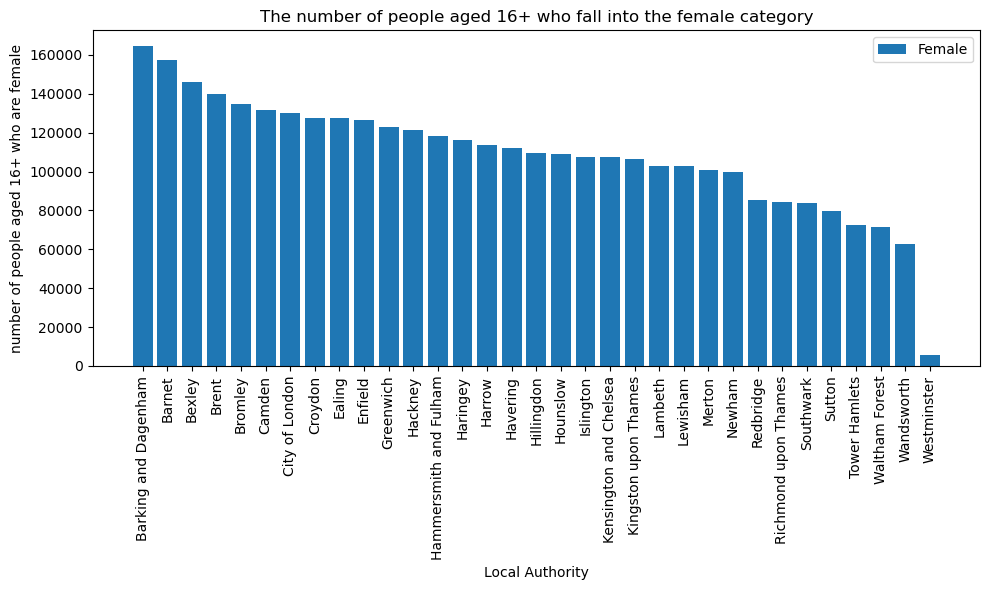

In [158]:
# plot bar chart for population_by_sex_age % of all people aged 16+ who are male in descending order
# Extract the necessary data from the dataframe
local_authorities = population_by_gender['local authority: county / unitary (as of April 2021)']
male_percentages = population_by_gender['Numerator.1'].sort_values(ascending=False)

# Set up the bar chart
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.bar(local_authorities, male_percentages, label='Female')
# plt.bar(local_authorities, female_percentages, bottom=male_percentages, label='Female', yerr = female_conf)

# Customize the chart
plt.xlabel('Local Authority')
plt.ylabel('number of people aged 16+ who are female')
plt.title('The number of people aged 16+ who fall into the female category' )
plt.xticks(rotation=90)
plt.legend()

# Display the chart
plt.tight_layout()
plt.show()


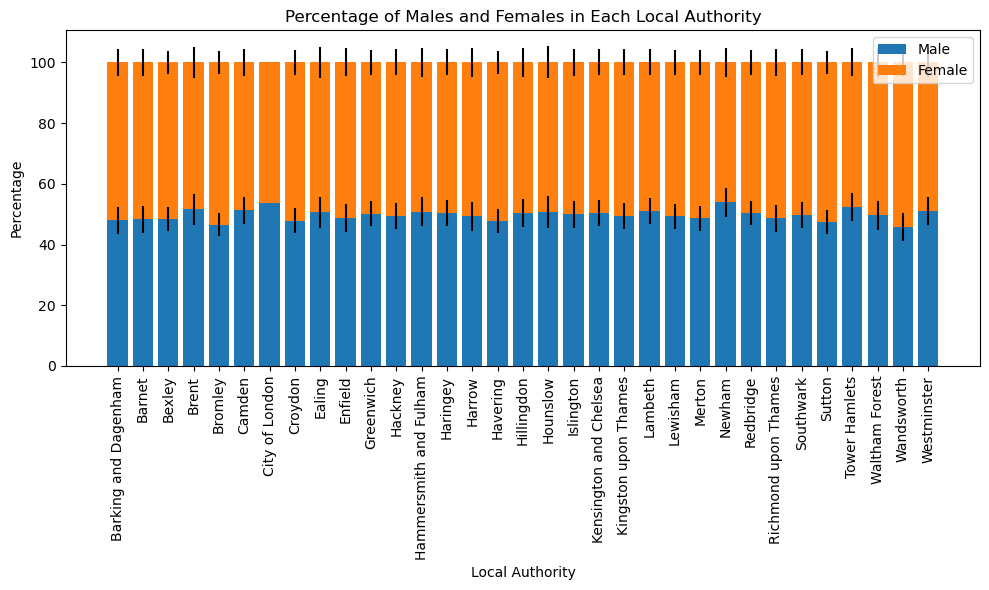

In [83]:
# plot bar chart for population_by_sex_age % of all people aged 16+ who are male
# Extract the necessary data from the dataframe
local_authorities = population_by_gender['local authority: county / unitary (as of April 2021)']
male_percentages = population_by_gender['% of all people aged 16+ who are male']
female_percentages = population_by_gender['% of all people aged 16+ who are female']
male_conf = population_by_gender['Conf']
female_conf = population_by_gender['Conf.1']

# Set up the bar chart
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.bar(local_authorities, male_percentages, label='Male',yerr = male_conf)
plt.bar(local_authorities, female_percentages, bottom=male_percentages, label='Female', yerr = female_conf)

# Customize the chart
plt.xlabel('Local Authority')
plt.ylabel('Percentage')
plt.title('Percentage of Males and Females in Each Local Authority')
plt.xticks(rotation=90)
plt.legend()

# Display the chart
plt.tight_layout()
plt.show()


In [658]:
population_by_gender.head()

,local authority: county / unitary (as of April 2021),borough_code,Numerator,Denominator,% of all people aged 16+ who are male,Conf,Numerator.1,Denominator.1,% of all people aged 16+ who are female,Conf.1
0,Barking and Dagenham,E09000002,77400.0,161200.0,48.0,4.5,83700.0,161200.0,52.0,4.5
1,Barnet,E09000003,153900.0,318300.0,48.3,4.4,164400.0,318300.0,51.7,4.4
2,Bexley,E09000004,96700.0,199600.0,48.5,3.9,102800.0,199600.0,51.5,3.9
3,Brent,E09000005,134800.0,261500.0,51.6,5.0,126700.0,261500.0,48.4,5.0
4,Bromley,E09000006,122000.0,261700.0,46.6,3.9,139800.0,261700.0,53.4,3.9


## population rate by age group

In [25]:
# import Annual_Population_rate_by_sex_age.csv
population_by_age_group = pd.read_csv("../Data/Demographics/Annual_Population_rate_by_age_group.csv", skiprows=5,header=1)
population_by_age_group.drop([33,34,35,36,37,38],inplace=True)
population_by_age_group.rename(columns={"mnemonic":"borough_code"},inplace=True)
population_by_age_group.head()

,local authority: county / unitary (as of April 2021),borough_code,Numerator,Denominator,% of all 16+ who are aged 16-19,Conf,Numerator.1,Denominator.1,% of all 16+ who are aged 20-24,Conf.1,...,% of all 16+ who are aged 35-49,Conf.3,Numerator.4,Denominator.4,% of all 16+ who are aged 50-64,Conf.4,Numerator.5,Denominator.5,% of all 16+ who are aged 65+,Conf.5
0,Barking and Dagenham,E09000002,11300,161200.0,7.0,2.3,12500,161200.0,7.7,2.4,...,28.1,4.0,32100,161200.0,19.9,3.6,24000,161200.0,14.9,3.2
1,Barnet,E09000003,16100,318300.0,5.1,1.9,30500,318300.0,9.6,2.6,...,27.2,3.9,70600,318300.0,22.2,3.6,59100,318300.0,18.6,3.4
2,Bexley,E09000004,11400,199600.0,5.7,1.8,12200,199600.0,6.1,1.9,...,26.9,3.4,46300,199600.0,23.2,3.3,42700,199600.0,21.4,3.2
3,Brent,E09000005,18000,261500.0,6.9,2.5,20500,261500.0,7.8,2.7,...,26.8,4.5,50100,261500.0,19.1,4.0,40800,261500.0,15.6,3.6
4,Bromley,E09000006,11600,261700.0,4.4,1.6,17100,261700.0,6.5,2.0,...,26.3,3.5,58600,261700.0,22.4,3.3,52000,261700.0,19.9,3.1


In [26]:
# merge population_by_age_group and london_boroughs_covered by inner join
demographics = demographics.merge(population_by_age_group, on='borough_code', how='inner')


,borough_code,geometry,borough_name,Numerator_x,Denominator_x,% of all people aged 16+ who are male,Conf_x,Numerator.1_x,Denominator.1_x,% of all people aged 16+ who are female,...,% of all 16+ who are aged 35-49,Conf.3,Numerator.4,Denominator.4,% of all 16+ who are aged 50-64,Conf.4,Numerator.5,Denominator.5,% of all 16+ who are aged 65+,Conf.5
0,E09000022,"POLYGON ((-0.12846 51.48505, -0.12843 51.48506...",Lambeth,137700.0,269500.0,51.1,4.3,131800.0,269500.0,48.9,...,27.0,3.9,47300,269500.0,17.5,3.3,24900,269500.0,9.2,2.5
1,E09000028,"POLYGON ((-0.10892 51.50844, -0.10889 51.50845...",Southwark,128800.0,258800.0,49.8,4.3,130000.0,258800.0,50.2,...,29.5,3.9,52000,258800.0,20.1,3.5,24700,258800.0,9.5,2.5
2,E09000032,"POLYGON ((-0.22343 51.47152, -0.22327 51.47146...",Wandsworth,123400.0,269300.0,45.8,4.6,145900.0,269300.0,54.2,...,28.3,4.1,44000,269300.0,16.3,3.4,33500,269300.0,12.5,3.0
3,E09000013,"POLYGON ((-0.24456 51.48870, -0.24460 51.48879...",Hammersmith and Fulham,73700.0,145100.0,50.8,4.7,71300.0,145100.0,49.2,...,28.3,4.2,25600,145100.0,17.7,3.6,18500,145100.0,12.8,3.1
4,E09000020,"POLYGON ((-0.18388 51.47742, -0.18403 51.47753...",Kensington and Chelsea,63300.0,125800.0,50.3,4.3,62500.0,125800.0,49.7,...,30.7,4.0,30800,125800.0,24.5,3.7,22000,125800.0,17.5,3.3


In [28]:
# drop local authority: county / unitary (as of April 2021)
demographics.drop(['local authority: county / unitary (as of April 2021)'], axis=1, inplace=True)

demographics.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 12 entries, 0 to 11
Data columns (total 35 columns):
 #   Column                                   Non-Null Count  Dtype   
---  ------                                   --------------  -----   
 0   borough_code                             12 non-null     object  
 1   geometry                                 12 non-null     geometry
 2   borough_name                             12 non-null     object  
 3   Numerator_x                              12 non-null     float64 
 4   Denominator_x                            12 non-null     float64 
 5   % of all people aged 16+ who are male    12 non-null     float64 
 6   Conf_x                                   12 non-null     object  
 7   Numerator.1_x                            12 non-null     float64 
 8   Denominator.1_x                          12 non-null     float64 
 9   % of all people aged 16+ who are female  12 non-null     float64 
 10  Conf.1_x                        

In [672]:
#convert rows with * or ! in the value to NaN
population_by_age_group.replace(to_replace=["*","!"],value=np.nan,inplace=True)

In [673]:
# convert all columns to float except for local authority: county / unitary (as of April 2021) and borough_code
population_by_age_group['local authority: county / unitary (as of April 2021)'] = population_by_age_group['local authority: county / unitary (as of April 2021)'].astype(str)
population_by_age_group['borough_code'] = population_by_age_group['borough_code'].astype(str)
population_by_age_group['Numerator'] = pd.to_numeric(population_by_age_group['Numerator'],errors='coerce').astype(float)
population_by_age_group['Denominator'] = pd.to_numeric(population_by_age_group['Denominator'],errors='coerce').astype(float)
population_by_age_group['% of all 16+ who are aged 16-19'] = pd.to_numeric(population_by_age_group['% of all 16+ who are aged 16-19'],errors='coerce').astype(float)
population_by_age_group['Conf'] = pd.to_numeric(population_by_age_group['Conf'],errors='coerce').astype(float)
population_by_age_group['Numerator.1'] = pd.to_numeric(population_by_age_group['Numerator.1'],errors='coerce').astype(float)
population_by_age_group['Denominator.1'] = pd.to_numeric(population_by_age_group['Denominator.1'],errors='coerce').astype(float)
population_by_age_group['% of all 16+ who are aged 20-24'] = pd.to_numeric(population_by_age_group['% of all 16+ who are aged 20-24'],errors='coerce').astype(float)
population_by_age_group['Conf.1'] = pd.to_numeric(population_by_age_group['Conf.1'],errors='coerce').astype(float)
population_by_age_group['Numerator.2'] = pd.to_numeric(population_by_age_group['Numerator.2'],errors='coerce').astype(float)
population_by_age_group['Denominator.2'] = pd.to_numeric(population_by_age_group['Denominator.2'],errors='coerce').astype(float)
population_by_age_group['% of all 16+ who are aged 25-34'] = pd.to_numeric(population_by_age_group['% of all 16+ who are aged 25-34'],errors='coerce').astype(float)
population_by_age_group['Conf.2'] = pd.to_numeric(population_by_age_group['Conf.2'],errors='coerce').astype(float)
population_by_age_group['Numerator.3'] = pd.to_numeric(population_by_age_group['Numerator.3'],errors='coerce').astype(float)
population_by_age_group['Denominator.3'] = pd.to_numeric(population_by_age_group['Denominator.3'],errors='coerce').astype(float)
population_by_age_group['% of all 16+ who are aged 35-49'] = pd.to_numeric(population_by_age_group['% of all 16+ who are aged 35-49'],errors='coerce').astype(float)
population_by_age_group['Conf.3'] = pd.to_numeric(population_by_age_group['Conf.3'],errors='coerce').astype(float)
population_by_age_group['Numerator.4'] = pd.to_numeric(population_by_age_group['Numerator.4'],errors='coerce').astype(float)
population_by_age_group['Denominator.4'] = pd.to_numeric(population_by_age_group['Denominator.4'],errors='coerce').astype(float)
population_by_age_group['% of all 16+ who are aged 50-64'] = pd.to_numeric(population_by_age_group['% of all 16+ who are aged 50-64'],errors='coerce').astype(float)
population_by_age_group['Conf.4'] = pd.to_numeric(population_by_age_group['Conf.4'],errors='coerce').astype(float)
population_by_age_group['Numerator.5'] = pd.to_numeric(population_by_age_group['Numerator.5'],errors='coerce').astype(float)
population_by_age_group['Denominator.5'] = pd.to_numeric(population_by_age_group['Denominator.5'],errors='coerce').astype(float)
population_by_age_group['% of all 16+ who are aged 65+'] = pd.to_numeric(population_by_age_group['% of all 16+ who are aged 65+'],errors='coerce').astype(float)
population_by_age_group['Conf.5'] = pd.to_numeric(population_by_age_group['Conf.5'],errors='coerce').astype(float)

In [674]:
print(population_by_age_group.describe())

          Numerator    Denominator  % of all 16+ who are aged 16-19  \
count     32.000000      33.000000                        32.000000   
mean   11509.375000  215621.212121                         5.162500   
std     3793.488426   59576.184197                         1.192111   
min     4600.000000   12300.000000                         3.100000   
25%     9075.000000  199600.000000                         4.300000   
50%    11000.000000  220900.000000                         5.150000   
75%    14050.000000  258800.000000                         5.825000   
max    19500.000000  318300.000000                         7.400000   

            Conf   Numerator.1  Denominator.1  \
count  32.000000     32.000000      33.000000   
mean    1.940625  17281.250000  215621.212121   
std     0.268640   6694.987894   59576.184197   
min     1.400000   8200.000000   12300.000000   
25%     1.800000  12050.000000  199600.000000   
50%     1.900000  16650.000000  220900.000000   
75%     2.100000 

In [675]:
# make a copy of the population_by_age_group dataframe and rename local authority: county / unitary (as of April 2021) to borough_name
population_by_age_group_final = population_by_age_group[['local authority: county / unitary (as of April 2021)','borough_code','% of all 16+ who are aged 16-19','% of all 16+ who are aged 20-24','% of all 16+ who are aged 25-34','% of all 16+ who are aged 35-49','% of all 16+ who are aged 50-64','% of all 16+ who are aged 65+']]

population_by_age_group_final.rename(columns={"local authority: county / unitary (as of April 2021)":"borough_name"},inplace=True)

# drop rows with boroughs that are not covered by the bike stations
population_by_age_group_final = population_by_age_group_final[population_by_age_group_final['borough_code'].isin(covered_boroughs)]

population_by_age_group_final

/var/folders/pz/y4y03t6d7cd_76njhx8sjzzm0000gn/T/ipykernel_15021/171979960.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  population_by_age_group_final.rename(columns={"local authority: county / unitary (as of April 2021)":"borough_name"},inplace=True)


,borough_name,borough_code,% of all 16+ who are aged 16-19,% of all 16+ who are aged 20-24,% of all 16+ who are aged 25-34,% of all 16+ who are aged 35-49,% of all 16+ who are aged 50-64,% of all 16+ who are aged 65+
5,Camden,E09000007,4.8,10.2,20.2,24.4,24.5,15.9
6,City of London,E09000001,NaN,NaN,45.4,NaN,23.4,31.1
11,Hackney,E09000012,6.5,8.4,33.7,26.6,17.6,7.1
12,Hammersmith and Fulham,E09000013,3.2,8.6,29.5,28.3,17.7,12.8
18,Islington,E09000019,4.7,9.3,28.6,27.6,16.9,12.9
19,Kensington and Chelsea,E09000020,7.4,6.9,13.0,30.7,24.5,17.5
21,Lambeth,E09000022,4.3,10.3,31.5,27.0,17.5,9.2
24,Newham,E09000025,6.9,8.8,30.8,30.7,13.6,9.1
27,Southwark,E09000028,5.5,8.9,26.4,29.5,20.1,9.5
29,Tower Hamlets,E09000030,3.1,14.4,35.4,30.2,9.5,7.5


In [676]:
# save dataframe to csv file in ./Final Data Files/
population_by_age_group_final.to_csv('./Final Data Files/population_by_age_group.csv', index=False)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


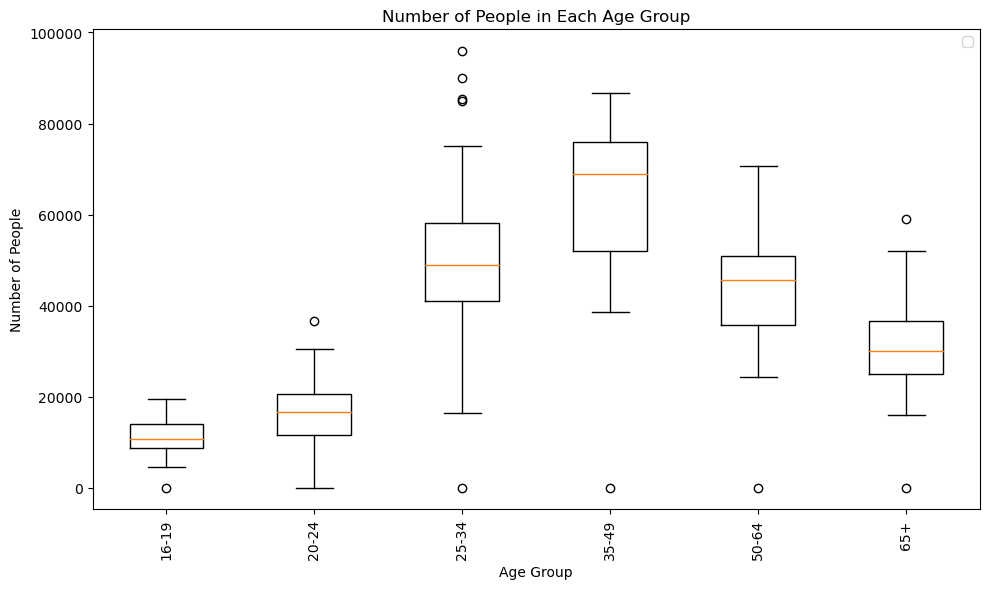

In [166]:
# plot box plot for population_by_age_group 
# Extract the necessary data from the dataframe
local_authorities = population_by_age_group['local authority: county / unitary (as of April 2021)']
age_16_19 = population_by_age_group['Numerator']
age_20_24 = population_by_age_group['Numerator.1']
age_25_34 = population_by_age_group['Numerator.2']
age_35_49 = population_by_age_group['Numerator.3']
age_50_64 = population_by_age_group['Numerator.4']
age_65_plus = population_by_age_group['Numerator.5']

# Set up the bar chart
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.boxplot([age_16_19,age_20_24,age_25_34,age_35_49,age_50_64,age_65_plus],labels=['16-19','20-24','25-34','35-49','50-64','65+'])

# Customize the chart
plt.xlabel('Age Group')
plt.ylabel('Number of People')
plt.title('Number of People in Each Age Group')
plt.xticks(rotation=90)
plt.legend()

# Display the chart
plt.tight_layout()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


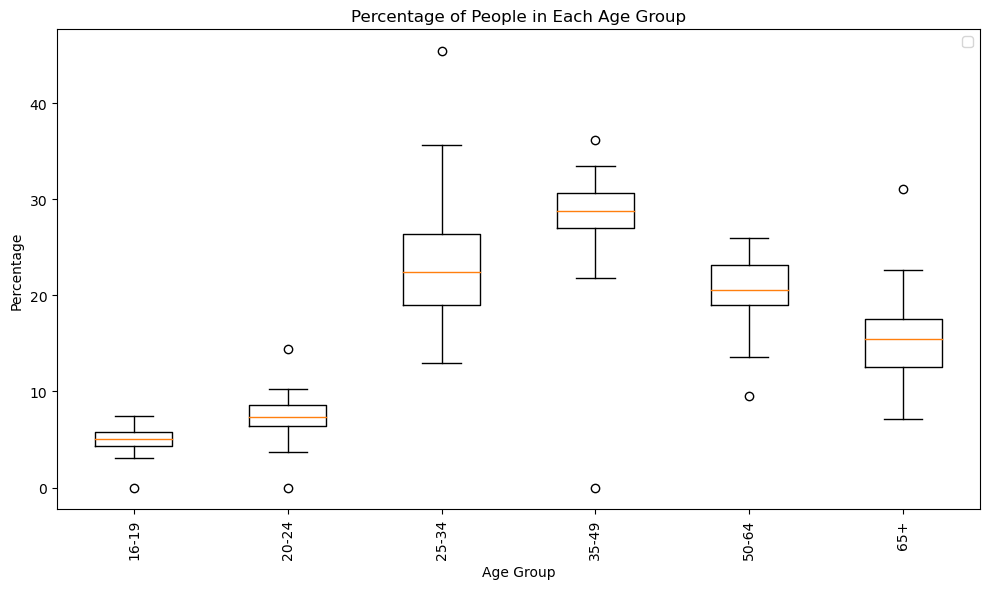

In [168]:
# plot box plot for population_by_age_group 
# Extract the necessary data from the dataframe
local_authorities = population_by_age_group['local authority: county / unitary (as of April 2021)']
age_16_19 = population_by_age_group['% of all 16+ who are aged 16-19']
age_20_24 = population_by_age_group['% of all 16+ who are aged 20-24']
age_25_34 = population_by_age_group['% of all 16+ who are aged 25-34']
age_35_49 = population_by_age_group['% of all 16+ who are aged 35-49']
age_50_64 = population_by_age_group['% of all 16+ who are aged 50-64']
age_65_plus = population_by_age_group['% of all 16+ who are aged 65+']

# Set up the bar chart
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.boxplot([age_16_19,age_20_24,age_25_34,age_35_49,age_50_64,age_65_plus],labels=['16-19','20-24','25-34','35-49','50-64','65+'])

# Customize the chart
plt.xlabel('Age Group')
plt.ylabel('Percentage')
plt.title('Percentage of People in Each Age Group')
plt.xticks(rotation=90)
plt.legend()

# Display the chart
plt.tight_layout()
plt.show()

In [120]:
# print rows with NaN values
population_by_age_group[population_by_age_group.isnull().any(axis=1)]

,local authority: county / unitary (as of April 2021),borough_code,Numerator,Denominator,% of all 16+ who are aged 16-19,Conf,Numerator.1,Denominator.1,% of all 16+ who are aged 20-24,Conf.1,...,% of all 16+ who are aged 35-49,Conf.3,Numerator.4,Denominator.4,% of all 16+ who are aged 50-64,Conf.4,Numerator.5,Denominator.5,% of all 16+ who are aged 65+,Conf.5
6,City of London,E09000001,NaN,12300.0,NaN,NaN,NaN,12300.0,NaN,NaN,...,NaN,NaN,NaN,12300.0,23.4,NaN,NaN,12300.0,31.1,NaN


In [170]:
# remove null values
# population_by_age_group.dropna(inplace=True)

# sum of all numerator and denominator for all age groups
total_numerator = population_by_age_group['Numerator'].sum()
total_numerator += population_by_age_group['Numerator.1'].sum()
total_numerator += population_by_age_group['Numerator.2'].sum()
total_numerator += population_by_age_group['Numerator.3'].sum()
total_numerator += population_by_age_group['Numerator.4'].sum()
total_numerator += population_by_age_group['Numerator.5'].sum()
total_denominator = population_by_age_group['Denominator'].sum()
total_denominator += population_by_age_group['Denominator.1'].sum()
total_denominator += population_by_age_group['Denominator.2'].sum()
total_denominator += population_by_age_group['Denominator.3'].sum()
total_denominator += population_by_age_group['Denominator.4'].sum()
total_denominator += population_by_age_group['Denominator.5'].sum()

print("total numerator: ",total_numerator, "total denominator: ",total_denominator)

total numerator:  7102700.0 total denominator:  42693000.0


### NOTE: 0 means NA and not the value 0

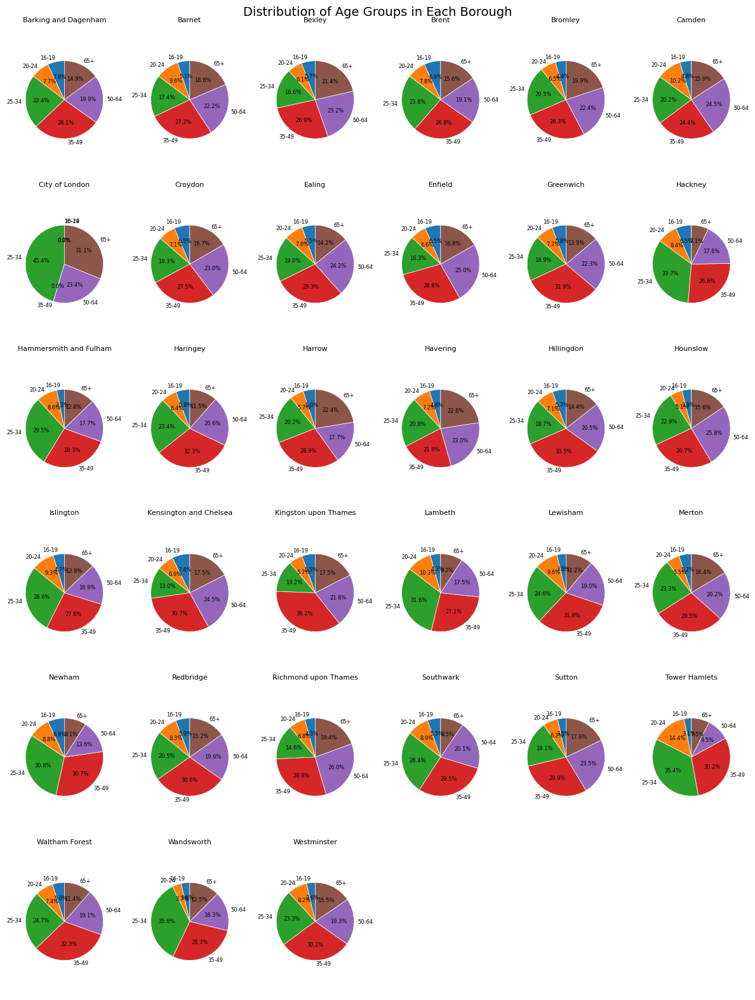

In [127]:
population_by_age_group = population_by_age_group.fillna(0)

# create a pie chart for each borough showing the percentage of people in each age group
# Extract the necessary data from the dataframe
local_authorities = population_by_age_group['local authority: county / unitary (as of April 2021)']
percentages_16_19 = population_by_age_group['% of all 16+ who are aged 16-19']
percentages_20_24 = population_by_age_group['% of all 16+ who are aged 20-24']
percentages_25_34 = population_by_age_group['% of all 16+ who are aged 25-34']
percentages_35_49 = population_by_age_group['% of all 16+ who are aged 35-49']
percentages_50_64 = population_by_age_group['% of all 16+ who are aged 50-64']
percentages_65_plus = population_by_age_group['% of all 16+ who are aged 65+']

# Set up the pie chart
plt.figure(figsize=(12, 16))  # Adjust the figure size as needed

# Iterate over each borough
for i, borough in enumerate(local_authorities):
    # Get the percentage values for the age groups for the current borough
    percentages = [
        percentages_16_19[i],
        percentages_20_24[i],
        percentages_25_34[i],
        percentages_35_49[i],
        percentages_50_64[i],
        percentages_65_plus[i]
    ]

    # Plot the pie chart for the current borough
    plt.subplot(6, 6, i+1)
    patches, _, _ = plt.pie(percentages, labels=['16-19', '20-24', '25-34', '35-49', '50-64', '65+'], autopct='%1.1f%%', startangle=90, textprops={'fontsize': 6})
    
    # Customize the pie chart
    for patch in patches:
        patch.set_edgecolor('white')  # Add white borders to the pie slices for better visibility
        patch.set_linewidth(0.5)  # Adjust the border width
        
    plt.axis('equal')  # Equal aspect ratio ensures a circular pie chart
    plt.title(borough, fontsize=8)  # Set the title as the borough name and increase the font size

plt.suptitle('Distribution of Age Groups in Each Borough', fontsize=14)  # Overall title for the entire pie chart

# Adjust spacing between subplots
plt.subplots_adjust(wspace=0.5, hspace=0.5)

# Display the chart
plt.tight_layout()
plt.show()

## Annual population rate by full time and part time employment

In [677]:
population_by_full_time_employment = pd.read_csv("../Data/Demographics/Annual_Population_rate_by_full_time_employment.csv", skiprows=5,header=1)
population_by_full_time_employment.drop([33,34,35,36,37,38,39],inplace=True)
population_by_full_time_employment.rename(columns={"mnemonic":"borough_code"},inplace=True)

In [678]:
#get row 33
population_by_full_time_employment


,local authority: county / unitary (as of April 2021),borough_code,Numerator,Denominator,% in employment working full-time - aged 16-19,Conf,Numerator.1,Denominator.1,% in employment working full-time - aged 20-24,Conf.1,Numerator.2,Denominator.2,% in employment working full-time - aged 25-49,Conf.2,Numerator.3,Denominator.3,% in employment working full-time - aged 50+,Conf.3
0,Barking and Dagenham,E09000002,2200,4600,48.0,*,5600,7100,79.0,19.4,45000,60300,74.6,6.4,20000,26300,76.0,9.2
1,Barnet,E09000003,!,3000,!,!,13900,17800,78.4,17.6,96600,117900,81.9,5.7,39800,64900,61.3,9.2
2,Bexley,E09000004,1500,2800,53.4,*,7200,9700,73.8,16.9,58800,72000,81.7,5.2,25400,37800,67.2,8.3
3,Brent,E09000005,!,2300,!,!,5600,9400,59.5,*,93000,111200,83.7,6.1,29700,42600,69.8,11.1
4,Bromley,E09000006,!,4500,!,!,7900,12400,63.4,19.3,87900,105800,83.1,4.8,35300,48700,72.6,7.8
5,Camden,E09000007,!,1700,!,!,4300,8500,50.9,*,65400,80800,80.9,6.1,28400,44900,63.3,9.3
6,City of London,E09000001,!,!,!,-,!,!,!,-,#,#,100.0,-,#,#,63.8,*
7,Croydon,E09000008,!,5800,!,!,9400,13700,69.0,20.3,98400,122800,80.2,4.9,36300,56200,64.5,8.9
8,Ealing,E09000009,!,!,!,!,12700,17300,73.7,20.9,79900,95300,83.8,6.3,37800,52400,72.2,9.9
9,Enfield,E09000010,!,3200,!,!,5900,7200,81.8,*,68700,89600,76.7,6.9,36600,51000,71.8,9.2


In [679]:
# find all rows and columns with * or ! or # in the value and assign them to NaN
population_by_full_time_employment.replace(to_replace=["*","!","#"],value=np.nan,inplace=True)

In [680]:
# print number of NaN values in each column
(population_by_full_time_employment.isnull().sum())

local authority: county / unitary (as of April 2021)     0
borough_code                                             0
Numerator                                               29
Denominator                                              8
% in employment working full-time - aged 16-19          29
Conf                                                    30
Numerator.1                                              1
Denominator.1                                            1
% in employment working full-time - aged 20-24           1
Conf.1                                                   8
Numerator.2                                              1
Denominator.2                                            1
% in employment working full-time - aged 25-49           0
Conf.2                                                   0
Numerator.3                                              1
Denominator.3                                            1
% in employment working full-time - aged 50+            

In [681]:
population_by_full_time_employment.dtypes

local authority: county / unitary (as of April 2021)     object
borough_code                                             object
Numerator                                                object
Denominator                                              object
% in employment working full-time - aged 16-19           object
Conf                                                     object
Numerator.1                                              object
Denominator.1                                            object
% in employment working full-time - aged 20-24           object
Conf.1                                                   object
Numerator.2                                              object
Denominator.2                                            object
% in employment working full-time - aged 25-49          float64
Conf.2                                                   object
Numerator.3                                              object
Denominator.3                           

In [682]:
# convert columns to float
population_by_full_time_employment['Numerator'] = pd.to_numeric(population_by_full_time_employment['Numerator'],errors='coerce').astype(float)
population_by_full_time_employment['Denominator'] = pd.to_numeric(population_by_full_time_employment['Denominator'],errors='coerce').astype(float)
population_by_full_time_employment['% in employment working full-time - aged 16-19'] = pd.to_numeric(population_by_full_time_employment['% in employment working full-time - aged 16-19'],errors='coerce').astype(float)
population_by_full_time_employment['Conf'] = pd.to_numeric(population_by_full_time_employment['Conf'],errors='coerce').astype(float)
population_by_full_time_employment['Numerator.1'] = pd.to_numeric(population_by_full_time_employment['Numerator.1'],errors='coerce').astype(float)
population_by_full_time_employment['Denominator.1'] = pd.to_numeric(population_by_full_time_employment['Denominator.1'],errors='coerce').astype(float)
population_by_full_time_employment['% in employment working full-time - aged 20-24'] = pd.to_numeric(population_by_full_time_employment['% in employment working full-time - aged 20-24'],errors='coerce').astype(float)
population_by_full_time_employment['Conf.1'] = pd.to_numeric(population_by_full_time_employment['Conf.1'],errors='coerce').astype(float)
population_by_full_time_employment['Numerator.2'] = pd.to_numeric(population_by_full_time_employment['Numerator.2'],errors='coerce').astype(float)
population_by_full_time_employment['Denominator.2'] = pd.to_numeric(population_by_full_time_employment['Denominator.2'],errors='coerce').astype(float)
population_by_full_time_employment['% in employment working full-time - aged 25-49'] = pd.to_numeric(population_by_full_time_employment['% in employment working full-time - aged 25-49'],errors='coerce').astype(float)
population_by_full_time_employment['Conf.2'] = pd.to_numeric(population_by_full_time_employment['Conf.2'],errors='coerce').astype(float)
population_by_full_time_employment['Numerator.3'] = pd.to_numeric(population_by_full_time_employment['Numerator.3'],errors='coerce').astype(float)
population_by_full_time_employment['Denominator.3'] = pd.to_numeric(population_by_full_time_employment['Denominator.3'],errors='coerce').astype(float)
population_by_full_time_employment['% in employment working full-time - aged 50+'] = pd.to_numeric(population_by_full_time_employment['% in employment working full-time - aged 50+'],errors='coerce').astype(float)
population_by_full_time_employment['Conf.3'] = pd.to_numeric(population_by_full_time_employment['Conf.3'],errors='coerce').astype(float)

In [683]:
# make copy of population_by_full_time_employment and rename local authority: county / unitary (as of April 2021) to borough_name
population_by_full_time_employment_final = population_by_full_time_employment[['local authority: county / unitary (as of April 2021)','borough_code','% in employment working full-time - aged 16-19','% in employment working full-time - aged 20-24','% in employment working full-time - aged 25-49','% in employment working full-time - aged 50+']]
population_by_full_time_employment_final.rename(columns={"local authority: county / unitary (as of April 2021)":"borough_name"},inplace=True)

# drop rows with boroughs that are not covered by the bike stations
population_by_full_time_employment_final = population_by_full_time_employment_final[population_by_full_time_employment_final['borough_code'].isin(covered_boroughs)]

population_by_full_time_employment_final

/var/folders/pz/y4y03t6d7cd_76njhx8sjzzm0000gn/T/ipykernel_15021/3724585642.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  population_by_full_time_employment_final.rename(columns={"local authority: county / unitary (as of April 2021)":"borough_name"},inplace=True)


,borough_name,borough_code,% in employment working full-time - aged 16-19,% in employment working full-time - aged 20-24,% in employment working full-time - aged 25-49,% in employment working full-time - aged 50+
5,Camden,E09000007,NaN,50.9,80.9,63.3
6,City of London,E09000001,NaN,NaN,100.0,63.8
11,Hackney,E09000012,NaN,53.8,82.5,67.1
12,Hammersmith and Fulham,E09000013,NaN,95.0,89.9,72.4
18,Islington,E09000019,NaN,72.6,82.7,71.9
19,Kensington and Chelsea,E09000020,NaN,50.9,81.3,73.4
21,Lambeth,E09000022,NaN,68.9,85.8,71.2
24,Newham,E09000025,NaN,70.7,84.5,73.0
27,Southwark,E09000028,NaN,59.1,75.9,67.5
29,Tower Hamlets,E09000030,NaN,90.9,87.2,74.5


In [684]:
# save dataframe to csv file in ./Final Data Files/
population_by_full_time_employment_final.to_csv('./Final Data Files/population_by_full_time_employment.csv', index=False)

In [645]:
# print statistics for population_by_full_time_employment
population_by_full_time_employment.describe()

,Numerator,Denominator,% in employment working full-time - aged 16-19,Conf,Numerator.1,Denominator.1,% in employment working full-time - aged 20-24,Conf.1,Numerator.2,Denominator.2,% in employment working full-time - aged 25-49,Conf.2,Numerator.3,Denominator.3,% in employment working full-time - aged 50+,Conf.3
count,4.000000,25.000000,4.00000,0.0,32.000000,32.000000,32.000000,23.000000,32.000000,32.000000,33.000000,32.000000,32.000000,32.000000,33.000000,32.000000
mean,1450.000000,2660.000000,48.30000,NaN,7593.750000,10684.375000,70.656250,18.886957,79315.625000,95728.125000,83.212121,5.337500,25653.125000,36950.000000,69.703030,9.584375
std,655.743852,1053.565375,8.52682,NaN,3723.503163,4405.136985,13.628124,3.584094,22828.775127,26477.114091,4.549159,0.744333,6819.090109,10370.989314,5.520274,1.351966
min,600.000000,1100.000000,36.40000,NaN,3000.000000,5600.000000,45.800000,10.000000,34000.000000,41800.000000,74.600000,4.300000,12800.000000,17100.000000,60.400000,7.500000
25%,1275.000000,1800.000000,45.10000,NaN,4600.000000,7025.000000,62.425000,17.400000,62900.000000,75300.000000,80.800000,4.775000,20300.000000,30275.000000,64.500000,8.500000
50%,1500.000000,2600.000000,50.70000,NaN,6900.000000,9500.000000,71.150000,19.300000,79850.000000,95950.000000,83.100000,5.200000,25250.000000,37050.000000,71.200000,9.350000
75%,1675.000000,2900.000000,53.90000,NaN,9400.000000,12725.000000,79.050000,21.350000,93850.000000,112875.000000,84.500000,6.100000,29475.000000,42150.000000,73.700000,10.225000
max,2200.000000,5800.000000,55.40000,NaN,20000.000000,22000.000000,100.000000,24.200000,128800.000000,148800.000000,100.000000,6.900000,39800.000000,64900.000000,78.600000,13.900000


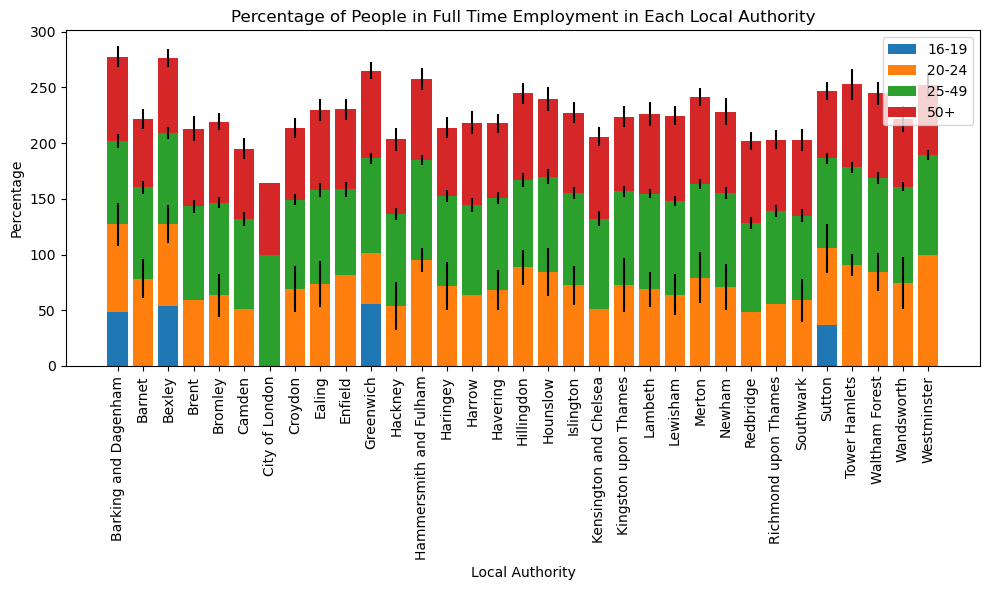

In [241]:
cleaned_population_by_full_time_employment = population_by_full_time_employment.fillna(0)

# plot bar chart for percentages with confidence in full time employment
# Extract the necessary data from the dataframe
local_authorities = cleaned_population_by_full_time_employment['local authority: county / unitary (as of April 2021)']
percentages_16_19 = cleaned_population_by_full_time_employment['% in employment working full-time - aged 16-19']
percentages_20_24 = cleaned_population_by_full_time_employment['% in employment working full-time - aged 20-24']
percentages_25_49 = cleaned_population_by_full_time_employment['% in employment working full-time - aged 25-49']
percentages_50_plus = cleaned_population_by_full_time_employment['% in employment working full-time - aged 50+']
conf_16_19 = cleaned_population_by_full_time_employment['Conf']
conf_20_24 = cleaned_population_by_full_time_employment['Conf.1']
conf_25_49 = cleaned_population_by_full_time_employment['Conf.2']
conf_50_plus = cleaned_population_by_full_time_employment['Conf.3']

# Set up the bar chart
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.bar(local_authorities, percentages_16_19, label='16-19', yerr=conf_16_19)
plt.bar(local_authorities, percentages_20_24, bottom=percentages_16_19, label='20-24', yerr=conf_20_24)
plt.bar(local_authorities, percentages_25_49, bottom=percentages_16_19+percentages_20_24, label='25-49', yerr=conf_25_49)
plt.bar(local_authorities, percentages_50_plus, bottom=percentages_16_19+percentages_20_24+percentages_25_49, label='50+', yerr=conf_50_plus)

# Customize the chart
plt.xlabel('Local Authority')
plt.ylabel('Percentage')
plt.title('Percentage of People in Full Time Employment in Each Local Authority')
plt.xticks(rotation=90)
plt.legend()

# Display the chart
plt.tight_layout()
plt.show()
    

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


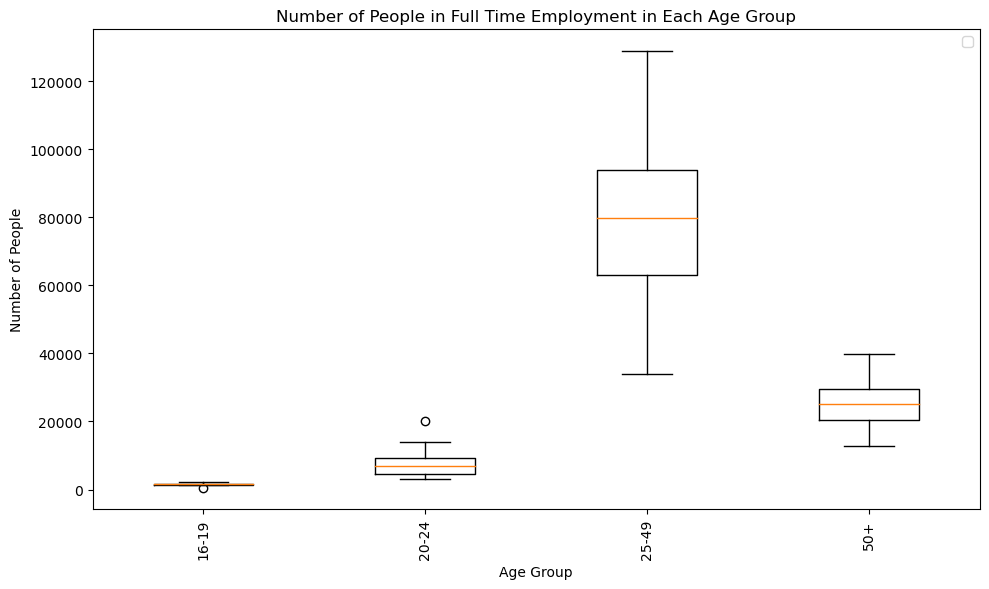

In [253]:
# plot box plot for population_by_full_time_employment
# Extract the necessary data from the dataframe
local_authorities = population_by_full_time_employment['local authority: county / unitary (as of April 2021)']
percentages_16_19 = population_by_full_time_employment['Numerator'].dropna()
percentages_20_24 = population_by_full_time_employment['Numerator.1'].dropna()
percentages_25_49 = population_by_full_time_employment['Numerator.2'].dropna()
percentages_50_plus = population_by_full_time_employment['Numerator.3'].dropna()

# Set up the bar chart
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.boxplot([percentages_16_19,percentages_20_24,percentages_25_49,percentages_50_plus],labels=['16-19','20-24','25-49','50+'])

# Customize the chart
plt.xlabel('Age Group')
plt.ylabel('Number of People')
plt.title('Number of People in Full Time Employment in Each Age Group')
plt.xticks(rotation=90)
plt.legend()

# Display the chart
plt.tight_layout()
plt.show()

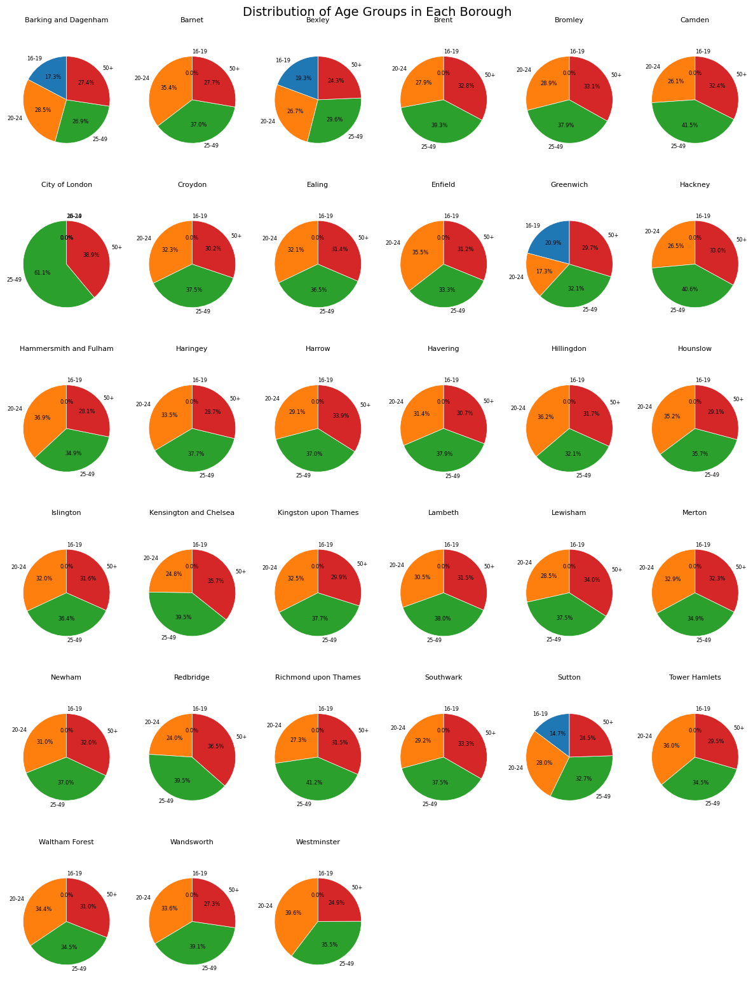

In [232]:
# compare percentage of people in full time employment in each borough
# Extract the necessary data from the dataframe
local_authorities = cleaned_population_by_full_time_employment['local authority: county / unitary (as of April 2021)']
percentages_16_19 = cleaned_population_by_full_time_employment['% in employment working full-time - aged 16-19']
percentages_20_24 = cleaned_population_by_full_time_employment['% in employment working full-time - aged 20-24']
percentages_25_49 = cleaned_population_by_full_time_employment['% in employment working full-time - aged 25-49']
percentages_50_plus = cleaned_population_by_full_time_employment['% in employment working full-time - aged 50+']

# Set up the bar chart
plt.figure(figsize=(12, 16))  # Adjust the figure size as needed

# Iterate over each borough
for i, borough in enumerate(local_authorities):
    # Get the percentage values for the age groups for the current borough
    percentages = [
        percentages_16_19[i],
        percentages_20_24[i],
        percentages_25_49[i],
        percentages_50_plus[i]
    ]

    # Plot the pie chart for the current borough
    plt.subplot(6, 6, i+1)
    patches, _, _ = plt.pie(percentages, labels=['16-19', '20-24', '25-49', '50+'], autopct='%1.1f%%', startangle=90, textprops={'fontsize': 6})
    
    # Customize the pie chart
    for patch in patches:
        patch.set_edgecolor('white')  # Add white borders to the pie slices for better visibility
        patch.set_linewidth(0.5)  # Adjust the border width
        
    plt.axis('equal')  # Equal aspect ratio ensures a circular pie chart
    plt.title(borough, fontsize=8)  # Set the title as the borough name and increase the font size
    
plt.suptitle('Distribution of Age Groups in Each Borough', fontsize=14)  # Overall title for the entire pie chart

# Adjust spacing between subplots
plt.subplots_adjust(wspace=0.5, hspace=0.5)

# Display the chart
plt.tight_layout()
plt.show()


## Part time

In [685]:
population_by_part_time_employment = pd.read_csv("../Data/Demographics/Annual_Population_rate_by_part_time_employment.csv", skiprows=5,header=1)
population_by_part_time_employment.drop([33,34,35,36,37,38,39],inplace=True)
population_by_part_time_employment.rename(columns={"mnemonic":"borough_code"},inplace=True)

In [686]:
population_by_part_time_employment.head()

,local authority: county / unitary (as of April 2021),borough_code,Numerator,Denominator,% in employment working part-time - aged 16-19,Conf,Numerator.1,Denominator.1,% in employment working part-time - aged 20-24,Conf.1,Numerator.2,Denominator.2,% in employment working part-time - aged 25-49,Conf.2,Numerator.3,Denominator.3,% in employment working part-time - aged 50+,Conf.3
0,Barking and Dagenham,E09000002,2400,4600,52.0,*,1500,7100,21.0,*,15300,60300,25.4,6.4,6300,26300,24.0,9.2
1,Barnet,E09000003,1800,3000,60.9,*,3800,17800,21.6,*,21300,117900,18.1,5.7,25100,64900,38.7,9.2
2,Bexley,E09000004,1300,2800,46.6,*,2200,9700,22.5,*,12800,72000,17.8,5.1,12400,37800,32.8,8.3
3,Brent,E09000005,2300,2300,100.0,-,3800,9400,40.5,*,18200,111200,16.3,6.1,12500,42600,29.3,11.0
4,Bromley,E09000006,4000,4500,89.9,18.7,4500,12400,36.6,*,17800,105800,16.9,4.8,13400,48700,27.4,7.8


In [687]:
# replace all rows and columns with * or ! or # in the value and assign them to NaN
population_by_part_time_employment.replace(to_replace=["*","!","#","-"],value=np.nan,inplace=True)

# print number of NaN values in each column
(population_by_part_time_employment.isnull().sum())

local authority: county / unitary (as of April 2021)     0
borough_code                                             0
Numerator                                               13
Denominator                                              8
% in employment working part-time - aged 16-19          12
Conf                                                    31
Numerator.1                                              7
Denominator.1                                            1
% in employment working part-time - aged 20-24           6
Conf.1                                                  28
Numerator.2                                              1
Denominator.2                                            1
% in employment working part-time - aged 25-49           1
Conf.2                                                   1
Numerator.3                                              1
Denominator.3                                            1
% in employment working part-time - aged 50+            

In [247]:
#print nan values
population_by_part_time_employment[population_by_part_time_employment.isnull().any(axis=1)]

,local authority: county / unitary (as of April 2021),borough_code,Numerator,Denominator,% in employment working part-time - aged 16-19,Conf,Numerator.1,Denominator.1,% in employment working part-time - aged 20-24,Conf.1,Numerator.2,Denominator.2,% in employment working part-time - aged 25-49,Conf.2,Numerator.3,Denominator.3,% in employment working part-time - aged 50+,Conf.3
0,Barking and Dagenham,E09000002,2400,4600,52.0,NaN,1500,7100,21.0,NaN,15300,60300,25.4,6.4,6300,26300,24.0,9.2
1,Barnet,E09000003,1800,3000,60.9,NaN,3800,17800,21.6,NaN,21300,117900,18.1,5.7,25100,64900,38.7,9.2
2,Bexley,E09000004,1300,2800,46.6,NaN,2200,9700,22.5,NaN,12800,72000,17.8,5.1,12400,37800,32.8,8.3
3,Brent,E09000005,2300,2300,100.0,NaN,3800,9400,40.5,NaN,18200,111200,16.3,6.1,12500,42600,29.3,11.0
4,Bromley,E09000006,4000,4500,89.9,18.7,4500,12400,36.6,NaN,17800,105800,16.9,4.8,13400,48700,27.4,7.8
5,Camden,E09000007,NaN,1700,NaN,NaN,4200,8500,49.1,NaN,15400,80800,19.1,6.1,16100,44900,35.9,9.2
6,City of London,E09000001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,Croydon,E09000008,5000,5800,86.2,18.8,4200,13700,31.0,NaN,24400,122800,19.8,4.9,19300,56200,34.4,8.8
8,Ealing,E09000009,NaN,NaN,NaN,NaN,4500,17300,26.3,NaN,15400,95300,16.2,6.3,14600,52400,27.8,9.9
9,Enfield,E09000010,2400,3200,76.5,NaN,NaN,7200,NaN,NaN,20300,89600,22.7,6.8,14400,51000,28.2,9.2


In [688]:
# convert columns to float
population_by_part_time_employment['Numerator'] = pd.to_numeric(population_by_part_time_employment['Numerator'],errors='coerce').astype(float)
population_by_part_time_employment['Denominator'] = pd.to_numeric(population_by_part_time_employment['Denominator'],errors='coerce').astype(float)
population_by_part_time_employment['% in employment working part-time - aged 16-19'] = pd.to_numeric(population_by_part_time_employment['% in employment working part-time - aged 16-19'],errors='coerce').astype(float)
population_by_part_time_employment['Conf'] = pd.to_numeric(population_by_part_time_employment['Conf'],errors='coerce').astype(float)
population_by_part_time_employment['Numerator.1'] = pd.to_numeric(population_by_part_time_employment['Numerator.1'],errors='coerce').astype(float)
population_by_part_time_employment['Denominator.1'] = pd.to_numeric(population_by_part_time_employment['Denominator.1'],errors='coerce').astype(float)
population_by_part_time_employment['% in employment working part-time - aged 20-24'] = pd.to_numeric(population_by_part_time_employment['% in employment working part-time - aged 20-24'],errors='coerce').astype(float)
population_by_part_time_employment['Conf.1'] = pd.to_numeric(population_by_part_time_employment['Conf.1'],errors='coerce').astype(float)
population_by_part_time_employment['Numerator.2'] = pd.to_numeric(population_by_part_time_employment['Numerator.2'],errors='coerce').astype(float)
population_by_part_time_employment['Denominator.2'] = pd.to_numeric(population_by_part_time_employment['Denominator.2'],errors='coerce').astype(float)
population_by_part_time_employment['% in employment working part-time - aged 25-49'] = pd.to_numeric(population_by_part_time_employment['% in employment working part-time - aged 25-49'],errors='coerce').astype(float)
population_by_part_time_employment['Conf.2'] = pd.to_numeric(population_by_part_time_employment['Conf.2'],errors='coerce').astype(float)
population_by_part_time_employment['Numerator.3'] = pd.to_numeric(population_by_part_time_employment['Numerator.3'],errors='coerce').astype(float)
population_by_part_time_employment['Denominator.3'] = pd.to_numeric(population_by_part_time_employment['Denominator.3'],errors='coerce').astype(float)
population_by_part_time_employment['% in employment working part-time - aged 50+'] = pd.to_numeric(population_by_part_time_employment['% in employment working part-time - aged 50+'],errors='coerce').astype(float)
population_by_part_time_employment['Conf.3'] = pd.to_numeric(population_by_part_time_employment['Conf.3'],errors='coerce').astype(float)

In [689]:
# make copy of population_by_part_time_employment and rename local authority: county / unitary (as of April 2021) to borough_name
population_by_part_time_employment_final = population_by_part_time_employment[['local authority: county / unitary (as of April 2021)','borough_code','% in employment working part-time - aged 16-19','% in employment working part-time - aged 20-24','% in employment working part-time - aged 25-49','% in employment working part-time - aged 50+']]
population_by_part_time_employment_final.rename(columns={"local authority: county / unitary (as of April 2021)":"borough_name"},inplace=True)

# drop rows with boroughs that are not covered by the bike stations
population_by_part_time_employment_final = population_by_part_time_employment_final[population_by_part_time_employment_final['borough_code'].isin(covered_boroughs)]

population_by_part_time_employment_final

/var/folders/pz/y4y03t6d7cd_76njhx8sjzzm0000gn/T/ipykernel_15021/2705592078.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  population_by_part_time_employment_final.rename(columns={"local authority: county / unitary (as of April 2021)":"borough_name"},inplace=True)


,borough_name,borough_code,% in employment working part-time - aged 16-19,% in employment working part-time - aged 20-24,% in employment working part-time - aged 25-49,% in employment working part-time - aged 50+
5,Camden,E09000007,NaN,49.1,19.1,35.9
6,City of London,E09000001,NaN,NaN,NaN,NaN
11,Hackney,E09000012,81.6,46.2,16.8,31.8
12,Hammersmith and Fulham,E09000013,NaN,NaN,10.1,26.4
18,Islington,E09000019,NaN,27.4,17.3,28.1
19,Kensington and Chelsea,E09000020,NaN,49.1,18.7,26.6
21,Lambeth,E09000022,NaN,31.1,13.8,28.8
24,Newham,E09000025,69.9,29.3,15.5,27.0
27,Southwark,E09000028,84.7,40.9,23.8,32.5
29,Tower Hamlets,E09000030,NaN,9.1,12.8,25.5


In [690]:
# save dataframe to csv file in ./Final Data Files/
population_by_part_time_employment_final.to_csv('./Final Data Files/population_by_part_time_employment.csv', index=False)

In [251]:
population_by_part_time_employment.describe()

,Numerator,Denominator,% in employment working part-time - aged 16-19,Conf,Numerator.1,Denominator.1,% in employment working part-time - aged 20-24,Conf.1,Numerator.2,Denominator.2,% in employment working part-time - aged 25-49,Conf.2,Numerator.3,Denominator.3,% in employment working part-time - aged 50+,Conf.3
count,20.000000,25.000000,21.000000,2.000000,26.000000,32.000000,27.000000,5.00000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000
mean,2170.000000,2660.000000,76.100000,18.750000,3519.230769,10684.375000,32.588889,20.14000,16231.250000,95728.125000,17.134375,5.315625,11165.625000,36950.000000,29.771875,9.562500
std,990.002658,1053.565375,17.574982,0.070711,1468.065184,4405.136985,11.550302,2.69685,5034.938415,26477.114091,3.455301,0.734456,4314.312966,10370.989314,5.379845,1.344943
min,1100.000000,1100.000000,44.600000,18.700000,1200.000000,5600.000000,9.100000,15.80000,7100.000000,41800.000000,9.900000,4.300000,4400.000000,17100.000000,20.800000,7.500000
25%,1375.000000,1800.000000,63.600000,18.725000,2250.000000,7025.000000,24.050000,19.30000,12800.000000,75300.000000,15.475000,4.750000,8150.000000,30275.000000,26.100000,8.500000
50%,2050.000000,2600.000000,76.500000,18.750000,3650.000000,9500.000000,31.000000,21.30000,16050.000000,95950.000000,16.850000,5.150000,11000.000000,37050.000000,28.500000,9.350000
75%,2400.000000,2900.000000,89.900000,18.775000,4500.000000,12725.000000,40.700000,21.90000,19400.000000,112875.000000,19.125000,6.100000,13625.000000,42150.000000,33.500000,10.200000
max,5000.000000,5800.000000,100.000000,18.800000,6200.000000,22000.000000,54.200000,22.40000,30200.000000,148800.000000,25.400000,6.800000,25100.000000,64900.000000,39.500000,13.900000


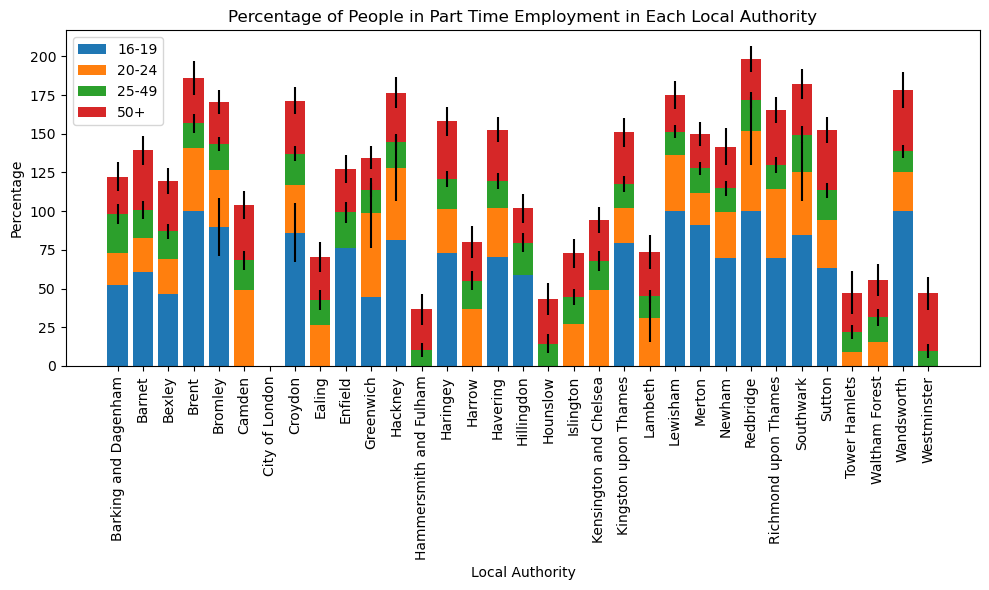

In [252]:
cleaned_population_by_part_time_employment = population_by_part_time_employment.fillna(0)

# plot bar chart for percentages with confidence in part time employment
# Extract the necessary data from the dataframe
local_authorities = cleaned_population_by_part_time_employment['local authority: county / unitary (as of April 2021)']
percentages_16_19 = cleaned_population_by_part_time_employment['% in employment working part-time - aged 16-19']
percentages_20_24 = cleaned_population_by_part_time_employment['% in employment working part-time - aged 20-24']
percentages_25_49 = cleaned_population_by_part_time_employment['% in employment working part-time - aged 25-49']
percentages_50_plus = cleaned_population_by_part_time_employment['% in employment working part-time - aged 50+']
conf_16_19 = cleaned_population_by_part_time_employment['Conf']
conf_20_24 = cleaned_population_by_part_time_employment['Conf.1']
conf_25_49 = cleaned_population_by_part_time_employment['Conf.2']
conf_50_plus = cleaned_population_by_part_time_employment['Conf.3']

# Set up the bar chart 
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.bar(local_authorities, percentages_16_19, label='16-19', yerr=conf_16_19)
plt.bar(local_authorities, percentages_20_24, bottom=percentages_16_19, label='20-24', yerr=conf_20_24)
plt.bar(local_authorities, percentages_25_49, bottom=percentages_16_19+percentages_20_24, label='25-49', yerr=conf_25_49)
plt.bar(local_authorities, percentages_50_plus, bottom=percentages_16_19+percentages_20_24+percentages_25_49, label='50+', yerr=conf_50_plus)

# Customize the chart
plt.xlabel('Local Authority')
plt.ylabel('Percentage')
plt.title('Percentage of People in Part Time Employment in Each Local Authority')
plt.xticks(rotation=90)
plt.legend()

# Display the chart
plt.tight_layout()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


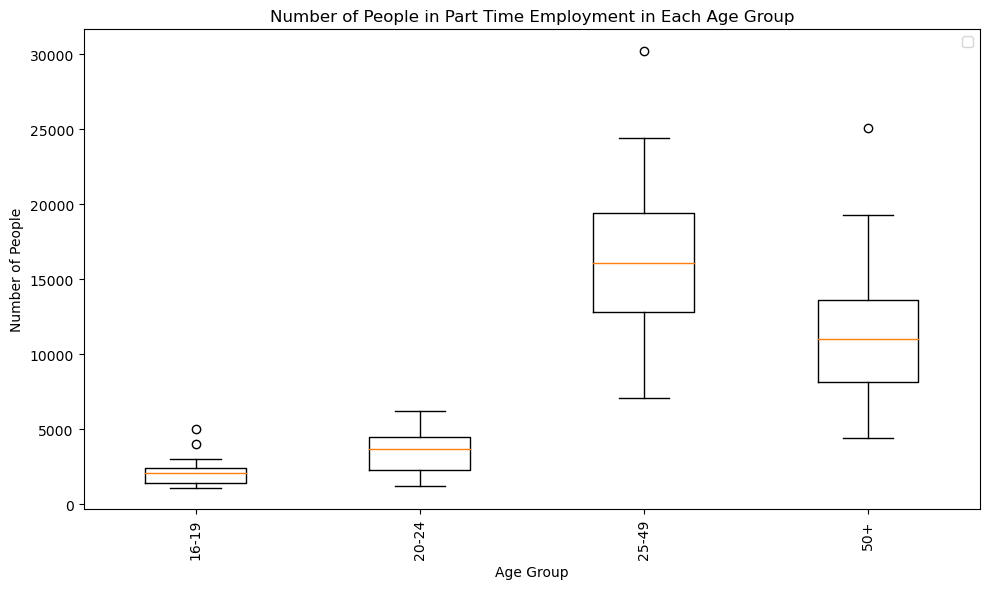

In [254]:
# plot box plot for population_by_part_time_employment
# Extract the necessary data from the dataframe
local_authorities = population_by_part_time_employment['local authority: county / unitary (as of April 2021)']
percentages_16_19 = population_by_part_time_employment['Numerator'].dropna()
percentages_20_24 = population_by_part_time_employment['Numerator.1'].dropna()
percentages_25_49 = population_by_part_time_employment['Numerator.2'].dropna()
percentages_50_plus = population_by_part_time_employment['Numerator.3'].dropna()

# Set up the bar chart
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.boxplot([percentages_16_19,percentages_20_24,percentages_25_49,percentages_50_plus],labels=['16-19','20-24','25-49','50+'])

# Customize the chart
plt.xlabel('Age Group')
plt.ylabel('Number of People')
plt.title('Number of People in Part Time Employment in Each Age Group')
plt.xticks(rotation=90)
plt.legend()

# Display the chart
plt.tight_layout()
plt.show()

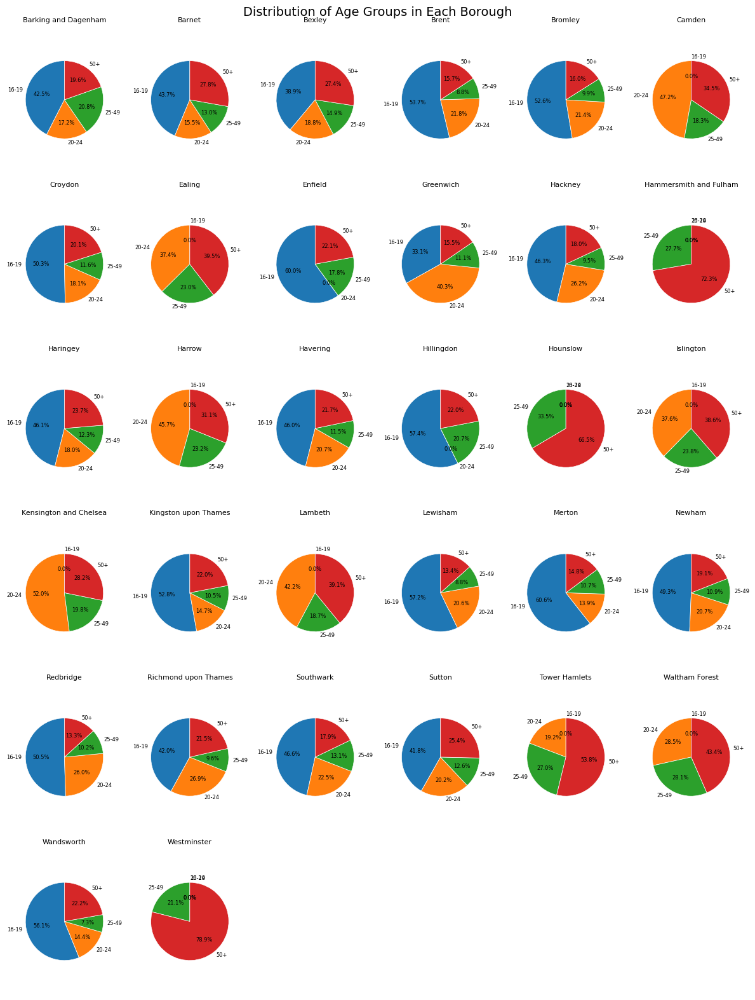

In [259]:
#remove city of london from cleaned_population_by_part_time_employment
cleaned_population_by_part_time_employment = cleaned_population_by_part_time_employment[cleaned_population_by_part_time_employment['local authority: county / unitary (as of April 2021)'] != 'City of London']

cleaned_population_by_part_time_employment.reset_index(drop=True,inplace=True)

# compare percentage of people in part time employment in each borough
# Extract the necessary data from the dataframe
local_authorities = cleaned_population_by_part_time_employment['local authority: county / unitary (as of April 2021)']
percentages_16_19 = cleaned_population_by_part_time_employment['% in employment working part-time - aged 16-19']
percentages_20_24 = cleaned_population_by_part_time_employment['% in employment working part-time - aged 20-24']
percentages_25_49 = cleaned_population_by_part_time_employment['% in employment working part-time - aged 25-49']
percentages_50_plus = cleaned_population_by_part_time_employment['% in employment working part-time - aged 50+']

# Set up the bar chart
plt.figure(figsize=(12, 16))  # Adjust the figure size as needed

# Iterate over each borough
for i, borough in enumerate(local_authorities):
    # Get the percentage values for the age groups for the current borough
    percentages = [
        percentages_16_19[i],
        percentages_20_24[i],
        percentages_25_49[i],
        percentages_50_plus[i]
    ]

    # Plot the pie chart for the current borough
    plt.subplot(6, 6, i+1)
    patches, _, _ = plt.pie(percentages, labels=['16-19', '20-24', '25-49', '50+'], autopct='%1.1f%%', startangle=90, textprops={'fontsize': 6})
    
    # Customize the pie chart
    for patch in patches:
        patch.set_edgecolor('white')  # Add white borders to the pie slices for better visibility
        patch.set_linewidth(0.5)  # Adjust the border width
        
    plt.axis('equal')  # Equal aspect ratio ensures a circular pie chart
    plt.title(borough, fontsize=8)  # Set the title as the borough name and increase the font size
    
plt.suptitle('Distribution of Age Groups in Each Borough', fontsize=14)  # Overall title for the entire pie chart

# Adjust spacing between subplots
plt.subplots_adjust(wspace=0.5, hspace=0.5)

# Display the chart
plt.tight_layout()
plt.show()

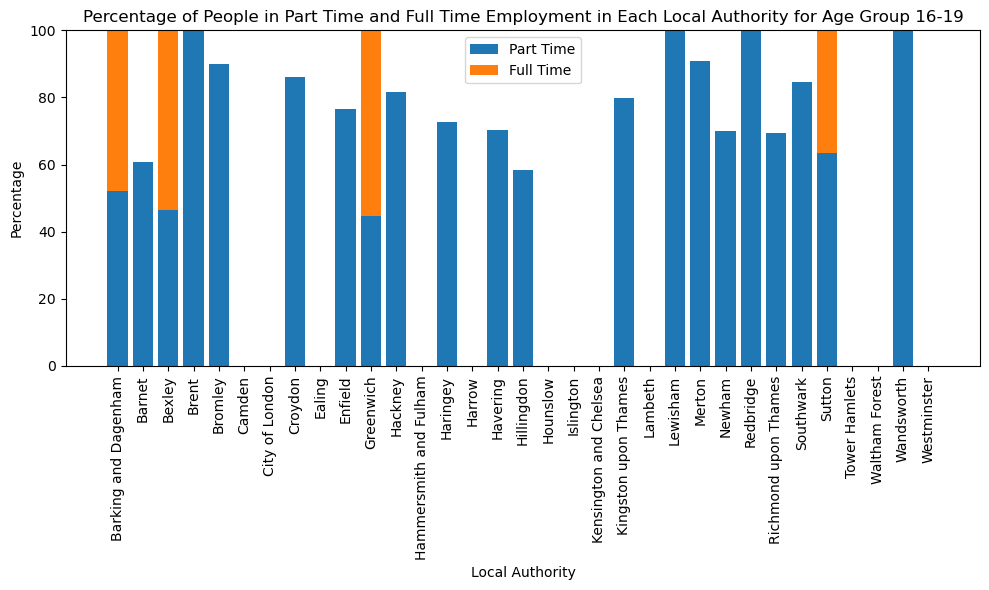

In [267]:
cleaned_population_by_part_time_employment = population_by_part_time_employment.fillna(0)

# create a bar plot that compares the average percentages of individuals employed in part-time and full-time positions for age groups 16-19 and not stacked
# Extract the necessary data from the dataframe
local_authorities = cleaned_population_by_part_time_employment['local authority: county / unitary (as of April 2021)']
percentages_16_19_part_time = cleaned_population_by_part_time_employment['% in employment working part-time - aged 16-19']
percentages_16_19_full_time = cleaned_population_by_full_time_employment['% in employment working full-time - aged 16-19']

# Set up the bar chart
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.bar(local_authorities, percentages_16_19_part_time, label='Part Time')
plt.bar(local_authorities, percentages_16_19_full_time, bottom=percentages_16_19_part_time ,label='Full Time')

# Customize the chart
plt.xlabel('Local Authority')
plt.ylabel('Percentage')
plt.title('Percentage of People in Part Time and Full Time Employment in Each Local Authority for Age Group 16-19')
plt.xticks(rotation=90)
plt.legend()

# Display the chart
plt.tight_layout()
plt.show()


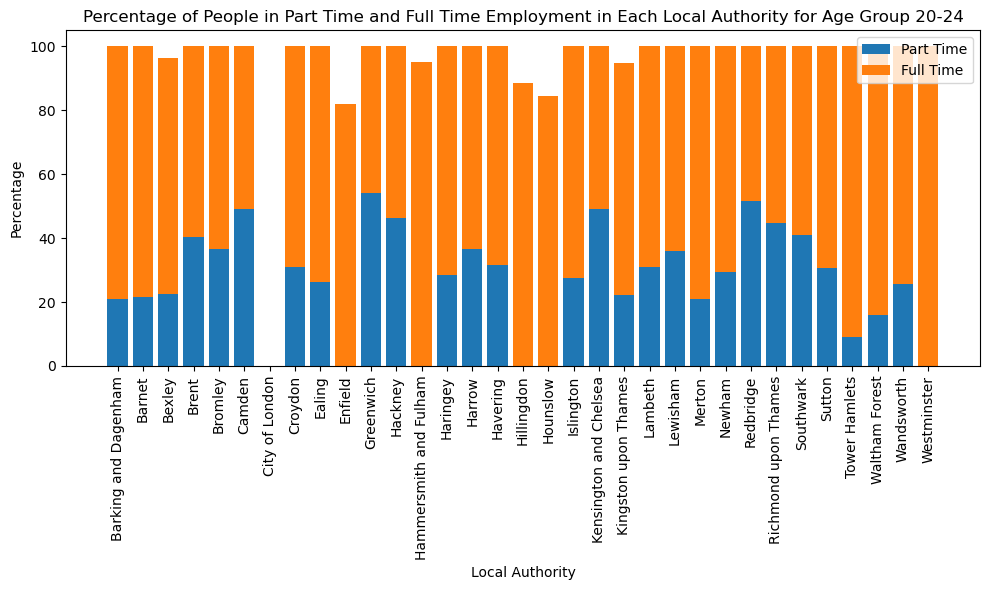

In [268]:
# create a bar plot that compares the average percentages of individuals employed in part-time and full-time positions for age groups 20-24 and not stacked
# Extract the necessary data from the dataframe
local_authorities = cleaned_population_by_part_time_employment['local authority: county / unitary (as of April 2021)']
percentages_20_24_part_time = cleaned_population_by_part_time_employment['% in employment working part-time - aged 20-24']
percentages_20_24_full_time = cleaned_population_by_full_time_employment['% in employment working full-time - aged 20-24']

# Set up the bar chart
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.bar(local_authorities, percentages_20_24_part_time, label='Part Time')
plt.bar(local_authorities, percentages_20_24_full_time, bottom=percentages_20_24_part_time ,label='Full Time')

# Customize the chart
plt.xlabel('Local Authority')
plt.ylabel('Percentage')
plt.title('Percentage of People in Part Time and Full Time Employment in Each Local Authority for Age Group 20-24')
plt.xticks(rotation=90)
plt.legend()

# Display the chart
plt.tight_layout()
plt.show()


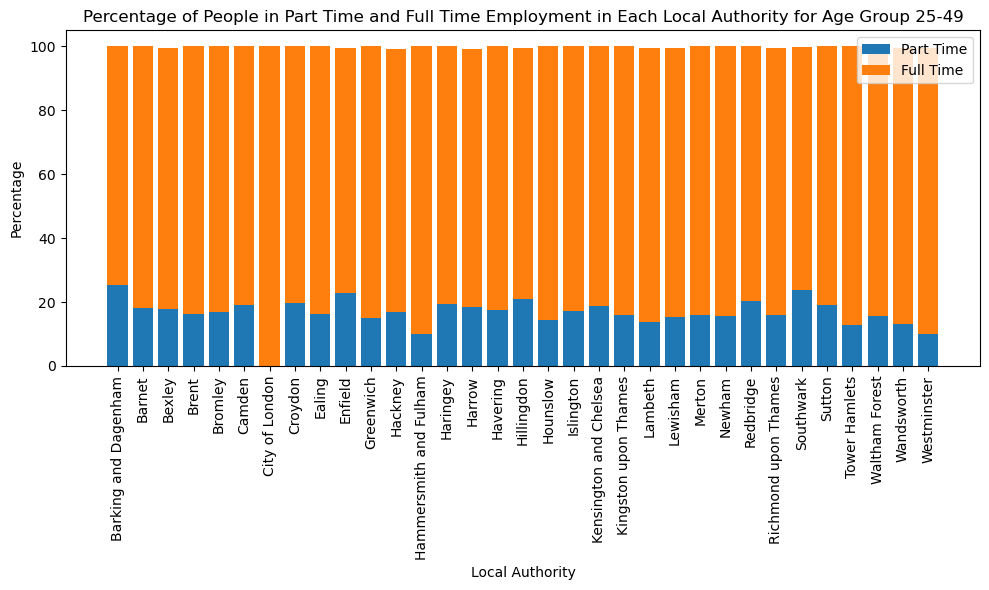

In [269]:
# create a bar plot that compares the average percentages of individuals employed in part-time and full-time positions for age groups 25-49 and not stacked
# Extract the necessary data from the dataframe
local_authorities = cleaned_population_by_part_time_employment['local authority: county / unitary (as of April 2021)']
percentages_25_49_part_time = cleaned_population_by_part_time_employment['% in employment working part-time - aged 25-49']
percentages_25_49_full_time = cleaned_population_by_full_time_employment['% in employment working full-time - aged 25-49']

# Set up the bar chart
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.bar(local_authorities, percentages_25_49_part_time, label='Part Time')
plt.bar(local_authorities, percentages_25_49_full_time, bottom=percentages_25_49_part_time ,label='Full Time')

# Customize the chart
plt.xlabel('Local Authority')
plt.ylabel('Percentage')
plt.title('Percentage of People in Part Time and Full Time Employment in Each Local Authority for Age Group 25-49')
plt.xticks(rotation=90)
plt.legend()

# Display the chart
plt.tight_layout()
plt.show()

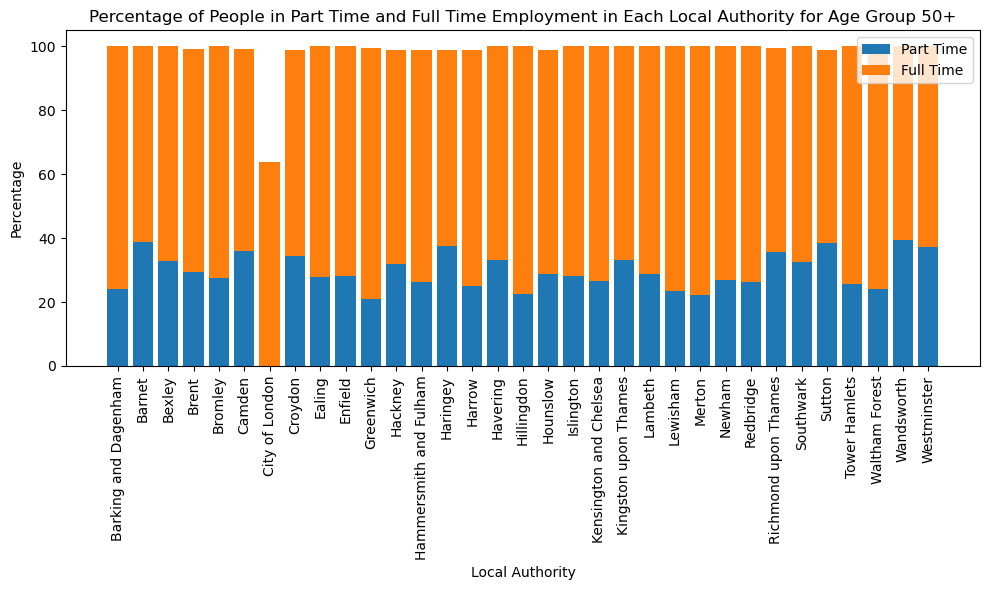

In [270]:
# create a bar plot that compares the average percentages of individuals employed in part-time and full-time positions for age groups 50+ and not stacked
# Extract the necessary data from the dataframe
local_authorities = cleaned_population_by_part_time_employment['local authority: county / unitary (as of April 2021)']
percentages_50_plus_part_time = cleaned_population_by_part_time_employment['% in employment working part-time - aged 50+']
percentages_50_plus_full_time = cleaned_population_by_full_time_employment['% in employment working full-time - aged 50+']

# Set up the bar chart
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.bar(local_authorities, percentages_50_plus_part_time, label='Part Time')
plt.bar(local_authorities, percentages_50_plus_full_time, bottom=percentages_50_plus_part_time ,label='Full Time')

# Customize the chart
plt.xlabel('Local Authority')
plt.ylabel('Percentage')
plt.title('Percentage of People in Part Time and Full Time Employment in Each Local Authority for Age Group 50+')
plt.xticks(rotation=90)
plt.legend()

# Display the chart
plt.tight_layout()
plt.show()

## Annual population rate by employment rate

In [691]:
population_by_employment_rate = pd.read_csv("../Data/Demographics/Annual_Population_rate_by_employment_rate.csv", skiprows=5,header=1)
population_by_employment_rate.drop([33,34,35],inplace=True)
population_by_employment_rate.rename(columns={"mnemonic":"borough_code"},inplace=True)

In [284]:
population_by_employment_rate

,local authority: county / unitary (as of April 2021),borough_code,Numerator,Denominator,Employment rate - aged 16+,Conf
0,Barking and Dagenham,E09000002,98400.0,161200.0,61.0,4.4
1,Barnet,E09000003,203600.0,318300.0,64.0,4.2
2,Bexley,E09000004,122300.0,199600.0,61.3,3.8
3,Brent,E09000005,165400.0,261500.0,63.3,4.8
4,Bromley,E09000006,171300.0,261700.0,65.5,3.8
5,Camden,E09000007,135900.0,220700.0,61.6,4.3
6,City of London,E09000001,10100.0,12300.0,82.3,*
7,Croydon,E09000008,198500.0,302200.0,65.7,3.8
8,Ealing,E09000009,165800.0,257900.0,64.3,4.8
9,Enfield,E09000010,151000.0,263100.0,57.4,4.6


In [692]:
# replace all rows and columns with * or ! or # in the value and assign them to NaN
population_by_employment_rate.replace(to_replace=["*","!","#","-"],value=np.nan,inplace=True)

# print number of NaN values in each column
(population_by_employment_rate.isnull().sum())

local authority: county / unitary (as of April 2021)    0
borough_code                                            0
Numerator                                               0
Denominator                                             0
Employment rate - aged 16+                              0
Conf                                                    1
dtype: int64

In [693]:
# make copy of population_by_employment_rate and rename local authority: county / unitary (as of April 2021) to borough_name
population_by_employment_rate_final = population_by_employment_rate[['local authority: county / unitary (as of April 2021)','borough_code','Employment rate - aged 16+']]
population_by_employment_rate_final.rename(columns={"local authority: county / unitary (as of April 2021)":"borough_name"},inplace=True)

# drop rows with boroughs that are not covered by the bike stations
population_by_employment_rate_final = population_by_employment_rate_final[population_by_employment_rate_final['borough_code'].isin(covered_boroughs)]

population_by_employment_rate_final


/var/folders/pz/y4y03t6d7cd_76njhx8sjzzm0000gn/T/ipykernel_15021/93616588.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  population_by_employment_rate_final.rename(columns={"local authority: county / unitary (as of April 2021)":"borough_name"},inplace=True)


,borough_name,borough_code,Employment rate - aged 16+
5,Camden,E09000007,61.6
6,City of London,E09000001,82.3
11,Hackney,E09000012,67.8
12,Hammersmith and Fulham,E09000013,67.8
18,Islington,E09000019,70.0
19,Kensington and Chelsea,E09000020,57.3
21,Lambeth,E09000022,72.3
24,Newham,E09000025,65.9
27,Southwark,E09000028,71.5
29,Tower Hamlets,E09000030,66.9


In [694]:
# save dataframe to csv file in ./Final Data Files/
population_by_employment_rate_final.to_csv('./Final Data Files/population_by_employment_rate.csv', index=False)

In [303]:
# convert column conf to float
population_by_employment_rate['Conf'] = pd.to_numeric(population_by_employment_rate['Conf'],errors='coerce').astype(float)

In [304]:
population_by_employment_rate.describe()

,Numerator,Denominator,Employment rate - aged 16+,Conf
count,33.000000,33.000000,33.000000,32.000000
mean,141481.818182,215621.212121,65.969697,4.187500
std,41019.754803,59576.184197,5.318510,0.380789
min,10100.000000,12300.000000,55.700000,3.600000
25%,114400.000000,199600.000000,62.400000,3.875000
50%,148200.000000,220900.000000,65.900000,4.100000
75%,170200.000000,258800.000000,68.800000,4.500000
max,203600.000000,318300.000000,82.300000,5.100000


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


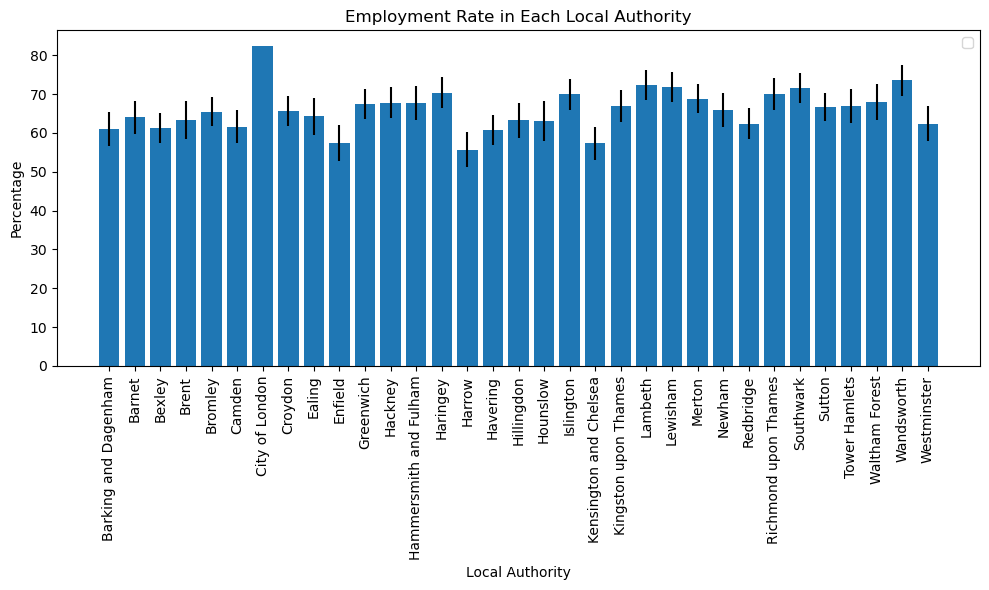

In [305]:
# plot bar chart for percentages with confidence in employment rate
# Extract the necessary data from the dataframe
local_authorities = population_by_employment_rate['local authority: county / unitary (as of April 2021)']
percentages = population_by_employment_rate['Employment rate - aged 16+']
conf = population_by_employment_rate['Conf']

# Set up the bar chart
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.bar(local_authorities, percentages, yerr=conf)

# Customize the chart
plt.xlabel('Local Authority')
plt.ylabel('Percentage')
plt.title('Employment Rate in Each Local Authority')
plt.xticks(rotation=90)
plt.legend()

# Display the chart
plt.tight_layout()
plt.show()

## Annual population rate by unemployment rate

In [695]:
population_by_unemployed= pd.read_csv("../Data/Demographics/Annual_Population_rate_by_unemployment.csv", skiprows=5,header=1)
population_by_unemployed.drop([33,34,35,36,37],inplace=True)
population_by_unemployed.rename(columns={"mnemonic":"borough_code"},inplace=True)



In [287]:
population_by_unemployed

,local authority: county / unitary (as of April 2021),borough_code,Numerator,Denominator,Unemployment rate - aged 16+,Conf
0,Barking and Dagenham,E09000002,6100,104500.0,5.9,2.6
1,Barnet,E09000003,11900,215500.0,5.5,2.5
2,Bexley,E09000004,6100,128400.0,4.7,2.1
3,Brent,E09000005,10900,176300.0,6.2,3.1
4,Bromley,E09000006,3300,174600.0,1.9,*
5,Camden,E09000007,8100,143900.0,5.6,2.6
6,City of London,E09000001,!,10100.0,!,!
7,Croydon,E09000008,7300,205800.0,3.5,1.8
8,Ealing,E09000009,7800,173600.0,4.5,2.6
9,Enfield,E09000010,11800,162900.0,7.3,3.1


In [696]:
# replace all rows and columns with * or ! or # in the value and assign them to NaN
population_by_unemployed.replace(to_replace=["*","!","#","-"],value=np.nan,inplace=True)

# print number of NaN values in each column
(population_by_unemployed.isnull().sum())

local authority: county / unitary (as of April 2021)    0
borough_code                                            0
Numerator                                               1
Denominator                                             0
Unemployment rate - aged 16+                            1
Conf                                                    4
dtype: int64

In [308]:
population_by_unemployed.dtypes

local authority: county / unitary (as of April 2021)     object
borough_code                                             object
Numerator                                                object
Denominator                                             float64
Unemployment rate - aged 16+                             object
Conf                                                     object
dtype: object

In [697]:
# convert columns to float
population_by_unemployed['Numerator'] = pd.to_numeric(population_by_unemployed['Numerator'],errors='coerce').astype(float)
population_by_unemployed['Unemployment rate - aged 16+'] = pd.to_numeric(population_by_unemployed['Unemployment rate - aged 16+'],errors='coerce').astype(float)
population_by_unemployed['Conf'] = pd.to_numeric(population_by_unemployed['Conf'],errors='coerce').astype(float)

In [698]:
# make copy of population_by_unemployed and rename local authority: county / unitary (as of April 2021) to borough_name
population_by_unemployed_final = population_by_unemployed[['local authority: county / unitary (as of April 2021)','borough_code','Unemployment rate - aged 16+']]
population_by_unemployed_final.rename(columns={"local authority: county / unitary (as of April 2021)":"borough_name"},inplace=True)

# drop rows with boroughs that are not covered by the bike stations
population_by_unemployed_final = population_by_unemployed_final[population_by_unemployed_final['borough_code'].isin(covered_boroughs)]

population_by_unemployed_final

/var/folders/pz/y4y03t6d7cd_76njhx8sjzzm0000gn/T/ipykernel_15021/1558209814.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  population_by_unemployed_final.rename(columns={"local authority: county / unitary (as of April 2021)":"borough_name"},inplace=True)


,borough_name,borough_code,Unemployment rate - aged 16+
5,Camden,E09000007,5.6
6,City of London,E09000001,NaN
11,Hackney,E09000012,4.4
12,Hammersmith and Fulham,E09000013,3.7
18,Islington,E09000019,4.2
19,Kensington and Chelsea,E09000020,5.4
21,Lambeth,E09000022,5.9
24,Newham,E09000025,4.9
27,Southwark,E09000028,4.1
29,Tower Hamlets,E09000030,4.0


In [699]:
# save dataframe to csv file in ./Final Data Files/
population_by_unemployed_final.to_csv('./Final Data Files/population_by_unemployment_rate.csv', index=False)

In [310]:
# print statistics for population_by_unemployed
population_by_unemployed.describe()

,Numerator,Denominator,Unemployment rate - aged 16+,Conf
count,32.000000,33.000000,32.000000,29.000000
mean,7018.750000,148284.848485,4.565625,2.334483
std,2648.972716,43163.657465,1.300275,0.368662
min,1100.000000,10100.000000,1.000000,1.700000
25%,5850.000000,119800.000000,3.950000,2.100000
50%,6850.000000,154900.000000,4.650000,2.200000
75%,8250.000000,176300.000000,5.425000,2.600000
max,12300.000000,215500.000000,7.300000,3.100000


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


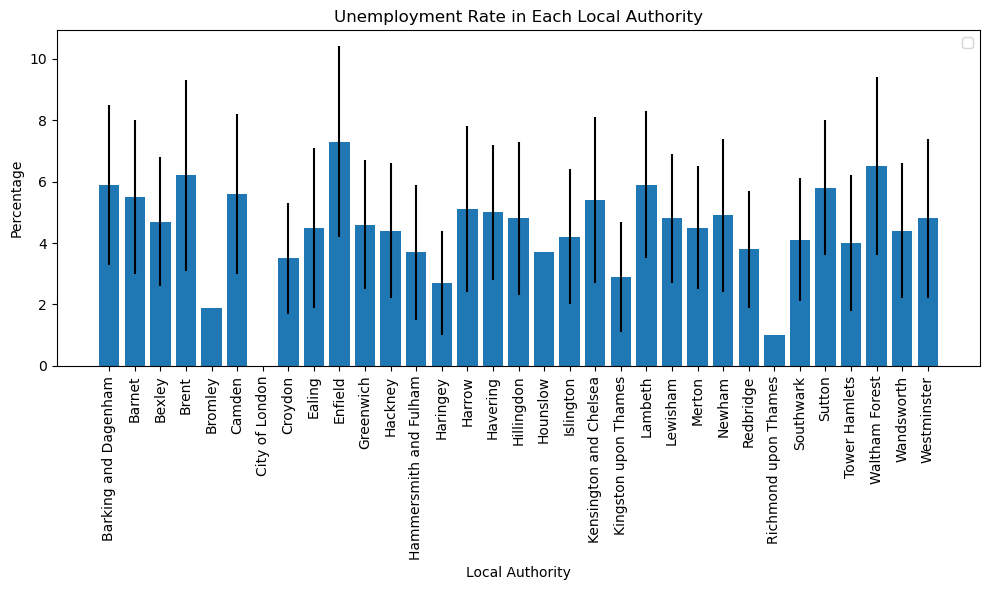

In [653]:
# plot bar chart for percentages with confidence in unemployment rate
# Extract the necessary data from the dataframe
local_authorities = population_by_unemployed['local authority: county / unitary (as of April 2021)']
percentages = population_by_unemployed['Unemployment rate - aged 16+']
conf = population_by_unemployed['Conf']

# Set up the bar chart
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.bar(local_authorities, percentages, yerr=conf)

# Customize the chart
plt.xlabel('Local Authority')
plt.ylabel('Percentage')
plt.title('Unemployment Rate in Each Local Authority')
plt.xticks(rotation=90)
plt.legend()

# Display the chart
plt.tight_layout()
plt.show()

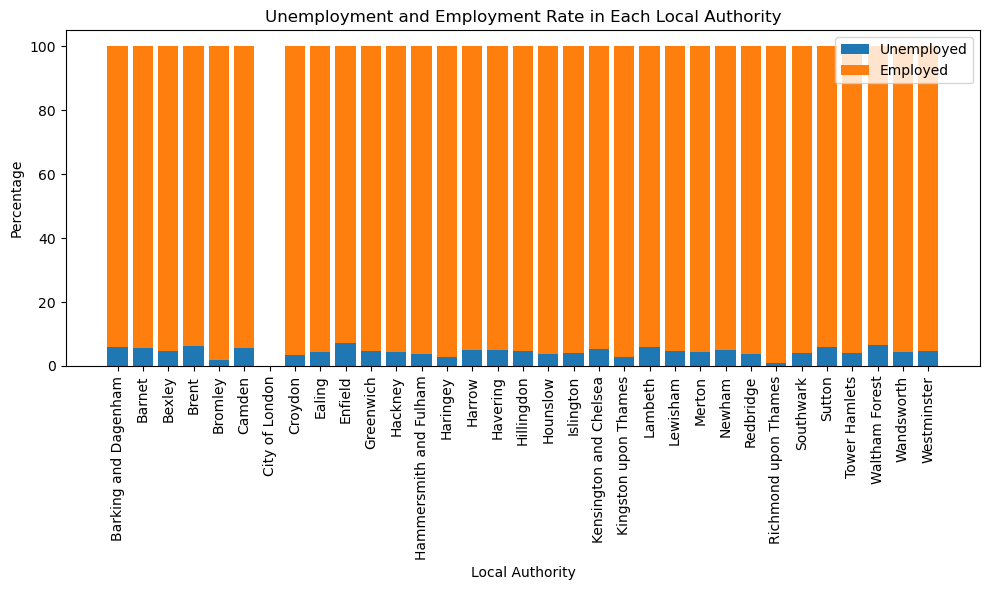

In [315]:
# compare unemployment rate and employment rate in each borough
# Extract the necessary data from the dataframe
local_authorities = population_by_unemployed['local authority: county / unitary (as of April 2021)']
percentages_unemployed = population_by_unemployed['Unemployment rate - aged 16+']
percentages_employed = 100 - population_by_unemployed['Unemployment rate - aged 16+']

# Set up the bar chart
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.bar(local_authorities, percentages_unemployed, label='Unemployed')
plt.bar(local_authorities, percentages_employed, bottom=percentages_unemployed ,label='Employed')

# Customize the chart
plt.xlabel('Local Authority')
plt.ylabel('Percentage')
plt.title('Unemployment and Employment Rate in Each Local Authority')
plt.xticks(rotation=90)
plt.legend()

# Display the chart
plt.tight_layout()
plt.show()

## Annual population rate by % aged 16+ who are employees or self-employed: 

In [700]:
population_by_employed_self_employed = pd.read_csv("../Data/Demographics/Annual_Population_rate_by_employed_or_selfemployed.csv", skiprows=5,header=1)
population_by_employed_self_employed.drop([33,34,35,36],inplace=True)
population_by_employed_self_employed.rename(columns={"mnemonic":"borough_code"},inplace=True)



In [701]:
population_by_employed_self_employed

,local authority: county / unitary (as of April 2021),borough_code,Numerator,Denominator,% in employment who are employees - aged 16+,Conf,Numerator.1,Denominator.1,% in employment who are self employed - aged 16+,Conf.1
0,Barking and Dagenham,E09000002,82000.0,98400.0,83.3,4.3,16400,98400.0,16.7,4.3
1,Barnet,E09000003,161100.0,203600.0,79.1,4.5,39600,203600.0,19.5,4.4
2,Bexley,E09000004,99100.0,122300.0,81.0,4.0,22800,122300.0,18.6,3.9
3,Brent,E09000005,126400.0,165400.0,76.4,5.6,38500,165400.0,23.3,5.6
4,Bromley,E09000006,141700.0,171300.0,82.7,3.7,29300,171300.0,17.1,3.7
5,Camden,E09000007,106400.0,135900.0,78.3,4.8,29200,135900.0,21.5,4.8
6,City of London,E09000001,7400.0,10100.0,73.0,*,#,10100.0,27.0,*
7,Croydon,E09000008,168600.0,198500.0,85.0,3.5,27000,198500.0,13.6,3.4
8,Ealing,E09000009,136000.0,165800.0,82.0,5.0,28400,165800.0,17.1,4.9
9,Enfield,E09000010,121200.0,151000.0,80.2,4.9,28100,151000.0,18.6,4.8


In [702]:
# replace all rows and columns with * or ! or # in the value and assign them to NaN
population_by_employed_self_employed.replace(to_replace=["*","!","#","-"],value=np.nan,inplace=True)

# print number of NaN values in each column
(population_by_employed_self_employed.isnull().sum())

local authority: county / unitary (as of April 2021)    0
borough_code                                            0
Numerator                                               0
Denominator                                             0
% in employment who are employees - aged 16+            0
Conf                                                    1
Numerator.1                                             1
Denominator.1                                           0
% in employment who are self employed - aged 16+        0
Conf.1                                                  1
dtype: int64

In [703]:
population_by_employed_self_employed.dtypes

local authority: county / unitary (as of April 2021)     object
borough_code                                             object
Numerator                                               float64
Denominator                                             float64
% in employment who are employees - aged 16+            float64
Conf                                                     object
Numerator.1                                              object
Denominator.1                                           float64
% in employment who are self employed - aged 16+        float64
Conf.1                                                   object
dtype: object

In [704]:
# convert columns to float
population_by_employed_self_employed['Conf'] = pd.to_numeric(population_by_employed_self_employed['Conf'],errors='coerce').astype(float)
population_by_employed_self_employed['Numerator.1'] = pd.to_numeric(population_by_employed_self_employed['Numerator.1'],errors='coerce').astype(float)
population_by_employed_self_employed['Conf.1'] = pd.to_numeric(population_by_employed_self_employed['Conf.1'],errors='coerce').astype(float)

In [705]:
# make copy of population_by_employed_self_employed and rename local authority: county / unitary (as of April 2021) to borough_name
population_by_employed_self_employed_final = population_by_employed_self_employed[['local authority: county / unitary (as of April 2021)','borough_code','% in employment who are employees - aged 16+','% in employment who are self employed - aged 16+']]
population_by_employed_self_employed_final.rename(columns={"local authority: county / unitary (as of April 2021)":"borough_name"},inplace=True)

# drop rows with boroughs that are not covered by the bike stations
population_by_employed_self_employed_final = population_by_employed_self_employed_final[population_by_employed_self_employed_final['borough_code'].isin(covered_boroughs)]

population_by_employed_self_employed_final

/var/folders/pz/y4y03t6d7cd_76njhx8sjzzm0000gn/T/ipykernel_15021/3965118696.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  population_by_employed_self_employed_final.rename(columns={"local authority: county / unitary (as of April 2021)":"borough_name"},inplace=True)


,borough_name,borough_code,% in employment who are employees - aged 16+,% in employment who are self employed - aged 16+
5,Camden,E09000007,78.3,21.5
6,City of London,E09000001,73.0,27.0
11,Hackney,E09000012,82.6,16.8
12,Hammersmith and Fulham,E09000013,83.3,16.0
18,Islington,E09000019,83.2,16.7
19,Kensington and Chelsea,E09000020,69.4,27.4
21,Lambeth,E09000022,83.2,16.0
24,Newham,E09000025,79.8,19.9
27,Southwark,E09000028,79.8,20.0
29,Tower Hamlets,E09000030,83.9,15.6


In [706]:
# save dataframe to csv file in ./Final Data Files/
population_by_employed_self_employed_final.to_csv('./Final Data Files/population_by_employed_self_employed.csv', index=False)

In [319]:
# print statistics for population_by_employed_self_employed
population_by_employed_self_employed.describe()

,Numerator,Denominator,% in employment who are employees - aged 16+,Conf,Numerator.1,Denominator.1,% in employment who are self employed - aged 16+,Conf.1
count,33.000000,33.000000,33.000000,32.000000,32.000000,33.000000,33.000000,32.000000
mean,114560.606061,141481.818182,80.603030,4.381250,26853.125000,141481.818182,18.833333,4.340625
std,34141.451523,41019.754803,4.308602,0.603451,7845.647422,41019.754803,4.096009,0.594523
min,7400.000000,10100.000000,69.400000,3.200000,13900.000000,10100.000000,10.900000,3.200000
25%,90200.000000,114400.000000,79.000000,3.900000,21975.000000,114400.000000,16.200000,3.875000
50%,115400.000000,148200.000000,81.000000,4.350000,26800.000000,148200.000000,18.700000,4.300000
75%,141700.000000,170200.000000,83.300000,4.800000,29775.000000,170200.000000,20.200000,4.800000
max,168600.000000,203600.000000,88.800000,5.600000,42100.000000,203600.000000,27.400000,5.600000


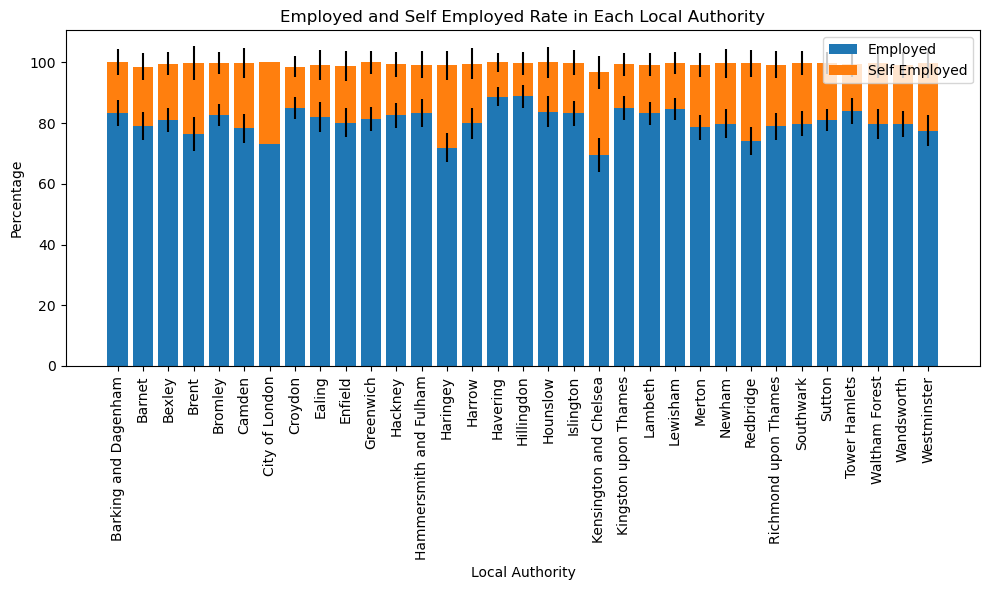

In [320]:
# plot bar chart for percentages with confidence in employed and self employed
# Extract the necessary data from the dataframe
local_authorities = population_by_employed_self_employed['local authority: county / unitary (as of April 2021)']
percentages_employed = population_by_employed_self_employed['% in employment who are employees - aged 16+']
percentages_self_employed = population_by_employed_self_employed['% in employment who are self employed - aged 16+']
conf_employed = population_by_employed_self_employed['Conf']
conf_self_employed = population_by_employed_self_employed['Conf.1']

# Set up the bar chart
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.bar(local_authorities, percentages_employed, label='Employed', yerr=conf_employed)
plt.bar(local_authorities, percentages_self_employed, bottom=percentages_employed ,label='Self Employed', yerr=conf_self_employed)

# Customize the chart
plt.xlabel('Local Authority')
plt.ylabel('Percentage')
plt.title('Employed and Self Employed Rate in Each Local Authority')
plt.xticks(rotation=90)
plt.legend()

# Display the chart
plt.tight_layout()
plt.show()


## Annual population rate by qualification

In [707]:
population_by_qualification= pd.read_csv("../Data/Demographics/Annual_Population_rate_by_qualification.csv", skiprows=5,header=1)
population_by_qualification.drop([33,34,35,36],inplace=True)
population_by_qualification.rename(columns={"mnemonic":"borough_code"},inplace=True)

In [708]:
population_by_qualification

,local authority: county / unitary (as of April 2021),borough_code,Numerator,Denominator,% with NVQ4+ - aged 16-64,Conf,Numerator.1,Denominator.1,% with NVQ3 only - aged 16-64,Conf.1,...,% with NVQ1 only - aged 16-64,Conf.3,Numerator.4,Denominator.4,% with other qualifications (NVQ) - aged 16-64,Conf.4,Numerator.5,Denominator.5,% with no qualifications (NVQ) - aged 16-64,Conf.5
0,Barking and Dagenham,E09000002,45300.0,136900.0,33.1,7.3,17400,136900.0,12.7,5.2,...,11.8,5.0,20600,136900.0,15.1,5.6,11400,136900.0,8.3,4.3
1,Barnet,E09000003,137600.0,258700.0,53.2,7.8,39500,258700.0,15.3,5.6,...,3.0,2.7,29900,258700.0,11.6,5.0,12800,258700.0,4.9,3.4
2,Bexley,E09000004,55200.0,155400.0,35.5,6.8,29200,155400.0,18.8,5.5,...,9.1,4.1,10400,155400.0,6.7,3.6,9400,155400.0,6.1,3.4
3,Brent,E09000005,105000.0,220100.0,47.7,8.9,36100,220100.0,16.4,6.6,...,3.2,3.1,21600,220100.0,9.8,5.3,15600,220100.0,7.1,4.6
4,Bromley,E09000006,113300.0,209400.0,54.1,7.0,32400,209400.0,15.4,5.1,...,7.3,3.6,13200,209400.0,6.3,3.4,8000,209400.0,3.8,2.7
5,Camden,E09000007,113000.0,185600.0,60.9,7.6,17300,185600.0,9.3,4.5,...,6.5,3.9,14200,185600.0,7.6,4.2,12500,185600.0,6.7,3.9
6,City of London,E09000001,8500.0,8500.0,100.0,-,!,8500.0,!,!,...,!,!,!,8500.0,!,!,!,8500.0,!,!
7,Croydon,E09000008,107400.0,250200.0,42.9,6.8,39700,250200.0,15.9,5.0,...,9.4,4.0,19900,250200.0,8.0,3.7,18800,250200.0,7.5,3.6
8,Ealing,E09000009,130000.0,221300.0,58.7,8.6,19600,221300.0,8.9,5.0,...,5.3,3.9,23500,221300.0,10.6,5.4,18000,221300.0,8.1,4.8
9,Enfield,E09000010,87600.0,219000.0,40.0,8.0,36300,219000.0,16.6,6.1,...,9.3,4.7,28700,219000.0,13.1,5.5,10300,219000.0,4.7,3.5


In [709]:
# replace all rows and columns with * or ! or # in the value and assign them to NaN
population_by_qualification.replace(to_replace=["*","!","#","-"],value=np.nan,inplace=True)

# print number of NaN values in each column
(population_by_qualification.isnull().sum())

local authority: county / unitary (as of April 2021)    0
borough_code                                            0
Numerator                                               0
Denominator                                             0
% with NVQ4+ - aged 16-64                               0
Conf                                                    1
Numerator.1                                             1
Denominator.1                                           0
% with NVQ3 only - aged 16-64                           1
Conf.1                                                  1
Numerator.2                                             1
Denominator.2                                           0
% with NVQ2 only - aged 16-64                           1
Conf.2                                                  1
Numerator.3                                             1
Denominator.3                                           0
% with NVQ1 only - aged 16-64                           1
Conf.3        

In [710]:


# convert columns Conf, Conf.1, Conf.2, Conf.3, Numerator.4,% with other qualifications (NVQ) - aged 16-64, Conf.3, Numerator.5,% with no qualifications (NVQ) - aged 16-64 and Conf.5  to float
population_by_qualification['Conf'] = pd.to_numeric(population_by_qualification['Conf'],errors='coerce').astype(float)
population_by_qualification['Conf.1'] = pd.to_numeric(population_by_qualification['Conf.1'],errors='coerce').astype(float)
population_by_qualification['Conf.2'] = pd.to_numeric(population_by_qualification['Conf.2'],errors='coerce').astype(float)
population_by_qualification['Conf.3'] = pd.to_numeric(population_by_qualification['Conf.3'],errors='coerce').astype(float)
population_by_qualification['Conf.4'] = pd.to_numeric(population_by_qualification['Conf.4'],errors='coerce').astype(float)
population_by_qualification['Conf.5'] = pd.to_numeric(population_by_qualification['Conf.5'],errors='coerce').astype(float)
population_by_qualification['Numerator.1'] = pd.to_numeric(population_by_qualification['Numerator.1'],errors='coerce').astype(float)
population_by_qualification['Numerator.2'] = pd.to_numeric(population_by_qualification['Numerator.2'],errors='coerce').astype(float)
population_by_qualification['Numerator.3'] = pd.to_numeric(population_by_qualification['Numerator.3'],errors='coerce').astype(float)
population_by_qualification['Numerator.4'] = pd.to_numeric(population_by_qualification['Numerator.4'],errors='coerce').astype(float)
population_by_qualification['Numerator.5'] = pd.to_numeric(population_by_qualification['Numerator.5'],errors='coerce').astype(float)
population_by_qualification['% with NVQ3 only - aged 16-64'] = pd.to_numeric(population_by_qualification['% with NVQ3 only - aged 16-64'],errors='coerce').astype(float)
population_by_qualification['% with NVQ2 only - aged 16-64'] = pd.to_numeric(population_by_qualification['% with NVQ2 only - aged 16-64'],errors='coerce').astype(float)
population_by_qualification['% with NVQ1 only - aged 16-64'] = pd.to_numeric(population_by_qualification['% with NVQ1 only - aged 16-64'],errors='coerce').astype(float)
population_by_qualification['% with other qualifications (NVQ) - aged 16-64'] = pd.to_numeric(population_by_qualification['% with other qualifications (NVQ) - aged 16-64'],errors='coerce').astype(float)
population_by_qualification['% with no qualifications (NVQ) - aged 16-64'] = pd.to_numeric(population_by_qualification['% with no qualifications (NVQ) - aged 16-64'],errors='coerce').astype(float)

population_by_qualification.dtypes

local authority: county / unitary (as of April 2021)     object
borough_code                                             object
Numerator                                               float64
Denominator                                             float64
% with NVQ4+ - aged 16-64                               float64
Conf                                                    float64
Numerator.1                                             float64
Denominator.1                                           float64
% with NVQ3 only - aged 16-64                           float64
Conf.1                                                  float64
Numerator.2                                             float64
Denominator.2                                           float64
% with NVQ2 only - aged 16-64                           float64
Conf.2                                                  float64
Numerator.3                                             float64
Denominator.3                           

In [711]:
# make copy of population_by_qualification and rename local authority: county / unitary (as of April 2021) to borough_name
population_by_qualification_final = population_by_qualification[['local authority: county / unitary (as of April 2021)','borough_code','% with NVQ1 only - aged 16-64','% with NVQ2 only - aged 16-64','% with NVQ3 only - aged 16-64','% with NVQ4+ - aged 16-64','% with other qualifications (NVQ) - aged 16-64','% with no qualifications (NVQ) - aged 16-64']]
population_by_qualification_final.rename(columns={"local authority: county / unitary (as of April 2021)":"borough_name"},inplace=True)

# drop rows with boroughs that are not covered by the bike stations
population_by_qualification_final = population_by_qualification_final[population_by_qualification_final['borough_code'].isin(covered_boroughs)]

population_by_qualification_final

/var/folders/pz/y4y03t6d7cd_76njhx8sjzzm0000gn/T/ipykernel_15021/3830409814.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  population_by_qualification_final.rename(columns={"local authority: county / unitary (as of April 2021)":"borough_name"},inplace=True)


,borough_name,borough_code,% with NVQ1 only - aged 16-64,% with NVQ2 only - aged 16-64,% with NVQ3 only - aged 16-64,% with NVQ4+ - aged 16-64,% with other qualifications (NVQ) - aged 16-64,% with no qualifications (NVQ) - aged 16-64
5,Camden,E09000007,6.5,8.1,9.3,60.9,7.6,6.7
6,City of London,E09000001,NaN,NaN,NaN,100.0,NaN,NaN
11,Hackney,E09000012,6.2,8.6,10.4,57.4,5.5,10.8
12,Hammersmith and Fulham,E09000013,2.8,5.8,10.2,70.0,5.7,4.7
18,Islington,E09000019,3.6,8.6,8.9,61.7,5.8,10.5
19,Kensington and Chelsea,E09000020,4.2,6.3,13.7,65.5,4.9,4.7
21,Lambeth,E09000022,5.7,8.5,10.7,63.8,5.9,4.3
24,Newham,E09000025,8.1,11.1,11.3,44.0,14.8,10.1
27,Southwark,E09000028,5.0,9.6,12.0,62.0,5.1,5.4
29,Tower Hamlets,E09000030,2.2,9.0,9.7,60.5,8.3,9.7


In [712]:
# save dataframe to csv file in ./Final Data Files/
population_by_qualification_final.to_csv('./Final Data Files/population_by_qualification.csv', index=False)

In [365]:
# print first 16 columns from statistics for population_by_qualification
population_by_qualification.iloc[:,0:18].describe()

,Numerator,Denominator,% with NVQ4+ - aged 16-64,Conf,Numerator.1,Denominator.1,% with NVQ3 only - aged 16-64,Conf.1,Numerator.2,Denominator.2,% with NVQ2 only - aged 16-64,Conf.2,Numerator.3,Denominator.3,% with NVQ1 only - aged 16-64,Conf.3
count,33.000000,33.000000,33.000000,32.000000,32.000000,33.000000,32.000000,32.000000,32.000000,33.000000,32.000000,32.000000,32.00000,33.000000,32.000000,32.000000
mean,99403.030303,183503.030303,55.584848,7.584375,23218.750000,183503.030303,12.375000,5.062500,20603.125000,183503.030303,10.925000,4.746875,12268.75000,183503.030303,6.596875,3.728125
std,33769.211984,53153.336471,12.875076,0.674948,7715.733298,53153.336471,2.942569,0.591744,8083.854254,53153.336471,3.866481,0.731761,5402.35537,53153.336471,2.807534,0.715828
min,8500.000000,8500.000000,33.100000,6.800000,12900.000000,8500.000000,6.200000,3.800000,6500.000000,8500.000000,5.700000,3.800000,3500.00000,8500.000000,2.200000,2.300000
25%,81800.000000,155400.000000,47.700000,7.000000,17275.000000,155400.000000,10.075000,4.600000,15150.000000,155400.000000,8.175000,4.200000,7575.00000,155400.000000,4.800000,3.175000
50%,103600.000000,195300.000000,57.400000,7.550000,21500.000000,195300.000000,12.350000,5.000000,20300.000000,195300.000000,10.300000,4.500000,12150.00000,195300.000000,6.100000,3.650000
75%,115300.000000,220100.000000,61.700000,7.925000,28100.000000,220100.000000,14.750000,5.500000,24975.000000,220100.000000,13.400000,5.125000,14950.00000,220100.000000,8.350000,4.225000
max,168300.000000,258700.000000,100.000000,9.400000,39700.000000,258700.000000,18.800000,6.600000,39000.000000,258700.000000,20.800000,6.300000,23600.00000,258700.000000,14.200000,5.000000


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


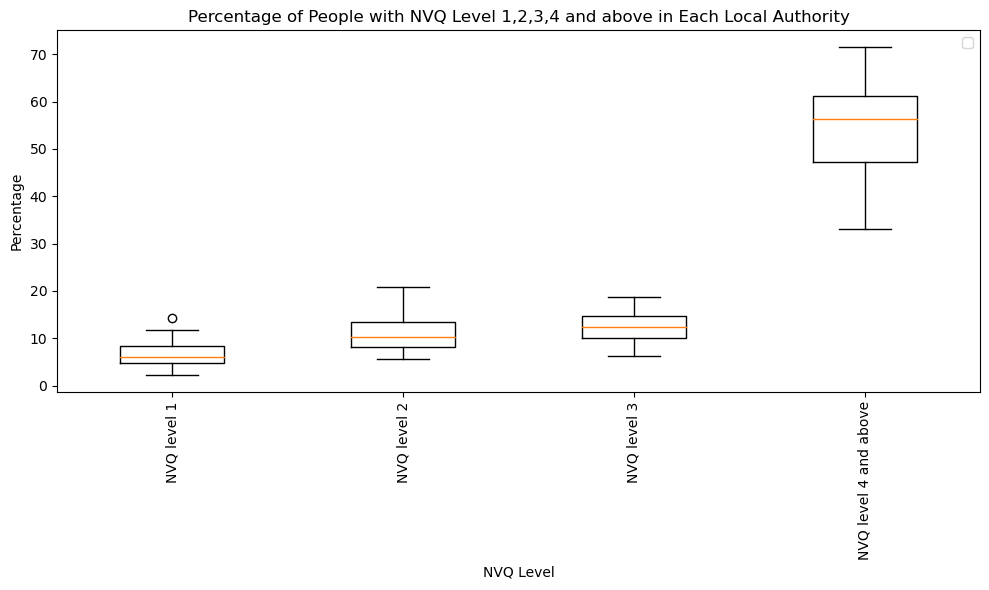

In [368]:
#Remove city of london from population_by_qualification
cleaned_population_by_qualification = population_by_qualification[population_by_qualification['local authority: county / unitary (as of April 2021)'] != 'City of London']

# box plot for NVQ level 1,2,3,4 and above
# Extract the necessary data from the dataframe
local_authorities = cleaned_population_by_qualification['local authority: county / unitary (as of April 2021)']
percentages_1 = cleaned_population_by_qualification['% with NVQ1 only - aged 16-64']
percentages_2 = cleaned_population_by_qualification['% with NVQ2 only - aged 16-64']
percentages_3 = cleaned_population_by_qualification['% with NVQ3 only - aged 16-64']
percentages_4 = cleaned_population_by_qualification['% with NVQ4+ - aged 16-64']

# Set up the bar chart
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.boxplot([percentages_1,percentages_2,percentages_3,percentages_4],labels=['NVQ level 1','NVQ level 2','NVQ level 3','NVQ level 4 and above'])

# Customize the chart
plt.xlabel('NVQ Level')
plt.ylabel('Percentage')
plt.title('Percentage of People with NVQ Level 1,2,3,4 and above in Each Local Authority')
plt.xticks(rotation=90)
plt.legend()

# Display the chart
plt.tight_layout()
plt.show()

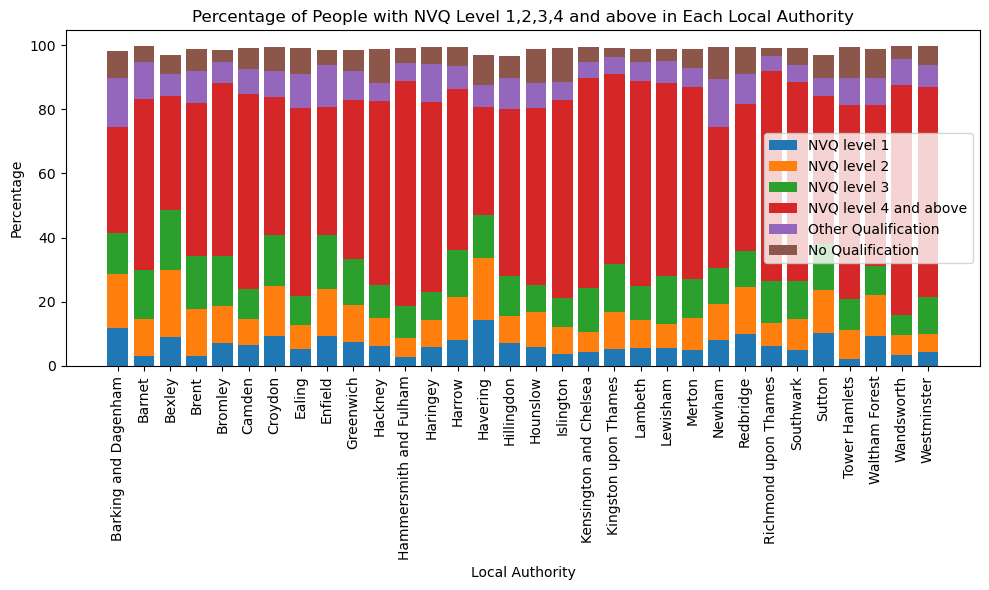

In [371]:
# bar chart for all NVQ levels
# Extract the necessary data from the dataframe
local_authorities = cleaned_population_by_qualification['local authority: county / unitary (as of April 2021)']
percentages_1 = cleaned_population_by_qualification['% with NVQ1 only - aged 16-64']
percentages_2 = cleaned_population_by_qualification['% with NVQ2 only - aged 16-64']
percentages_3 = cleaned_population_by_qualification['% with NVQ3 only - aged 16-64']
percentages_4 = cleaned_population_by_qualification['% with NVQ4+ - aged 16-64']
percentages_other_qualification = cleaned_population_by_qualification['% with other qualifications (NVQ) - aged 16-64']
percentages_no_qualification = cleaned_population_by_qualification['% with no qualifications (NVQ) - aged 16-64']


# Set up the bar chart
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.bar(local_authorities, percentages_1, label='NVQ level 1')
plt.bar(local_authorities, percentages_2, bottom=percentages_1 ,label='NVQ level 2')
plt.bar(local_authorities, percentages_3, bottom=percentages_1+percentages_2 ,label='NVQ level 3')
plt.bar(local_authorities, percentages_4, bottom=percentages_1+percentages_2+percentages_3 ,label='NVQ level 4 and above')
plt.bar(local_authorities, percentages_other_qualification, bottom=percentages_1+percentages_2+percentages_3+percentages_4 ,label='Other Qualification')
plt.bar(local_authorities, percentages_no_qualification, bottom=percentages_1+percentages_2+percentages_3+percentages_4+percentages_other_qualification ,label='No Qualification')

# Customize the chart
plt.xlabel('Local Authority')
plt.ylabel('Percentage')
plt.title('Percentage of People with NVQ Level 1,2,3,4 and above in Each Local Authority')
plt.xticks(rotation=90)
plt.legend()

# Display the chart
plt.tight_layout()
plt.show()

## UK House price index

In [725]:
houses_average_price= pd.read_excel("../Data/Demographics/UK House price index.xlsx", header=1, sheet_name="Average price", usecols="A:AH")
houses_average_price.rename(columns={"Unnamed: 0":"date"},inplace=True)

In [726]:
houses_average_price

,date,E09000001,E09000002,E09000003,E09000004,E09000005,E09000006,E09000007,E09000008,E09000009,...,E09000024,E09000025,E09000026,E09000027,E09000028,E09000029,E09000030,E09000031,E09000032,E09000033
0,1995-01-01,91448.98487,50460.22660,93284.51832,64958.09036,71306.56698,81671.47692,120932.88810,69158.16225,79885.89069,...,82070.61330,53539.31919,72189.58437,109326.12450,67885.20344,71536.97357,59865.18995,61319.44913,88559.04381,133025.27720
1,1995-02-01,82202.77314,51085.77983,93190.16963,64787.92069,72022.26197,81657.55944,119508.86220,68951.09542,80897.06551,...,79982.74872,53153.88306,72141.62610,111103.03940,64799.06480,70893.20851,62318.53353,60252.12246,88641.01678,131468.30960
2,1995-03-01,79120.70256,51268.96956,92247.52435,64367.49344,72015.76274,81449.31143,120282.21310,68712.44341,81379.86288,...,80661.68279,53458.26393,72501.35502,107325.47420,65763.29719,70306.83844,63938.67686,60871.08493,87124.81523,132260.34170
3,1995-04-01,77101.20804,53133.50526,90762.87492,64277.66881,72965.63094,81124.41227,120097.89900,68610.04641,82188.90498,...,79990.54333,54479.75395,72228.60295,106875.00000,63073.62117,69411.94390,66233.19383,60971.39722,87026.00225,133370.20360
4,1995-05-01,84409.14932,53042.24852,90258.00033,63997.13588,73704.04743,81542.61561,119929.27820,68844.91690,82077.05525,...,80873.98643,55803.95958,72366.64122,107707.67990,64420.49933,69759.21989,66432.85846,61494.16938,86518.05945,133911.11170
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
330,2022-07-01,811816.90685,348406.19705,591298.17908,396178.74246,546369.73667,503808.70803,846966.90298,419098.18458,527746.15634,...,574125.24071,414971.10578,471166.88427,744245.45590,558405.90620,439248.94614,477212.70364,511700.99539,644575.98828,972535.88034
331,2022-08-01,827263.45864,349490.50430,598728.88783,403542.57044,560870.73572,512705.31022,866072.69068,426400.97523,531255.87677,...,583235.73908,414613.78391,486446.87784,769149.48364,559064.90296,443034.23275,475969.51040,521992.12313,661326.92572,980820.47312
332,2022-09-01,798952.26179,349998.49435,603197.24048,403388.15587,583298.26696,516153.54001,855268.80541,432494.23272,537117.27594,...,592181.66614,419025.82795,485914.09877,773999.09126,562136.56367,446500.07341,485422.50097,525012.74531,664458.21743,939846.23052
333,2022-10-01,847145.43392,355205.67030,598389.13540,409595.39249,580215.08846,523083.27164,843445.80037,432431.04111,543325.53240,...,587010.24234,423410.94743,488543.98980,781115.23999,558040.21062,445194.09835,489437.43573,525588.38099,658414.41348,945112.25952


In [715]:
# create column year
houses_average_price['year'] = houses_average_price['date'].dt.year

# keep only rows with year 2019
houses_average_price = houses_average_price[houses_average_price['year'] == 2019]

# drop column year
houses_average_price.drop(columns=['year'],inplace=True)

/var/folders/pz/y4y03t6d7cd_76njhx8sjzzm0000gn/T/ipykernel_15021/2054806601.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  houses_average_price.drop(columns=['year'],inplace=True)


In [716]:
houses_average_price

,date,E09000001,E09000002,E09000003,E09000004,E09000005,E09000006,E09000007,E09000008,E09000009,...,E09000024,E09000025,E09000026,E09000027,E09000028,E09000029,E09000030,E09000031,E09000032,E09000033
288,2019-01-01,865636.1043,297180.8891,528638.9614,338707.8220,479105.7131,440623.5669,867808.2909,365096.0603,483335.7786,...,512341.0444,358029.4577,420809.5166,655055.8372,500163.8442,374144.6399,434143.1947,435182.1059,587609.0333,9.594083e+05
289,2019-02-01,894519.9090,293838.6476,523678.5865,339186.1492,478494.2101,439716.3247,864013.6218,364405.5423,476647.5977,...,520035.4982,363433.3843,411354.6502,656018.0265,489116.8776,374347.7252,427633.6537,436448.9917,579893.0364,9.178679e+05
290,2019-03-01,853451.0753,294064.7625,516531.2233,336679.6447,475429.6451,435996.2994,808859.9893,367440.2781,467017.2121,...,505346.6629,366829.9779,405219.3902,646355.5212,489970.8262,371933.8862,429001.1543,429354.7439,572644.5224,9.561110e+05
291,2019-04-01,738796.7242,295498.2169,512343.3437,339330.1231,486252.7780,431643.3640,820812.0189,363627.4384,461457.9551,...,501459.2863,366957.2935,402053.0455,639470.4059,486307.6607,368212.2656,433631.5913,432173.9751,578173.4928,9.931152e+05
292,2019-05-01,719217.5584,295092.0921,503911.1858,336980.5882,481803.4178,428092.8974,838678.6340,364097.3147,465752.3855,...,487640.9573,368549.5513,401902.1726,636736.7909,497044.0698,369566.0377,428669.7130,424654.5603,579367.9833,1.021533e+06
293,2019-06-01,761525.8718,293889.3093,512694.0604,339323.7005,474820.9106,430001.8857,871957.4503,363420.0875,474844.3044,...,498683.4153,359952.9523,408513.5851,652859.3286,494784.2522,371680.1027,428704.9816,421957.5805,574832.6167,9.951076e+05
294,2019-07-01,756407.0179,297426.4427,514667.7638,338346.4036,473849.0416,434256.6273,890288.4056,365874.7819,475591.7986,...,504701.5314,359105.5388,414967.5533,657618.6192,499662.8220,373534.2105,431289.7426,418743.4550,585174.1556,9.485067e+05
295,2019-08-01,813769.5901,299421.2615,528576.6123,337522.5984,488784.3601,442189.4650,863170.6139,364540.2452,474627.2689,...,517489.4996,361920.3425,421318.6299,657973.7414,496717.5530,368908.3512,441364.1416,427415.7542,592250.9490,9.059511e+05
296,2019-09-01,810454.6440,304778.0465,526669.7755,333339.9516,501532.5994,441057.5009,838169.6070,365225.8121,473161.8767,...,515391.0386,368687.2520,414268.4761,648146.8900,507466.4349,372899.0408,447628.8328,432270.2879,605559.3130,9.226868e+05
297,2019-10-01,826227.0620,304579.0648,525678.4213,332919.6691,494770.2634,439178.3963,804713.1225,364412.8327,477369.1395,...,509006.4346,369971.9093,411874.3367,643768.8467,513615.3866,369917.0379,452039.7471,434920.7924,600642.1217,9.277349e+05


In [717]:
# save dataframe to csv file in ./Final Data Files/
houses_average_price.to_csv('./Final Data Files/houses_average_price_2019.csv', index=False)

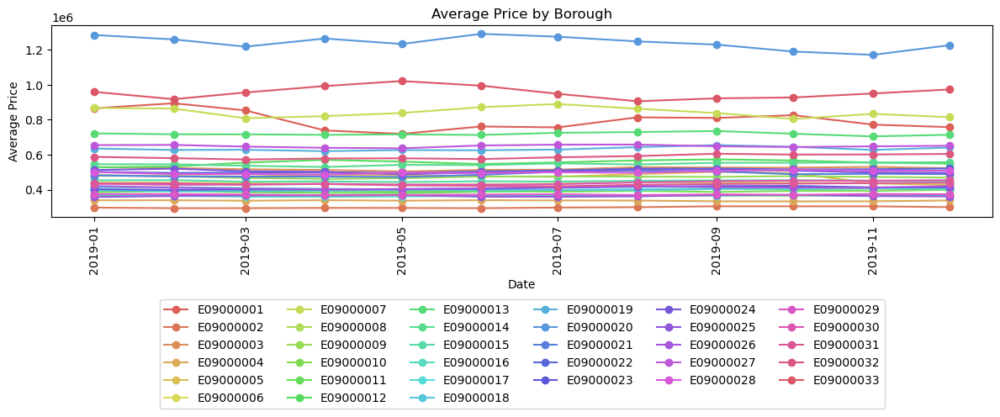

In [440]:
# Set the figure size
plt.figure(figsize=(12, 6))

palette = sns.color_palette("hls", len(houses_average_price.columns[1:]))

# Iterate over each borough
for i, borough in enumerate(houses_average_price.columns[1:]):
    # Plot the line chart for the current borough
    plt.plot(houses_average_price['date'], houses_average_price[borough], marker='o', linestyle='-', label=borough, color=palette[i])

# Customize the chart
plt.xlabel('Date')
plt.ylabel('Average Price')
plt.title('Average Price by Borough')
plt.xticks(rotation=90)
legend = plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.4), ncol=6)
plt.tight_layout()

# Display the chart
plt.show()

In [393]:
houses_average_price.set_index('date',inplace=True)

houses_average_price = houses_average_price.transpose()

houses_average_price.reset_index(inplace=True)

houses_average_price.rename(columns={"index":"borough_code"},inplace=True)

In [394]:
# add borough name to houses_average_price by using borough_code from boroughs
houses_average_price = pd.merge(houses_average_price, boroughs, on='borough_code')

houses_average_price

,borough_code,2019-01-01 00:00:00,2019-02-01 00:00:00,2019-03-01 00:00:00,2019-04-01 00:00:00,2019-05-01 00:00:00,2019-06-01 00:00:00,2019-07-01 00:00:00,2019-08-01 00:00:00,2019-09-01 00:00:00,2019-10-01 00:00:00,2019-11-01 00:00:00,2019-12-01 00:00:00,NAME
0,E09000001,8.656361e+05,8.945199e+05,8.534511e+05,7.387967e+05,7.192176e+05,7.615259e+05,7.564070e+05,8.137696e+05,8.104546e+05,8.262271e+05,7.723248e+05,7.577302e+05,City of London
1,E09000002,2.971809e+05,2.938386e+05,2.940648e+05,2.954982e+05,2.950921e+05,2.938893e+05,2.974264e+05,2.994213e+05,3.047780e+05,3.045791e+05,3.045150e+05,2.997712e+05,Barking and Dagenham
2,E09000003,5.286390e+05,5.236786e+05,5.165312e+05,5.123433e+05,5.039112e+05,5.126941e+05,5.146678e+05,5.285766e+05,5.266698e+05,5.256784e+05,5.303431e+05,5.225521e+05,Barnet
3,E09000004,3.387078e+05,3.391861e+05,3.366796e+05,3.393301e+05,3.369806e+05,3.393237e+05,3.383464e+05,3.375226e+05,3.333400e+05,3.329197e+05,3.331701e+05,3.383471e+05,Bexley
4,E09000005,4.791057e+05,4.784942e+05,4.754296e+05,4.862528e+05,4.818034e+05,4.748209e+05,4.738490e+05,4.887844e+05,5.015326e+05,4.947703e+05,4.359805e+05,4.259578e+05,Brent
5,E09000006,4.406236e+05,4.397163e+05,4.359963e+05,4.316434e+05,4.280929e+05,4.300019e+05,4.342566e+05,4.421895e+05,4.410575e+05,4.391784e+05,4.366803e+05,4.383973e+05,Bromley
6,E09000007,8.678083e+05,8.640136e+05,8.088600e+05,8.208120e+05,8.386786e+05,8.719575e+05,8.902884e+05,8.631706e+05,8.381696e+05,8.047131e+05,8.337403e+05,8.145912e+05,Camden
7,E09000008,3.650961e+05,3.644055e+05,3.674403e+05,3.636274e+05,3.640973e+05,3.634201e+05,3.658748e+05,3.645402e+05,3.652258e+05,3.644128e+05,3.681373e+05,3.718629e+05,Croydon
8,E09000009,4.833358e+05,4.766476e+05,4.670172e+05,4.614580e+05,4.657524e+05,4.748443e+05,4.755918e+05,4.746273e+05,4.731619e+05,4.773691e+05,4.725825e+05,4.690568e+05,Ealing
9,E09000010,3.956162e+05,3.972542e+05,3.939257e+05,3.938805e+05,3.885909e+05,3.907077e+05,3.880535e+05,3.930326e+05,3.868060e+05,3.927205e+05,3.925726e+05,3.989282e+05,Enfield


In [396]:
# create column total average price
houses_average_price['total_average_price'] = houses_average_price.iloc[:,1:].mean(axis=1)

/var/folders/pz/y4y03t6d7cd_76njhx8sjzzm0000gn/T/ipykernel_15021/1796976058.py:2: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  houses_average_price['total_average_price'] = houses_average_price.iloc[:,1:].mean(axis=1)


In [397]:
#round all numerical values by 3 decimal places
houses_average_price = houses_average_price.round(3)

In [403]:
houses_average_price.head()

,borough_code,2019-01-01 00:00:00,2019-02-01 00:00:00,2019-03-01 00:00:00,2019-04-01 00:00:00,2019-05-01 00:00:00,2019-06-01 00:00:00,2019-07-01 00:00:00,2019-08-01 00:00:00,2019-09-01 00:00:00,2019-10-01 00:00:00,2019-11-01 00:00:00,2019-12-01 00:00:00,NAME,total_average_price
19,E09000020,1285330.700,1259857.800,1218616.659,1264888.871,1233812.291,1291763.476,1275437.229,1248525.496,1230181.192,1190436.646,1171530.405,1226692.524,Kensington and Chelsea,1241422.774
32,E09000033,959408.344,917867.867,956110.983,993115.186,1021532.538,995107.649,948506.683,905951.067,922686.757,927734.942,950463.422,973497.869,Westminster,955998.609
6,E09000007,867808.291,864013.622,808859.989,820812.019,838678.634,871957.450,890288.406,863170.614,838169.607,804713.122,833740.318,814591.164,Camden,843066.936
0,E09000001,865636.104,894519.909,853451.075,738796.724,719217.558,761525.872,756407.018,813769.590,810454.644,826227.062,772324.819,757730.165,City of London,797505.045
12,E09000013,722045.093,716796.359,716606.448,713757.591,716331.117,713137.331,725253.095,729659.392,735537.607,719932.400,704862.360,714044.329,Hammersmith and Fulham,718996.927


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


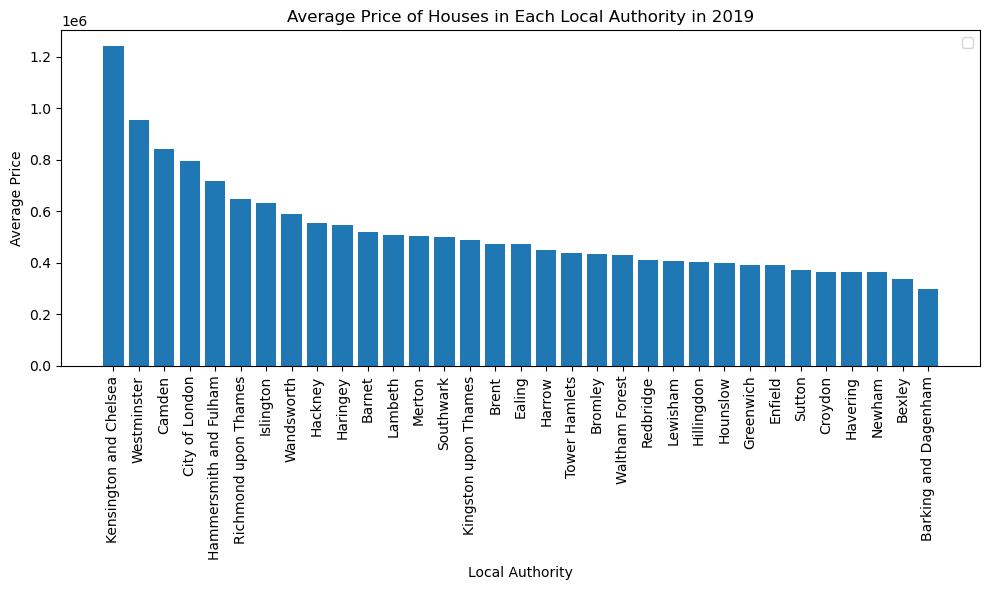

In [402]:
#sort values by total_average_price
houses_average_price.sort_values(by=['total_average_price'],ascending=False,inplace=True)

# plot bar chart for average price in each borough
# Extract the necessary data from the dataframe
local_authorities = houses_average_price['NAME']
average_prices = houses_average_price['total_average_price']

# Set up the bar chart
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.bar(local_authorities, average_prices)

# Customize the chart
plt.xlabel('Local Authority')
plt.ylabel('Average Price')
plt.title('Average Price of Houses in Each Local Authority in 2019')
plt.xticks(rotation=90)
plt.legend()

# Display the chart
plt.tight_layout()
plt.show()


## annual survey of hours and earnings - resident analysis

### Weekly gross by median

In [718]:
# read excel file
earnings_median_weeklypay = pd.read_excel("../Data/Demographics/earnings-residence-borough_mean_median_percentiles.xlsx", sheet_name='Median; Weekly pay - gross', skiprows=7,header=1, skipfooter=7)

# rename columns
rename_columns = {
    'Unnamed: 1': 'borough_code',
    'Male Full Time Workers':'Male Full Time Workers - number',
    'Unnamed: 3':'Male Full Time Workers - conf',
    'Male Part Time Workers' : 'Male Part Time Workers - number',
    'Unnamed: 5': 'Male Part Time Workers - conf',
    'Female Full Time Workers': 'Female Full Time Workers - number',
    'Unnamed: 7': 'Female Full Time Workers - conf',
    'Female Part Time Workers':'Female Part Time Workers - number',
    'Unnamed: 9': 'Female Part Time Workers - conf',
    'Total': 'Total - number',
    'Unnamed: 11': 'Total - conf',
    'Full Time Workers': 'Full Time Workers - number',
    'Unnamed: 13': 'Full Time Workers - conf',
    'Part Time Workers': 'Part Time Workers - number',
    'Unnamed: 15': 'Part Time Workers - conf'
}

earnings_median_weeklypay.rename(columns=rename_columns, inplace=True)

# remove first row
earnings_median_weeklypay.drop([0],inplace=True)

In [719]:
earnings_median_weeklypay.head()

,local authority: county / unitary (as of April 2021),borough_code,Male Full Time Workers - number,Male Full Time Workers - conf,Male Part Time Workers - number,Male Part Time Workers - conf,Female Full Time Workers - number,Female Full Time Workers - conf,Female Part Time Workers - number,Female Part Time Workers - conf,Total - number,Total - conf,Full Time Workers - number,Full Time Workers - conf,Part Time Workers - number,Part Time Workers - conf
1,Barking and Dagenham,E09000002,638.2,4.7,191.8,13,537.7,8,194.5,9.5,471,6.1,589.8,3.9,194.4,7.8
2,Barnet,E09000003,750.4,6.9,202.1,9.2,633,5,204.2,11,536.4,4.4,677.5,4.8,203.7,7.8
3,Bexley,E09000004,730,5.6,#,#,613.2,5.8,195.8,9.4,553.4,5.1,671,4.2,209.2,8.9
4,Brent,E09000005,642.4,4.7,196.4,12,577.2,4.1,202.8,8.2,524,4,609.6,3.5,200.8,6.5
5,Bromley,E09000006,858.3,5.6,175.8,17,711.7,6.2,224.3,7.3,638.3,5,785.3,4.3,210.6,6.8


In [459]:
# count in each column how many -,! and * are there
print('Number of - in the table \n',(earnings_median_weeklypay == '-').sum())
print('Number of ! in the table \n',(earnings_median_weeklypay == '!').sum())
print('Number of # in the table \n',(earnings_median_weeklypay == '#').sum())

Number of - in the table 
 local authority: county / unitary (as of April 2021)    0
borough_code                                            0
Male Full Time Workers - number                         0
Male Full Time Workers - conf                           1
Male Part Time Workers - number                         0
Male Part Time Workers - conf                           0
Female Full Time Workers - number                       0
Female Full Time Workers - conf                         1
Female Part Time Workers - number                       0
Female Part Time Workers - conf                         0
Total - number                                          0
Total - conf                                            0
Full Time Workers - number                              0
Full Time Workers - conf                                0
Part Time Workers - number                              0
Part Time Workers - conf                                0
dtype: int64
Number of ! in the table 
 local

In [720]:
# convert -,# and ! to NaN
earnings_median_weeklypay.replace(to_replace=["-","!","#"],value=np.nan,inplace=True)

# print number of NaN values in each column
(earnings_median_weeklypay.isnull().sum())

local authority: county / unitary (as of April 2021)     0
borough_code                                             0
Male Full Time Workers - number                          2
Male Full Time Workers - conf                            2
Male Part Time Workers - number                         12
Male Part Time Workers - conf                           12
Female Full Time Workers - number                        0
Female Full Time Workers - conf                          1
Female Part Time Workers - number                        4
Female Part Time Workers - conf                          4
Total - number                                           1
Total - conf                                             1
Full Time Workers - number                               1
Full Time Workers - conf                                 1
Part Time Workers - number                               2
Part Time Workers - conf                                 2
dtype: int64

In [461]:
earnings_median_weeklypay.dtypes

local authority: county / unitary (as of April 2021)     object
borough_code                                             object
Male Full Time Workers - number                         float64
Male Full Time Workers - conf                           float64
Male Part Time Workers - number                         float64
Male Part Time Workers - conf                           float64
Female Full Time Workers - number                       float64
Female Full Time Workers - conf                         float64
Female Part Time Workers - number                       float64
Female Part Time Workers - conf                         float64
Total - number                                          float64
Total - conf                                            float64
Full Time Workers - number                              float64
Full Time Workers - conf                                float64
Part Time Workers - number                              float64
Part Time Workers - conf                

In [721]:
# make copy of earnings_median_weeklypay and rename local authority: county / unitary (as of April 2021) to borough_name
earnings_median_weeklypay_final = earnings_median_weeklypay[['local authority: county / unitary (as of April 2021)','borough_code','Male Full Time Workers - number','Male Part Time Workers - number','Female Full Time Workers - number','Female Part Time Workers - number','Total - number','Full Time Workers - number','Part Time Workers - number']]
earnings_median_weeklypay_final.rename(columns={"local authority: county / unitary (as of April 2021)":"borough_name"},inplace=True)

# drop rows with boroughs that are not covered by the bike stations
earnings_median_weeklypay_final = earnings_median_weeklypay_final[earnings_median_weeklypay_final['borough_code'].isin(covered_boroughs)]

earnings_median_weeklypay_final

/var/folders/pz/y4y03t6d7cd_76njhx8sjzzm0000gn/T/ipykernel_15021/994640785.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  earnings_median_weeklypay_final.rename(columns={"local authority: county / unitary (as of April 2021)":"borough_name"},inplace=True)


,borough_name,borough_code,Male Full Time Workers - number,Male Part Time Workers - number,Female Full Time Workers - number,Female Part Time Workers - number,Total - number,Full Time Workers - number,Part Time Workers - number
6,Camden,E09000007,844.0,NaN,762.1,NaN,662.0,795.4,167.0
7,City of London,E09000001,NaN,NaN,741.3,NaN,NaN,NaN,NaN
12,Hackney,E09000012,736.3,174.6,674.4,173.8,574.9,709.2,174.2
13,Hammersmith and Fulham,E09000013,849.9,228.8,718.5,NaN,728.0,795.3,208.3
19,Islington,E09000019,859.0,NaN,728.3,249.1,699.1,801.0,252.4
20,Kensington and Chelsea,E09000020,NaN,NaN,818.0,NaN,763.7,901.3,219.2
22,Lambeth,E09000022,746.8,221.6,689.9,200.1,634.8,714.4,206.5
25,Newham,E09000025,670.7,208.2,571.4,210.9,517.5,622.8,210.5
28,Southwark,E09000028,737.1,215.4,695.4,195.5,628.0,709.1,198.4
30,Tower Hamlets,E09000030,804.8,186.2,741.5,182.0,688.9,780.4,184.6


In [722]:
# save dataframe to csv file in ./Final Data Files/
earnings_median_weeklypay_final.to_csv('./Final Data Files/earnings_median_weeklypay.csv', index=False)

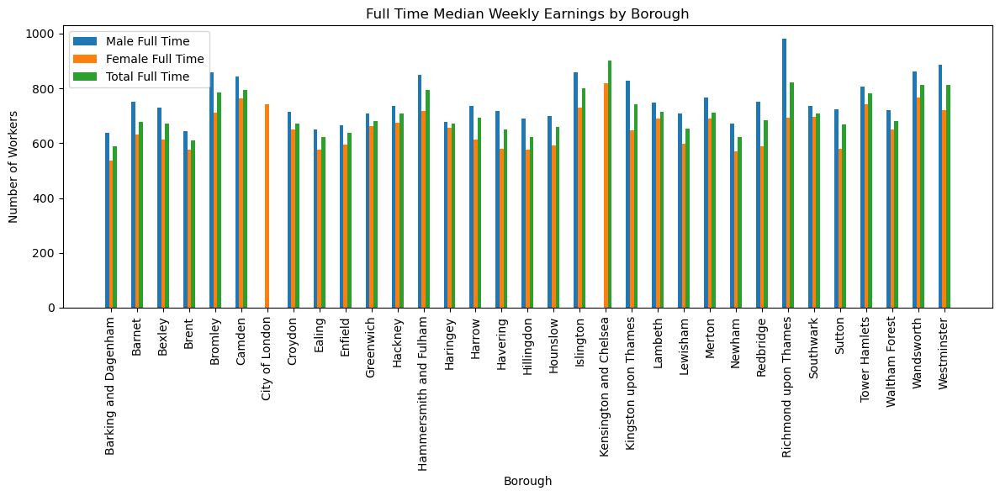

In [470]:
# create a bar chart for each column for each borough
local_authorities = earnings_median_weeklypay['local authority: county / unitary (as of April 2021)']
male_full_time_earnings = earnings_median_weeklypay['Male Full Time Workers - number']
female_full_time_earnings = earnings_median_weeklypay['Female Full Time Workers - number']
total_full_time_earnings = earnings_median_weeklypay['Full Time Workers - number']



# Set the figure size
plt.figure(figsize=(12, 6))

# Set the number of bars and their positions
n_bars = len(local_authorities)
bar_width = 0.15
index = np.arange(n_bars)

# Plot the bars
plt.bar(index, male_full_time_earnings, width=bar_width, label='Male Full Time')
plt.bar(index + bar_width, female_full_time_earnings, width=bar_width, label='Female Full Time')
plt.bar(index + (2 * bar_width), total_full_time_earnings, width=bar_width, label='Total Full Time')
# plt.bar(index + (3 * bar_width), female_part_time_earnings, width=bar_width, label='Female Part Time')

# Customize the chart
plt.xlabel('Borough')
plt.ylabel('Number of Workers')
plt.title('Full Time Median Weekly Earnings by Borough')
plt.xticks(index + bar_width, local_authorities, rotation=90)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


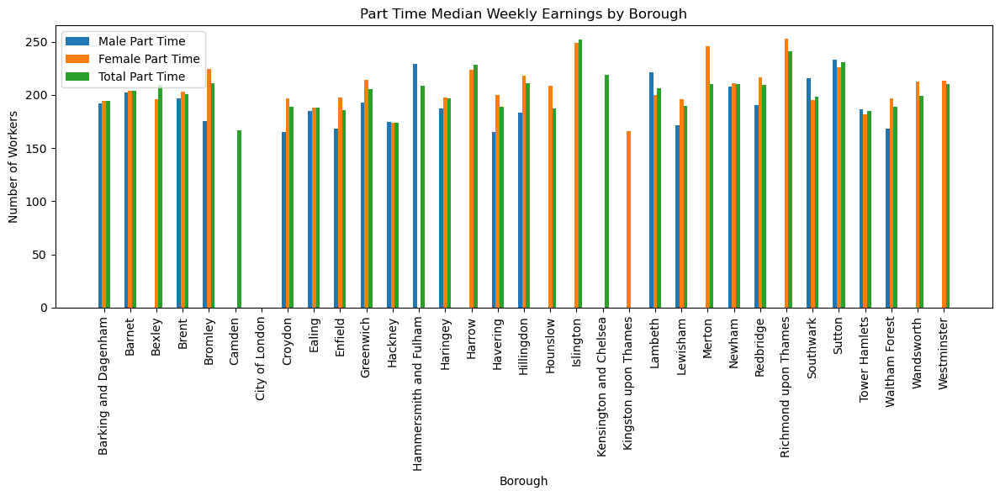

In [471]:

male_part_time_earnings = earnings_median_weeklypay['Male Part Time Workers - number']
female_part_time_earnings = earnings_median_weeklypay['Female Part Time Workers - number']
total_part_time_earnings = earnings_median_weeklypay['Part Time Workers - number']

# plot bar chart for total full time and part time earnings in each borough
# Set the figure size
plt.figure(figsize=(12, 6))

# Set the number of bars and their positions
n_bars = len(local_authorities)
bar_width = 0.15
index = np.arange(n_bars)

# Plot the bars
plt.bar(index, male_part_time_earnings, width=bar_width, label='Male Part Time')
plt.bar(index + bar_width, female_part_time_earnings, width=bar_width, label='Female Part Time')
plt.bar(index + (2 * bar_width), total_part_time_earnings, width=bar_width, label='Total Part Time')

# Customize the chart
plt.xlabel('Borough')
plt.ylabel('Number of Workers')
plt.title('Part Time Median Weekly Earnings by Borough')
plt.xticks(index + bar_width, local_authorities, rotation=90)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

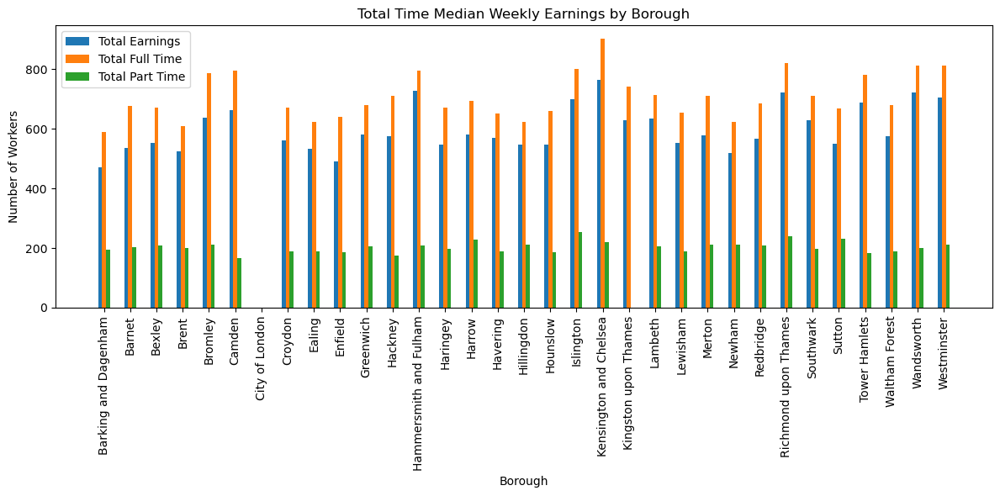

In [473]:
total_earnings = earnings_median_weeklypay['Total - number']
total_full_time_earnings = earnings_median_weeklypay['Full Time Workers - number']
total_part_time_earnings = earnings_median_weeklypay['Part Time Workers - number']

# plot bar chart for total full time and part time earnings in each borough
# Set the figure size
plt.figure(figsize=(12, 6))

# Set the number of bars and their positions
n_bars = len(local_authorities)
bar_width = 0.15
index = np.arange(n_bars)

# Plot the bars
plt.bar(index, total_earnings, width=bar_width, label='Total Earnings')
plt.bar(index + bar_width, total_full_time_earnings, width=bar_width, label='Total Full Time')
plt.bar(index + (2 * bar_width), total_part_time_earnings, width=bar_width, label='Total Part Time')

# Customize the chart
plt.xlabel('Borough')
plt.ylabel('Number of Workers')
plt.title('Total Time Median Weekly Earnings by Borough')
plt.xticks(index + bar_width, local_authorities, rotation=90)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


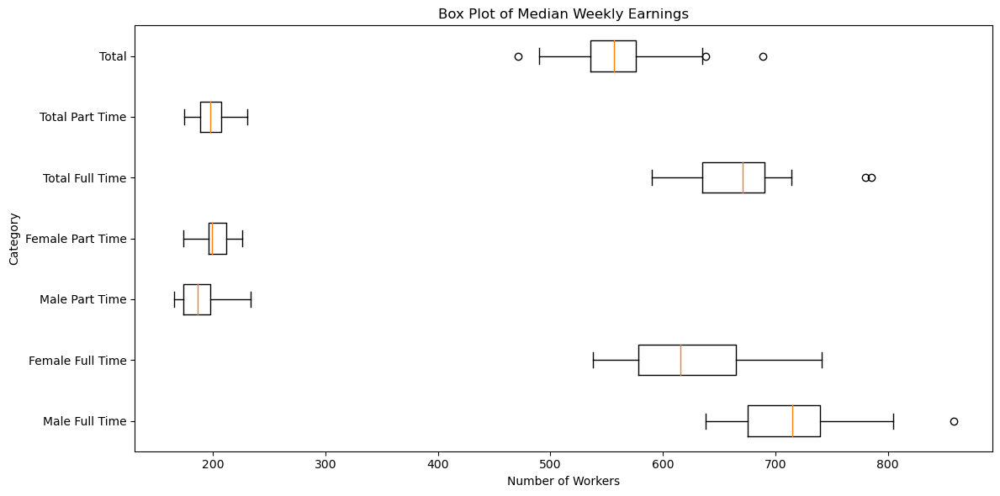

In [478]:
# create a df without NaN values
earnings_median_weeklypay_without_nan = earnings_median_weeklypay.dropna()

# Extract the data
local_authorities = earnings_median_weeklypay_without_nan['local authority: county / unitary (as of April 2021)']
male_full_time_earnings = earnings_median_weeklypay_without_nan['Male Full Time Workers - number']
female_full_time_earnings = earnings_median_weeklypay_without_nan['Female Full Time Workers - number']
male_part_time_earnings = earnings_median_weeklypay_without_nan['Male Part Time Workers - number']
female_part_time_earnings = earnings_median_weeklypay_without_nan['Female Part Time Workers - number']
total_full_time_earnings = earnings_median_weeklypay_without_nan['Full Time Workers - number']
total_part_time_earnings = earnings_median_weeklypay_without_nan['Part Time Workers - number']
total_earnings = earnings_median_weeklypay_without_nan['Total - number']

# Create a list of data to plot
data = [male_full_time_earnings, female_full_time_earnings, male_part_time_earnings,
        female_part_time_earnings, total_full_time_earnings, total_part_time_earnings, total_earnings]

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the box plots
plt.boxplot(data, vert=False)

# Customize the chart
plt.xlabel('Number of Workers')
plt.ylabel('Category')
plt.title('Box Plot of Median Weekly Earnings')

# Set the y-axis tick labels
plt.yticks([1, 2, 3, 4, 5, 6, 7],
           ['Male Full Time', 'Female Full Time', 'Male Part Time',
            'Female Part Time', 'Total Full Time', 'Total Part Time','Total'])

# Show the plot
plt.tight_layout()
plt.show()


### Hourly gross by median

In [727]:
# read excel file
earnings_median_hourlypay = pd.read_excel("../Data/Demographics/earnings-residence-borough_mean_median_percentiles.xlsx", sheet_name='Median; Hourly pay - gross', skiprows=7,header=1, skipfooter=7)

# rename columns
rename_columns = {
    'Unnamed: 1': 'borough_code',
    'Male Full Time Workers':'Male Full Time Workers - number',
    'Unnamed: 3':'Male Full Time Workers - conf',
    'Male Part Time Workers' : 'Male Part Time Workers - number',
    'Unnamed: 5': 'Male Part Time Workers - conf',
    'Female Full Time Workers': 'Female Full Time Workers - number',
    'Unnamed: 7': 'Female Full Time Workers - conf',
    'Female Part Time Workers':'Female Part Time Workers - number',
    'Unnamed: 9': 'Female Part Time Workers - conf',
    'Total': 'Total - number',
    'Unnamed: 11': 'Total - conf',
    'Full Time Workers': 'Full Time Workers - number',
    'Unnamed: 13': 'Full Time Workers - conf',
    'Part Time Workers': 'Part Time Workers - number',
    'Unnamed: 15': 'Part Time Workers - conf'
}

earnings_median_hourlypay.rename(columns=rename_columns, inplace=True)

# remove first row
earnings_median_hourlypay.drop([0],inplace=True)
earnings_median_hourlypay.head()

,local authority: county / unitary (as of April 2021),borough_code,Male Full Time Workers - number,Male Full Time Workers - conf,Male Part Time Workers - number,Male Part Time Workers - conf,Female Full Time Workers - number,Female Full Time Workers - conf,Female Part Time Workers - number,Female Part Time Workers - conf,Total - number,Total - conf,Full Time Workers - number,Full Time Workers - conf,Part Time Workers - number,Part Time Workers - conf
1,Barking and Dagenham,E09000002,15.92,6.3,9.62,15,13.15,8.2,10.16,5.1,12.88,5.5,15.01,6,10.14,5.1
2,Barnet,E09000003,18.74,8,10.81,15,17.38,5.4,11.76,8.7,16,4.5,17.7,4.9,11.34,7.6
3,Bexley,E09000004,18.38,6.7,12.01,17,16.23,5.9,10.61,4.9,15.84,3.8,17.04,4.8,10.93,4.8
4,Brent,E09000005,15.74,5.4,10.05,5.6,15.34,6.4,10.35,5.5,14.21,4.1,15.62,3.8,10.21,3.5
5,Bromley,E09000006,21.77,5.1,11.34,15,19.43,7.2,11.92,6.9,18.41,4.8,20.89,3.7,11.91,6.4


In [728]:
# count in each column how many -,! and # are there
print('Number of - in the table \n',(earnings_median_hourlypay == '-').sum())
print('Number of ! in the table \n',(earnings_median_hourlypay == '!').sum())
print('Number of # in the table \n',(earnings_median_hourlypay == '#').sum())

Number of - in the table 
 local authority: county / unitary (as of April 2021)    0
borough_code                                            0
Male Full Time Workers - number                         0
Male Full Time Workers - conf                           1
Male Part Time Workers - number                         0
Male Part Time Workers - conf                           0
Female Full Time Workers - number                       0
Female Full Time Workers - conf                         1
Female Part Time Workers - number                       0
Female Part Time Workers - conf                         0
Total - number                                          0
Total - conf                                            0
Full Time Workers - number                              0
Full Time Workers - conf                                0
Part Time Workers - number                              0
Part Time Workers - conf                                1
dtype: int64
Number of ! in the table 
 local

In [729]:
# convert -,# and ! to NaN
earnings_median_hourlypay.replace(to_replace=["-","!","#"],value=np.nan,inplace=True)

# print number of NaN values in each column
(earnings_median_hourlypay.isnull().sum())

local authority: county / unitary (as of April 2021)    0
borough_code                                            0
Male Full Time Workers - number                         2
Male Full Time Workers - conf                           2
Male Part Time Workers - number                         6
Male Part Time Workers - conf                           6
Female Full Time Workers - number                       0
Female Full Time Workers - conf                         1
Female Part Time Workers - number                       1
Female Part Time Workers - conf                         1
Total - number                                          1
Total - conf                                            1
Full Time Workers - number                              1
Full Time Workers - conf                                1
Part Time Workers - number                              1
Part Time Workers - conf                                1
dtype: int64

In [735]:
# copy earnings_median_hourlypay to earnings_median_hourlypay_final
earnings_median_hourlypay_final = earnings_median_hourlypay[['local authority: county / unitary (as of April 2021)','borough_code','Male Full Time Workers - number','Male Part Time Workers - number','Female Full Time Workers - number','Female Part Time Workers - number','Total - number','Full Time Workers - number','Part Time Workers - number']]
earnings_median_hourlypay_final.rename(columns={"local authority: county / unitary (as of April 2021)":"borough_name"},inplace=True)

# drop rows with boroughs that are not covered by the bike stations
earnings_median_hourlypay_final = earnings_median_hourlypay_final[earnings_median_hourlypay_final['borough_code'].isin(covered_boroughs)]

earnings_median_hourlypay_final

/var/folders/pz/y4y03t6d7cd_76njhx8sjzzm0000gn/T/ipykernel_15021/2731963036.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  earnings_median_hourlypay_final.rename(columns={"local authority: county / unitary (as of April 2021)":"borough_name"},inplace=True)


,borough_name,borough_code,Male Full Time Workers - number,Male Part Time Workers - number,Female Full Time Workers - number,Female Part Time Workers - number,Total - number,Full Time Workers - number,Part Time Workers - number
6,Camden,E09000007,22.27,15.06,20.23,11.20,19.17,21.16,12.16
7,City of London,E09000001,NaN,NaN,19.97,NaN,NaN,NaN,NaN
12,Hackney,E09000012,19.01,9.67,17.70,10.52,16.34,18.43,10.40
13,Hammersmith and Fulham,E09000013,22.64,NaN,18.27,13.82,19.78,20.66,14.22
19,Islington,E09000019,21.92,NaN,19.57,12.12,19.59,20.91,12.58
20,Kensington and Chelsea,E09000020,NaN,NaN,22.32,11.01,21.13,23.19,11.95
22,Lambeth,E09000022,19.17,10.42,18.40,10.38,17.47,18.84,10.43
25,Newham,E09000025,16.31,9.41,15.08,10.07,13.89,15.83,9.65
28,Southwark,E09000028,19.10,10.62,18.18,10.62,17.24,18.76,10.63
30,Tower Hamlets,E09000030,21.46,9.48,19.87,11.20,19.15,20.64,10.01


In [736]:
# save dataframe to csv file in ./Final Data Files/
earnings_median_hourlypay_final.to_csv('./Final Data Files/earnings_median_hourlypay.csv', index=False)

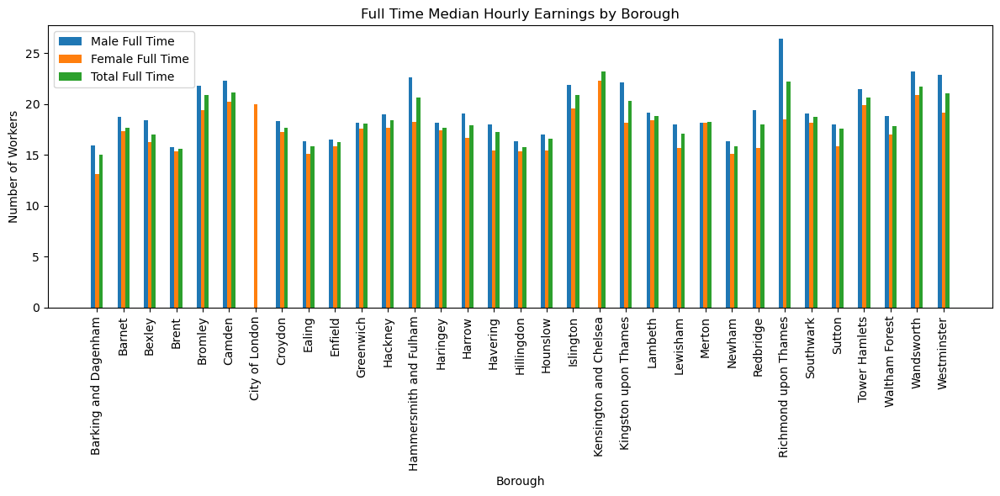

In [483]:
# create a bar chart for each column for each borough
local_authorities = earnings_median_hourlypay['local authority: county / unitary (as of April 2021)']
male_hourly_full_time_earnings = earnings_median_hourlypay['Male Full Time Workers - number']
female_hourly_full_time_earnings = earnings_median_hourlypay['Female Full Time Workers - number']
total_hourly_full_time_earnings = earnings_median_hourlypay['Full Time Workers - number']

# Set the figure size
plt.figure(figsize=(12, 6))

# Set the number of bars and their positions
n_bars = len(local_authorities)
bar_width = 0.15
index = np.arange(n_bars)

# Plot the bars
plt.bar(index, male_hourly_full_time_earnings, width=bar_width, label='Male Full Time')
plt.bar(index + bar_width, female_hourly_full_time_earnings, width=bar_width, label='Female Full Time')
plt.bar(index + (2 * bar_width), total_hourly_full_time_earnings, width=bar_width, label='Total Full Time')

# Customize the chart
plt.xlabel('Borough')
plt.ylabel('Number of Workers')
plt.title('Full Time Median Hourly Earnings by Borough')
plt.xticks(index + bar_width, local_authorities, rotation=90)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

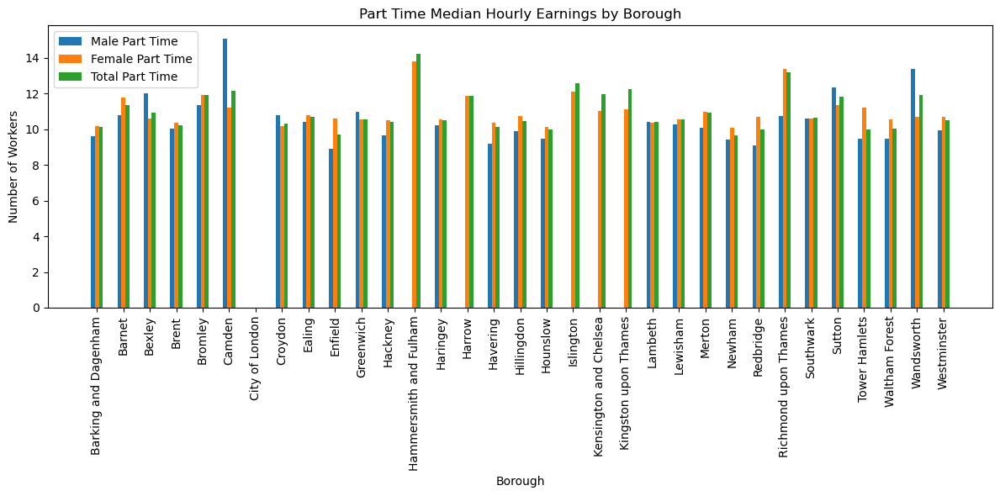

In [484]:
# create a bar chart for each column for each borough
local_authorities = earnings_median_hourlypay['local authority: county / unitary (as of April 2021)']
male_hourly_part_time_earnings = earnings_median_hourlypay['Male Part Time Workers - number']
female_hourly_part_time_earnings = earnings_median_hourlypay['Female Part Time Workers - number']
total_hourly_part_time_earnings = earnings_median_hourlypay['Part Time Workers - number']

# Set the figure size
plt.figure(figsize=(12, 6))

# Set the number of bars and their positions
n_bars = len(local_authorities)
bar_width = 0.15
index = np.arange(n_bars)

# Plot the bars
plt.bar(index, male_hourly_part_time_earnings, width=bar_width, label='Male Part Time')
plt.bar(index + bar_width, female_hourly_part_time_earnings, width=bar_width, label='Female Part Time')
plt.bar(index + (2 * bar_width), total_hourly_part_time_earnings, width=bar_width, label='Total Part Time')


# Customize the chart
plt.xlabel('Borough')
plt.ylabel('Number of Workers')
plt.title('Part Time Median Hourly Earnings by Borough')
plt.xticks(index + bar_width, local_authorities, rotation=90)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

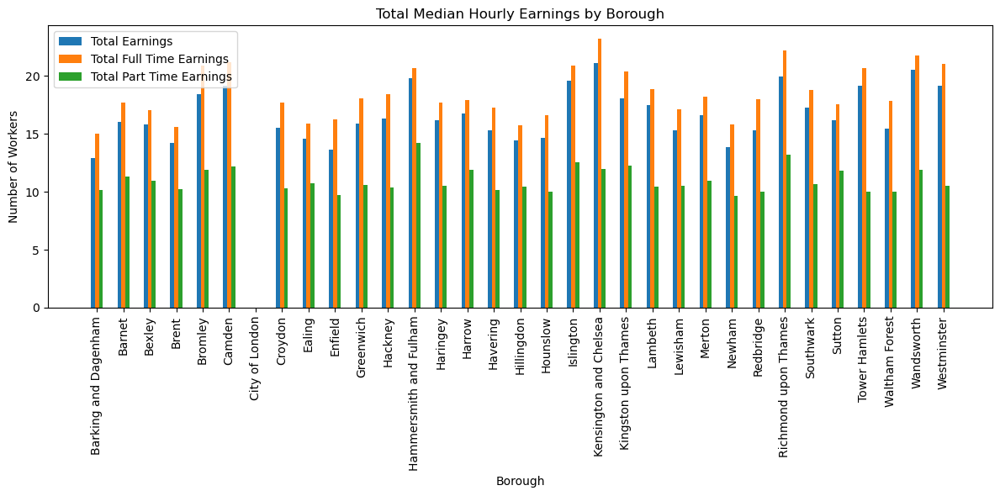

In [486]:
# create a bar chart for each column for each borough
local_authorities = earnings_median_hourlypay['local authority: county / unitary (as of April 2021)']
total_hourly_earnings = earnings_median_hourlypay['Total - number']

# Set the figure size
plt.figure(figsize=(12, 6))

# Set the number of bars and their positions
n_bars = len(local_authorities)
bar_width = 0.15
index = np.arange(n_bars)

# Plot the bars
plt.bar(index, total_hourly_earnings, width=bar_width, label='Total Earnings')
plt.bar(index + bar_width, total_hourly_full_time_earnings, width=bar_width, label='Total Full Time Earnings')
plt.bar(index + (2 * bar_width), total_hourly_part_time_earnings, width=bar_width, label='Total Part Time Earnings')

# Customize the chart
plt.xlabel('Borough')
plt.ylabel('Number of Workers')
plt.title('Total Median Hourly Earnings by Borough')
plt.xticks(index + bar_width, local_authorities, rotation=90)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


### Annual gross by median

In [732]:
# read excel file
earnings_median_annualpay = pd.read_excel("../Data/Demographics/earnings-residence-borough_mean_median_percentiles.xlsx", sheet_name='Median; Annual pay - gross', skiprows=7,header=1, skipfooter=7)

# rename columns
rename_columns = {
    'Unnamed: 1': 'borough_code',
    'Male Full Time Workers':'Male Full Time Workers - number',
    'Unnamed: 3':'Male Full Time Workers - conf',
    'Male Part Time Workers' : 'Male Part Time Workers - number',
    'Unnamed: 5': 'Male Part Time Workers - conf',
    'Female Full Time Workers': 'Female Full Time Workers - number',
    'Unnamed: 7': 'Female Full Time Workers - conf',
    'Female Part Time Workers':'Female Part Time Workers - number',
    'Unnamed: 9': 'Female Part Time Workers - conf',
    'Total': 'Total - number',
    'Unnamed: 11': 'Total - conf',
    'Full Time Workers': 'Full Time Workers - number',
    'Unnamed: 13': 'Full Time Workers - conf',
    'Part Time Workers': 'Part Time Workers - number',
    'Unnamed: 15': 'Part Time Workers - conf'
}

earnings_median_annualpay.rename(columns=rename_columns, inplace=True)

# remove first row
earnings_median_annualpay.drop([0],inplace=True)
earnings_median_annualpay.head()

,local authority: county / unitary (as of April 2021),borough_code,Male Full Time Workers - number,Male Full Time Workers - conf,Male Part Time Workers - number,Male Part Time Workers - conf,Female Full Time Workers - number,Female Full Time Workers - conf,Female Part Time Workers - number,Female Part Time Workers - conf,Total - number,Total - conf,Full Time Workers - number,Full Time Workers - conf,Part Time Workers - number,Part Time Workers - conf
1,Barking and Dagenham,E09000002,32120,7.4,#,#,27284,9,9277,16,25412,6.8,29363,6,9902,12
2,Barnet,E09000003,39584,10,9956,18,34254,14,#,#,29512,9.5,36292,7.8,#,#
3,Bexley,E09000004,40257,6.1,#,#,32026,7.7,10556,15,30708,6.8,36932,5.5,11823,13
4,Brent,E09000005,33964,6.7,#,-,28846,8.1,#,#,26325,10,31746,5.2,#,#
5,Bromley,E09000006,#,#,#,-,34551,8.2,10853,12,33546,15,41008,13,10617,10


In [733]:
# count in each column how many -,! and # are there
print('Number of - in the table \n',(earnings_median_annualpay == '-').sum())
print('Number of ! in the table \n',(earnings_median_annualpay == '!').sum())
print('Number of # in the table \n',(earnings_median_annualpay == '#').sum())

Number of - in the table 
 local authority: county / unitary (as of April 2021)    0
borough_code                                            0
Male Full Time Workers - number                         0
Male Full Time Workers - conf                           1
Male Part Time Workers - number                         0
Male Part Time Workers - conf                           3
Female Full Time Workers - number                       0
Female Full Time Workers - conf                         2
Female Part Time Workers - number                       0
Female Part Time Workers - conf                         1
Total - number                                          0
Total - conf                                            0
Full Time Workers - number                              0
Full Time Workers - conf                                1
Part Time Workers - number                              0
Part Time Workers - conf                                1
dtype: int64
Number of ! in the table 
 local

In [734]:
# convert -,# and ! to NaN
earnings_median_annualpay.replace(to_replace=["-","!","#"],value=np.nan,inplace=True)

# print number of NaN values in each column
(earnings_median_annualpay.isnull().sum())

local authority: county / unitary (as of April 2021)     0
borough_code                                             0
Male Full Time Workers - number                          5
Male Full Time Workers - conf                            5
Male Part Time Workers - number                         27
Male Part Time Workers - conf                           27
Female Full Time Workers - number                        2
Female Full Time Workers - conf                          3
Female Part Time Workers - number                        9
Female Part Time Workers - conf                          9
Total - number                                           1
Total - conf                                             1
Full Time Workers - number                               2
Full Time Workers - conf                                 2
Part Time Workers - number                               7
Part Time Workers - conf                                 8
dtype: int64

In [737]:
# copy earnings_median_annualpay to earnings_median_annualpay_final and rename local authority: county / unitary (as of April 2021) to borough_name
earnings_median_annualpay_final = earnings_median_annualpay[['local authority: county / unitary (as of April 2021)','borough_code','Male Full Time Workers - number','Male Part Time Workers - number','Female Full Time Workers - number','Female Part Time Workers - number','Total - number','Full Time Workers - number','Part Time Workers - number']]
earnings_median_annualpay_final.rename(columns={"local authority: county / unitary (as of April 2021)":"borough_name"},inplace=True)

# drop rows with boroughs that are not covered by the bike stations
earnings_median_annualpay_final = earnings_median_annualpay_final[earnings_median_annualpay_final['borough_code'].isin(covered_boroughs)]

earnings_median_annualpay_final

/var/folders/pz/y4y03t6d7cd_76njhx8sjzzm0000gn/T/ipykernel_15021/3179264206.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  earnings_median_annualpay_final.rename(columns={"local authority: county / unitary (as of April 2021)":"borough_name"},inplace=True)


,borough_name,borough_code,Male Full Time Workers - number,Male Part Time Workers - number,Female Full Time Workers - number,Female Part Time Workers - number,Total - number,Full Time Workers - number,Part Time Workers - number
6,Camden,E09000007,44963.0,NaN,39404.0,NaN,35247.0,42416.0,NaN
7,City of London,E09000001,NaN,NaN,39941.0,NaN,NaN,NaN,10047.0
12,Hackney,E09000012,38413.0,8957.0,35318.0,9134.0,28790.0,35974.0,9004.0
13,Hammersmith and Fulham,E09000013,44975.0,NaN,38735.0,NaN,38799.0,42104.0,NaN
19,Islington,E09000019,44614.0,NaN,NaN,12054.0,37634.0,43715.0,13184.0
20,Kensington and Chelsea,E09000020,NaN,NaN,41557.0,NaN,36277.0,NaN,NaN
22,Lambeth,E09000022,40150.0,NaN,34554.0,9072.0,33084.0,36969.0,11253.0
25,Newham,E09000025,34134.0,12123.0,27498.0,11193.0,26107.0,31807.0,11399.0
28,Southwark,E09000028,42542.0,NaN,36555.0,10284.0,35056.0,39130.0,10586.0
30,Tower Hamlets,E09000030,45812.0,9776.0,39312.0,8890.0,38000.0,42608.0,9772.0


In [738]:
# save dataframe to csv file in ./Final Data Files/
earnings_median_annualpay_final.to_csv('./Final Data Files/earnings_median_annualpay.csv', index=False)

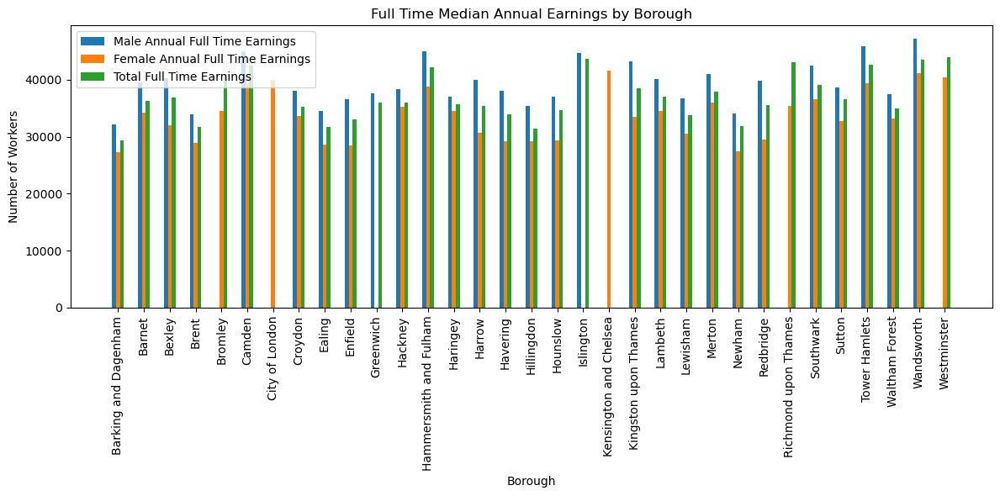

In [497]:
# create a bar chart for each column for each borough
local_authorities = earnings_median_annualpay['local authority: county / unitary (as of April 2021)']
male_annual_full_time_earnings = earnings_median_annualpay['Male Full Time Workers - number']
female_annual_full_time_earnings = earnings_median_annualpay['Female Full Time Workers - number']
total_annual_full_time_earnings = earnings_median_annualpay['Full Time Workers - number']

# Set the figure size
plt.figure(figsize=(12, 6))

# Set the number of bars and their positions
n_bars = len(local_authorities)
bar_width = 0.15
index = np.arange(n_bars)

# Plot the bars
plt.bar(index, male_annual_full_time_earnings, width=bar_width, label='Male Annual Full Time Earnings')
plt.bar(index + bar_width, female_annual_full_time_earnings, width=bar_width, label='Female Annual Full Time Earnings')
plt.bar(index + (2 * bar_width), total_annual_full_time_earnings, width=bar_width, label='Total Full Time Earnings')

# Customize the chart
plt.xlabel('Borough')
plt.ylabel('Number of Workers')
plt.title('Full Time Median Annual Earnings by Borough')
plt.xticks(index + bar_width, local_authorities, rotation=90)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

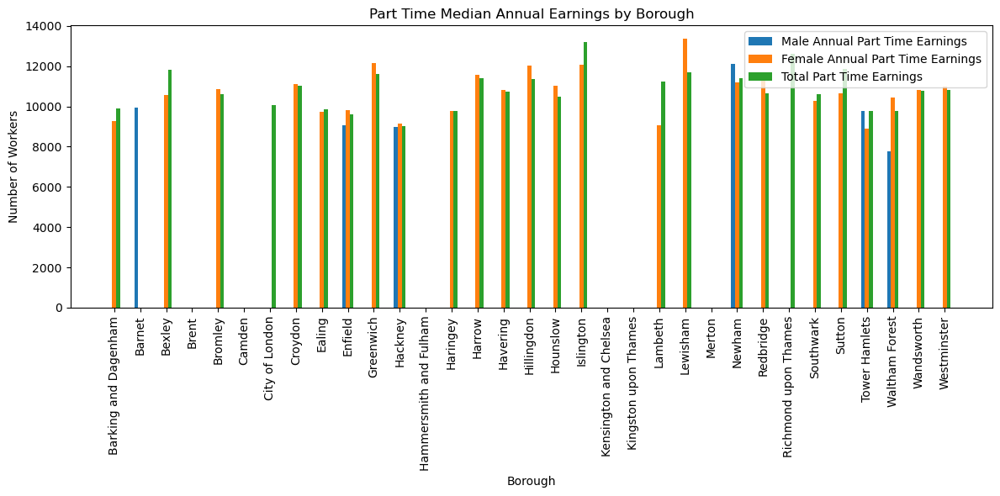

In [498]:
# create a bar chart for each column for each borough
local_authorities = earnings_median_annualpay['local authority: county / unitary (as of April 2021)']
male_annual_part_time_earnings = earnings_median_annualpay['Male Part Time Workers - number']
female_annual_part_time_earnings = earnings_median_annualpay['Female Part Time Workers - number']
total_annual_part_time_earnings = earnings_median_annualpay['Part Time Workers - number']

# Set the figure size
plt.figure(figsize=(12, 6))

# Set the number of bars and their positions
n_bars = len(local_authorities)
bar_width = 0.15
index = np.arange(n_bars)

plt.bar(index, male_annual_part_time_earnings, width=bar_width, label='Male Annual Part Time Earnings')
plt.bar(index + bar_width, female_annual_part_time_earnings, width=bar_width, label='Female Annual Part Time Earnings')
plt.bar(index + (2 * bar_width), total_annual_part_time_earnings, width=bar_width, label='Total Part Time Earnings')

# Customize the chart
plt.xlabel('Borough')
plt.ylabel('Number of Workers')
plt.title('Part Time Median Annual Earnings by Borough')
plt.xticks(index + bar_width, local_authorities, rotation=90)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

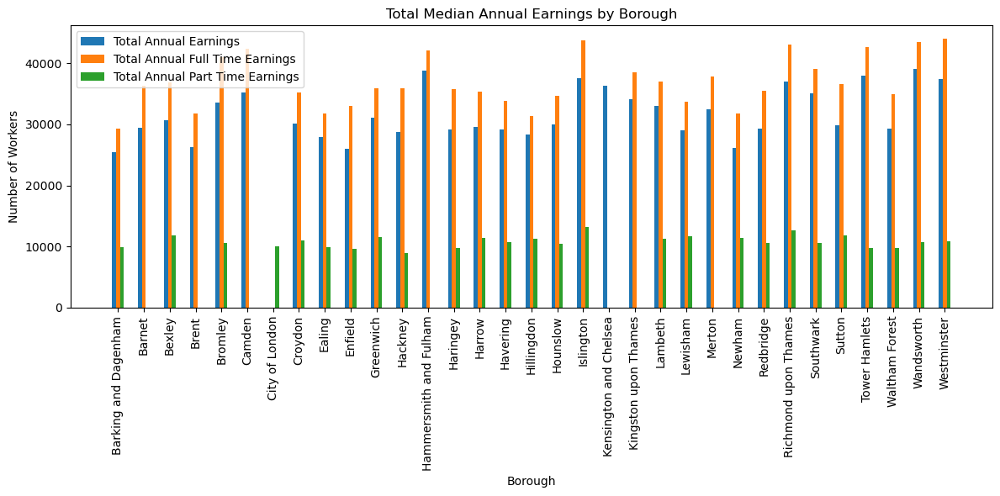

In [499]:
# create a bar chart for each column for each borough
local_authorities = earnings_median_annualpay['local authority: county / unitary (as of April 2021)']
total_annual_earnings = earnings_median_annualpay['Total - number']

# Set the figure size
plt.figure(figsize=(12, 6))

# Set the number of bars and their positions
n_bars = len(local_authorities)
bar_width = 0.15
index = np.arange(n_bars)

plt.bar(index, total_annual_earnings, width=bar_width, label='Total Annual Earnings')
plt.bar(index + bar_width, total_annual_full_time_earnings, width=bar_width, label='Total Annual Full Time Earnings')
plt.bar(index + (2 * bar_width), total_annual_part_time_earnings, width=bar_width, label='Total Annual Part Time Earnings')

# Customize the chart
plt.xlabel('Borough')
plt.ylabel('Number of Workers')
plt.title('Total Median Annual Earnings by Borough')
plt.xticks(index + bar_width, local_authorities, rotation=90)
plt.legend()


# Show the plot
plt.tight_layout()
plt.show()


### Weekly gross by mean

In [739]:
# read excel file
earnings_mean_weeklypay = pd.read_excel("../Data/Demographics/earnings-residence-borough_mean_median_percentiles.xlsx", sheet_name='Mean; Weekly pay - gross', skiprows=7,header=1, skipfooter=7)


#rename columns
rename_columns = {
    'Unnamed: 1': 'borough_code',
    'Male Full Time Workers':'Male Full Time Workers - number',
    'Unnamed: 3':'Male Full Time Workers - conf',
    'Male Part Time Workers' : 'Male Part Time Workers - number',
    'Unnamed: 5': 'Male Part Time Workers - conf',
    'Female Full Time Workers': 'Female Full Time Workers - number',
    'Unnamed: 7': 'Female Full Time Workers - conf',
    'Female Part Time Workers':'Female Part Time Workers - number',
    'Unnamed: 9': 'Female Part Time Workers - conf',
    'Total': 'Total - number',
    'Unnamed: 11': 'Total - conf',
    'Full Time Workers': 'Full Time Workers - number',
    'Unnamed: 13': 'Full Time Workers - conf',
    'Part Time Workers': 'Part Time Workers - number',
    'Unnamed: 15': 'Part Time Workers - conf'
}

earnings_mean_weeklypay.rename(columns=rename_columns, inplace=True)

# remove first row
earnings_mean_weeklypay.drop([0],inplace=True)
earnings_mean_weeklypay.head()


,local authority: county / unitary (as of April 2021),borough_code,Male Full Time Workers - number,Male Full Time Workers - conf,Male Part Time Workers - number,Male Part Time Workers - conf,Female Full Time Workers - number,Female Full Time Workers - conf,Female Part Time Workers - number,Female Part Time Workers - conf,Total - number,Total - conf,Full Time Workers - number,Full Time Workers - conf,Part Time Workers - number,Part Time Workers - conf
1,Barking and Dagenham,E09000002,692.3,4.6,208.4,9.6,596.3,4.6,225.4,6.9,512.4,3.6,647.6,3.4,219.8,5.6
2,Barnet,E09000003,943.7,4.8,218.2,8,753.9,5.3,291.5,7.7,685.7,3.6,853.2,3.6,270.8,6.3
3,Bexley,E09000004,865.1,4.8,287.8,11,700.5,3.8,236.1,7.1,658.1,3.5,792.4,3.3,249.3,6.1
4,Brent,E09000005,770.6,4.1,191.2,6.8,691.7,4.1,255.1,9.2,617.7,3.1,735.2,2.9,232.3,6.9
5,Bromley,E09000006,1056.9,4.1,280.8,17,841.9,4.7,292.6,7.4,786.9,3.2,957.3,3.1,289.3,7.1


In [740]:
# count in each column how many -,! and # are there
print('Number of - in the table \n',(earnings_mean_weeklypay == '-').sum())
print('Number of ! in the table \n',(earnings_mean_weeklypay == '!').sum())
print('Number of # in the table \n',(earnings_mean_weeklypay == '#').sum())

Number of - in the table 
 local authority: county / unitary (as of April 2021)    0
borough_code                                            0
Male Full Time Workers - number                         0
Male Full Time Workers - conf                           0
Male Part Time Workers - number                         0
Male Part Time Workers - conf                           0
Female Full Time Workers - number                       0
Female Full Time Workers - conf                         0
Female Part Time Workers - number                       0
Female Part Time Workers - conf                         0
Total - number                                          0
Total - conf                                            0
Full Time Workers - number                              0
Full Time Workers - conf                                0
Part Time Workers - number                              0
Part Time Workers - conf                                0
dtype: int64
Number of ! in the table 
 local

In [741]:
# convert -,# and ! to NaN
earnings_mean_weeklypay.replace(to_replace=["-","!","#"],value=np.nan,inplace=True)

# print number of NaN values in each column
(earnings_mean_weeklypay.isnull().sum())

local authority: county / unitary (as of April 2021)    0
borough_code                                            0
Male Full Time Workers - number                         1
Male Full Time Workers - conf                           1
Male Part Time Workers - number                         9
Male Part Time Workers - conf                           9
Female Full Time Workers - number                       0
Female Full Time Workers - conf                         0
Female Part Time Workers - number                       1
Female Part Time Workers - conf                         1
Total - number                                          0
Total - conf                                            0
Full Time Workers - number                              0
Full Time Workers - conf                                0
Part Time Workers - number                              1
Part Time Workers - conf                                1
dtype: int64

In [742]:
# copy earnings_mean_weeklypay to earnings_mean_weeklypay_final and rename local authority: county / unitary (as of April 2021) to borough_name
earnings_mean_weeklypay_final = earnings_mean_weeklypay[['local authority: county / unitary (as of April 2021)','borough_code','Male Full Time Workers - number','Male Part Time Workers - number','Female Full Time Workers - number','Female Part Time Workers - number','Total - number','Full Time Workers - number','Part Time Workers - number']]
earnings_mean_weeklypay_final.rename(columns={"local authority: county / unitary (as of April 2021)":"borough_name"},inplace=True)

# drop rows with boroughs that are not covered by the bike stations
earnings_mean_weeklypay_final = earnings_mean_weeklypay_final[earnings_mean_weeklypay_final['borough_code'].isin(covered_boroughs)]

earnings_mean_weeklypay_final

/var/folders/pz/y4y03t6d7cd_76njhx8sjzzm0000gn/T/ipykernel_15021/963986019.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  earnings_mean_weeklypay_final.rename(columns={"local authority: county / unitary (as of April 2021)":"borough_name"},inplace=True)


,borough_name,borough_code,Male Full Time Workers - number,Male Part Time Workers - number,Female Full Time Workers - number,Female Part Time Workers - number,Total - number,Full Time Workers - number,Part Time Workers - number
6,Camden,E09000007,1152.1,236.1,904.7,273.5,864.6,1043.8,257.8
7,City of London,E09000001,NaN,NaN,809.6,NaN,882.8,929.9,NaN
12,Hackney,E09000012,886.4,242.1,768.9,242.2,675.9,832.9,242.2
13,Hammersmith and Fulham,E09000013,1152.3,244.2,827.6,259.8,892.4,1004.9,254.2
19,Islington,E09000019,1073.7,361.3,931.4,303.6,881.3,1004.8,325.6
20,Kensington and Chelsea,E09000020,1905.8,NaN,950.0,256.7,1276.2,1511.5,308.7
22,Lambeth,E09000022,915.6,295.1,750.6,250.3,725.8,841.6,266.8
25,Newham,E09000025,744.3,239.9,652.8,236.7,582.3,705.9,237.9
28,Southwark,E09000028,950.2,250.2,791.5,254.0,753.3,874.8,253.1
30,Tower Hamlets,E09000030,1039.9,241.2,878.9,214.7,850.3,973.2,225.7


In [744]:
# save dataframe to csv file in ./Final Data Files/
earnings_mean_weeklypay_final.to_csv('./Final Data Files/earnings_mean_weeklypay.csv', index=False)

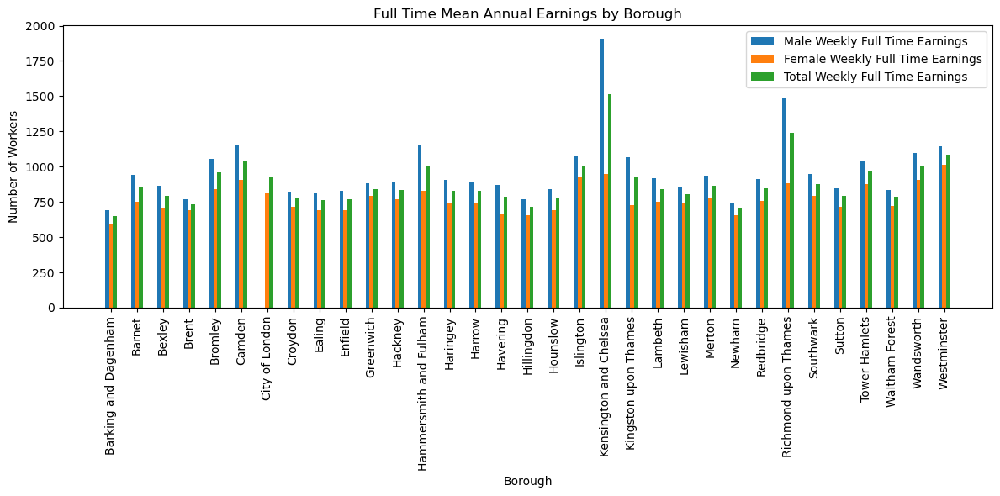

In [524]:
# create a bar chart for each column for each borough
local_authorities = earnings_mean_weeklypay['local authority: county / unitary (as of April 2021)']
male_mean_weekly_full_time_earnings = earnings_mean_weeklypay['Male Full Time Workers - number']
female_mean_weekly_full_time_earnings = earnings_mean_weeklypay['Female Full Time Workers - number']
total_mean_weekly_full_time_earnings = earnings_mean_weeklypay['Full Time Workers - number']

# Set the figure size
plt.figure(figsize=(12, 6))

# Set the number of bars and their positions
n_bars = len(local_authorities)
bar_width = 0.15
index = np.arange(n_bars)

plt.bar(index, male_mean_weekly_full_time_earnings, width=bar_width, label='Male Weekly Full Time Earnings')
plt.bar(index + bar_width, female_mean_weekly_full_time_earnings, width=bar_width, label='Female Weekly Full Time Earnings')
plt.bar(index + (2 * bar_width), total_mean_weekly_full_time_earnings, width=bar_width, label='Total Weekly Full Time Earnings')

# Customize the chart
plt.xlabel('Borough')
plt.ylabel('Number of Workers')
plt.title('Full Time Mean Weekly Earnings by Borough')
plt.xticks(index + bar_width, local_authorities, rotation=90)
plt.legend()


# Show the plot
plt.tight_layout()
plt.show()

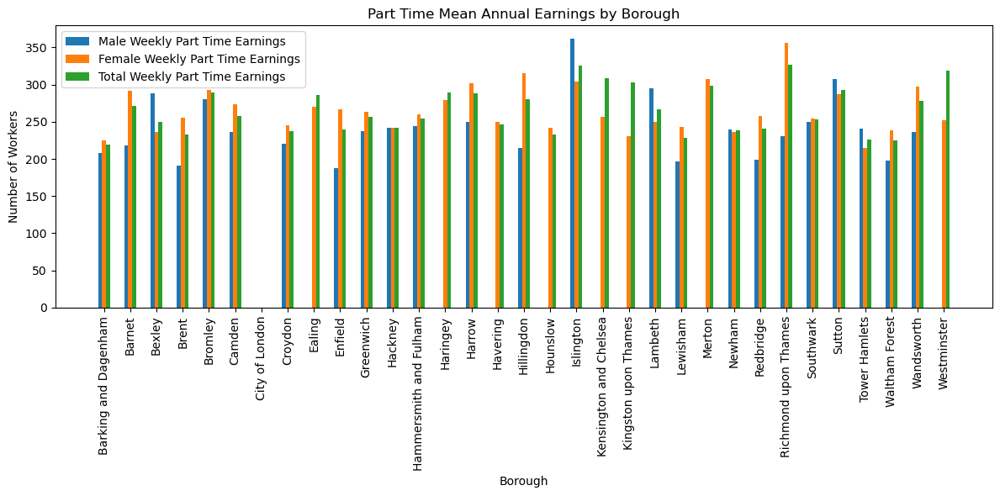

In [525]:
# create a bar chart for each column for each borough
local_authorities = earnings_mean_weeklypay['local authority: county / unitary (as of April 2021)']
male_mean_weekly_part_time_earnings = earnings_mean_weeklypay['Male Part Time Workers - number']
female_mean_weekly_part_time_earnings = earnings_mean_weeklypay['Female Part Time Workers - number']
total_mean_weekly_part_time_earnings = earnings_mean_weeklypay['Part Time Workers - number']

# Set the figure size
plt.figure(figsize=(12, 6))

# Set the number of bars and their positions
n_bars = len(local_authorities)
bar_width = 0.15
index = np.arange(n_bars)

plt.bar(index, male_mean_weekly_part_time_earnings, width=bar_width, label='Male Weekly Part Time Earnings')
plt.bar(index + bar_width, female_mean_weekly_part_time_earnings, width=bar_width, label='Female Weekly Part Time Earnings')
plt.bar(index + (2 * bar_width), total_mean_weekly_part_time_earnings, width=bar_width, label='Total Weekly Part Time Earnings')

# Customize the chart
plt.xlabel('Borough')
plt.ylabel('Number of Workers')
plt.title('Part Time Mean Weekly Earnings by Borough')
plt.xticks(index + bar_width, local_authorities, rotation=90)
plt.legend()


# Show the plot
plt.tight_layout()
plt.show()

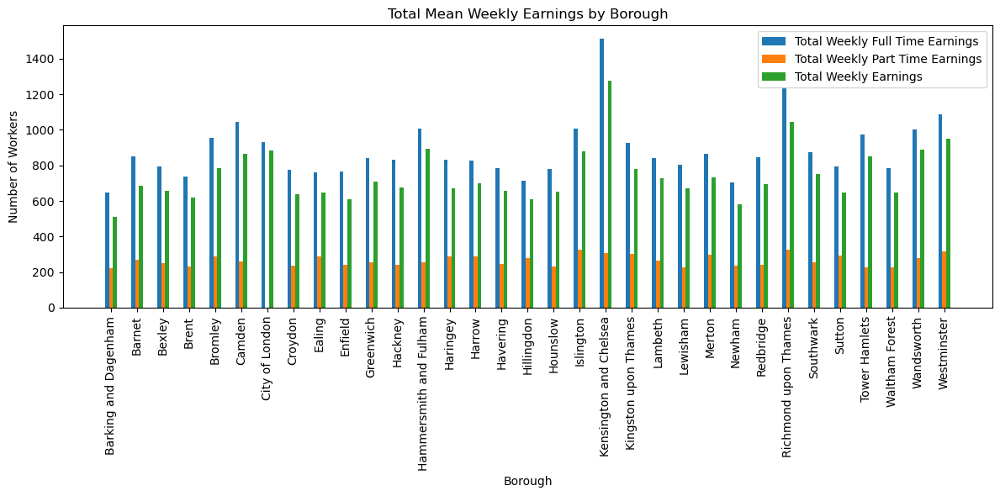

In [539]:
# create a bar chart for each column for each borough
local_authorities = earnings_mean_weeklypay['local authority: county / unitary (as of April 2021)']
total_mean_weekly_earnings = earnings_mean_weeklypay['Total - number']

# Set the figure size
plt.figure(figsize=(12, 6))

# Set the number of bars and their positions
n_bars = len(local_authorities)
bar_width = 0.15
index = np.arange(n_bars)

plt.bar(index, total_mean_weekly_full_time_earnings, width=bar_width, label='Total Weekly Full Time Earnings')
plt.bar(index + bar_width, total_mean_weekly_part_time_earnings, width=bar_width, label='Total Weekly Part Time Earnings')
plt.bar(index + (2 * bar_width), total_mean_weekly_earnings, width=bar_width, label='Total Weekly Earnings')

# Customize the chart
plt.xlabel('Borough')
plt.ylabel('Number of Workers')
plt.title('Total Mean Weekly Earnings by Borough')
plt.xticks(index + bar_width, local_authorities, rotation=90)
plt.legend()


# Show the plot
plt.tight_layout()
plt.show()

### Hourly earning by mean

In [745]:
# read excel file
earnings_mean_hourlypay = pd.read_excel("../Data/Demographics/earnings-residence-borough_mean_median_percentiles.xlsx", sheet_name='Mean; Hourly pay - gross', skiprows=7,header=1, skipfooter=7)

#rename columns
rename_columns = {
    'Unnamed: 1': 'borough_code',
    'Male Full Time Workers':'Male Full Time Workers - number',
    'Unnamed: 3':'Male Full Time Workers - conf',
    'Male Part Time Workers' : 'Male Part Time Workers - number',
    'Unnamed: 5': 'Male Part Time Workers - conf',
    'Female Full Time Workers': 'Female Full Time Workers - number',
    'Unnamed: 7': 'Female Full Time Workers - conf',
    'Female Part Time Workers':'Female Part Time Workers - number',
    'Unnamed: 9': 'Female Part Time Workers - conf',
    'Total': 'Total - number',
    'Unnamed: 11': 'Total - conf',
    'Full Time Workers': 'Full Time Workers - number',
    'Unnamed: 13': 'Full Time Workers - conf',
    'Part Time Workers': 'Part Time Workers - number',
    'Unnamed: 15': 'Part Time Workers - conf'
}

earnings_mean_hourlypay.rename(columns=rename_columns, inplace=True)

# remove first row
earnings_mean_hourlypay.drop([0],inplace=True)
earnings_mean_hourlypay.head()

,local authority: county / unitary (as of April 2021),borough_code,Male Full Time Workers - number,Male Full Time Workers - conf,Male Part Time Workers - number,Male Part Time Workers - conf,Female Full Time Workers - number,Female Full Time Workers - conf,Female Part Time Workers - number,Female Part Time Workers - conf,Total - number,Total - conf,Full Time Workers - number,Full Time Workers - conf,Part Time Workers - number,Part Time Workers - conf
1,Barking and Dagenham,E09000002,16.71,4.9,11.37,6.2,15.94,4.8,12.28,5.1,15.6,3.1,16.37,3.5,11.98,4
2,Barnet,E09000003,24.13,5,13.08,7.5,20.17,5.4,16.62,6.6,21.27,3.4,22.29,3.7,15.65,5.4
3,Bexley,E09000004,21.57,5,16.34,10,18.81,3.9,13.48,5.4,19.6,3.2,20.4,3.5,14.21,4.9
4,Brent,E09000005,19.4,4.3,11.25,5.1,18.17,4.4,13.6,7.8,18.11,2.9,18.86,3.1,12.82,5.8
5,Bromley,E09000006,27,4.3,17.19,15,22.79,4.8,15.69,6.8,23.85,3,25.11,3.2,16.07,6.3


In [746]:
# count in each column how many -,! and # are there
print('Number of - in the table \n',(earnings_mean_hourlypay == '-').sum())
print('Number of ! in the table \n',(earnings_mean_hourlypay == '!').sum())
print('Number of # in the table \n',(earnings_mean_hourlypay == '#').sum())

Number of - in the table 
 local authority: county / unitary (as of April 2021)    0
borough_code                                            0
Male Full Time Workers - number                         0
Male Full Time Workers - conf                           0
Male Part Time Workers - number                         0
Male Part Time Workers - conf                           0
Female Full Time Workers - number                       0
Female Full Time Workers - conf                         0
Female Part Time Workers - number                       0
Female Part Time Workers - conf                         0
Total - number                                          0
Total - conf                                            0
Full Time Workers - number                              0
Full Time Workers - conf                                0
Part Time Workers - number                              0
Part Time Workers - conf                                0
dtype: int64
Number of ! in the table 
 local

In [747]:
# store borough codes that have column values with -,# and ! values
earnings_with_characters = earnings_mean_hourlypay[(earnings_mean_hourlypay == '-').any(axis=1) | (earnings_mean_hourlypay == '!').any(axis=1) | (earnings_mean_hourlypay == '#').any(axis=1)]
earnings_with_characters['borough_code'].unique()

# convert -,# and ! to NaN
earnings_mean_hourlypay.replace(to_replace=["-","!","#"],value=np.nan,inplace=True)

# print number of NaN values in each column
(earnings_mean_hourlypay.isnull().sum())

local authority: county / unitary (as of April 2021)    0
borough_code                                            0
Male Full Time Workers - number                         1
Male Full Time Workers - conf                           1
Male Part Time Workers - number                         7
Male Part Time Workers - conf                           7
Female Full Time Workers - number                       0
Female Full Time Workers - conf                         0
Female Part Time Workers - number                       1
Female Part Time Workers - conf                         1
Total - number                                          0
Total - conf                                            0
Full Time Workers - number                              0
Full Time Workers - conf                                0
Part Time Workers - number                              1
Part Time Workers - conf                                1
dtype: int64

In [748]:
# copy earnings_mean_hourlypay to earnings_mean_hourlypay_final and rename local authority: county / unitary (as of April 2021) to borough_name
earnings_mean_hourlypay_final = earnings_mean_hourlypay[['local authority: county / unitary (as of April 2021)','borough_code','Male Full Time Workers - number','Male Part Time Workers - number','Female Full Time Workers - number','Female Part Time Workers - number','Total - number','Full Time Workers - number','Part Time Workers - number']]
earnings_mean_hourlypay_final.rename(columns={"local authority: county / unitary (as of April 2021)":"borough_name"},inplace=True)

# drop rows with boroughs that are not covered by the bike stations
earnings_mean_hourlypay_final = earnings_mean_hourlypay_final[earnings_mean_hourlypay_final['borough_code'].isin(covered_boroughs)]

earnings_mean_hourlypay_final

/var/folders/pz/y4y03t6d7cd_76njhx8sjzzm0000gn/T/ipykernel_15021/789907089.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  earnings_mean_hourlypay_final.rename(columns={"local authority: county / unitary (as of April 2021)":"borough_name"},inplace=True)


,borough_name,borough_code,Male Full Time Workers - number,Male Part Time Workers - number,Female Full Time Workers - number,Female Part Time Workers - number,Total - number,Full Time Workers - number,Part Time Workers - number
6,Camden,E09000007,29.99,16.26,24.06,16.75,26.26,27.43,16.56
7,City of London,E09000001,NaN,NaN,21.38,NaN,26.24,24.95,NaN
12,Hackney,E09000012,22.92,14.04,20.29,13.96,20.65,21.74,13.99
13,Hammersmith and Fulham,E09000013,29.87,16.93,21.66,15.57,25.47,26.16,16.02
19,Islington,E09000019,27.58,19.11,24.50,16.28,25.25,26.11,17.37
20,Kensington and Chelsea,E09000020,49.02,NaN,25.40,13.89,37.09,39.49,16.67
22,Lambeth,E09000022,23.56,16.22,19.89,13.98,21.19,21.94,14.82
25,Newham,E09000025,18.55,11.93,17.00,12.13,17.02,17.92,12.05
28,Southwark,E09000028,24.35,14.51,21.11,14.31,21.99,22.85,14.36
30,Tower Hamlets,E09000030,27.15,12.89,23.69,13.76,24.74,25.74,13.36


In [749]:
# save dataframe to csv file in ./Final Data Files/
earnings_mean_hourlypay_final.to_csv('./Final Data Files/earnings_mean_hourlypay.csv', index=False)

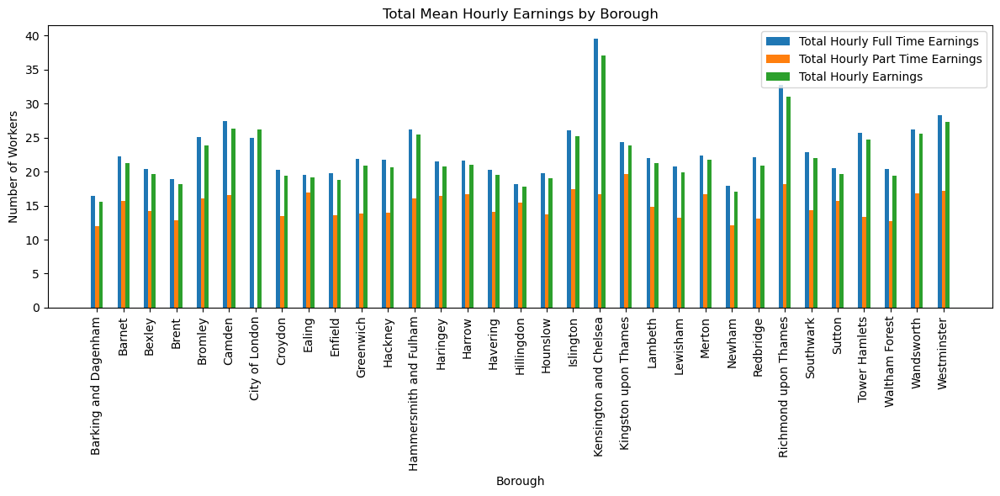

In [546]:
# create a bar chart for each column for each borough
local_authorities = earnings_mean_hourlypay['local authority: county / unitary (as of April 2021)']
total_mean_hourly_earnings = earnings_mean_hourlypay['Total - number']
total_mean_houry_full_time_earnings = earnings_mean_hourlypay['Full Time Workers - number']
total_mean_houry_part_time_earnings = earnings_mean_hourlypay['Part Time Workers - number']

# Set the figure size
plt.figure(figsize=(12, 6))

# Set the number of bars and their positions
n_bars = len(local_authorities)
bar_width = 0.15
index = np.arange(n_bars)

plt.bar(index, total_mean_houry_full_time_earnings, width=bar_width, label='Total Hourly Full Time Earnings')
plt.bar(index + bar_width, total_mean_houry_part_time_earnings, width=bar_width, label='Total Hourly Part Time Earnings')
plt.bar(index + (2 * bar_width), total_mean_hourly_earnings, width=bar_width, label='Total Hourly Earnings')

# Customize the chart
plt.xlabel('Borough')
plt.ylabel('Number of Workers')
plt.title('Total Mean Hourly Earnings by Borough')
plt.xticks(index + bar_width, local_authorities, rotation=90)
plt.legend()


# Show the plot
plt.tight_layout()
plt.show()

### Annual earning by mean

In [750]:
# read excel file
earnings_mean_annualpay = pd.read_excel("../Data/Demographics/earnings-residence-borough_mean_median_percentiles.xlsx", sheet_name='Mean; Annual pay - gross', skiprows=7,header=1, skipfooter=7)

#rename columns
rename_columns = {
    'Unnamed: 1': 'borough_code',
    'Male Full Time Workers':'Male Full Time Workers - number',
    'Unnamed: 3':'Male Full Time Workers - conf',
    'Male Part Time Workers' : 'Male Part Time Workers - number',
    'Unnamed: 5': 'Male Part Time Workers - conf',
    'Female Full Time Workers': 'Female Full Time Workers - number',
    'Unnamed: 7': 'Female Full Time Workers - conf',
    'Female Part Time Workers':'Female Part Time Workers - number',
    'Unnamed: 9': 'Female Part Time Workers - conf',
    'Total': 'Total - number',
    'Unnamed: 11': 'Total - conf',
    'Full Time Workers': 'Full Time Workers - number',
    'Unnamed: 13': 'Full Time Workers - conf',
    'Part Time Workers': 'Part Time Workers - number',
    'Unnamed: 15': 'Part Time Workers - conf'
}

earnings_mean_annualpay.rename(columns=rename_columns, inplace=True)

# remove first row
earnings_mean_annualpay.drop([0],inplace=True)
earnings_mean_annualpay.head()

,local authority: county / unitary (as of April 2021),borough_code,Male Full Time Workers - number,Male Full Time Workers - conf,Male Part Time Workers - number,Male Part Time Workers - conf,Female Full Time Workers - number,Female Full Time Workers - conf,Female Part Time Workers - number,Female Part Time Workers - conf,Total - number,Total - conf,Full Time Workers - number,Full Time Workers - conf,Part Time Workers - number,Part Time Workers - conf
1,Barking and Dagenham,E09000002,34979,4.2,13154,15,30525,7.8,11871,9.6,26651,4.4,32954,4.1,12292,8.2
2,Barnet,E09000003,54077,7.1,12214,14,41174,13,17131,19,38746,6.9,48057,7,15681,15
3,Bexley,E09000004,48816,6.6,18567,18,36664,5.6,12959,8.9,36455,4.7,43415,4.7,14523,8.8
4,Brent,E09000005,44335,6.5,#,#,34953,6.4,13782,17,33721,6.5,39906,4.7,12629,18
5,Bromley,E09000006,61241,11,#,#,44199,7,15104,9.9,43848,6.1,53776,6.4,15275,9.7


In [751]:
# count in each column how many -,! and # are there
print('Number of - in the table \n',(earnings_mean_annualpay == '-').sum())
print('Number of ! in the table \n',(earnings_mean_annualpay == '!').sum())
print('Number of # in the table \n',(earnings_mean_annualpay == '#').sum())


Number of - in the table 
 local authority: county / unitary (as of April 2021)    0
borough_code                                            0
Male Full Time Workers - number                         0
Male Full Time Workers - conf                           0
Male Part Time Workers - number                         0
Male Part Time Workers - conf                           0
Female Full Time Workers - number                       0
Female Full Time Workers - conf                         0
Female Part Time Workers - number                       0
Female Part Time Workers - conf                         0
Total - number                                          0
Total - conf                                            0
Full Time Workers - number                              0
Full Time Workers - conf                                0
Part Time Workers - number                              0
Part Time Workers - conf                                0
dtype: int64
Number of ! in the table 
 local

In [752]:
# store borough codes that have column values with -,# and ! values
earnings_with_characters = earnings_mean_annualpay[(earnings_mean_annualpay == '-').any(axis=1) | (earnings_mean_annualpay == '!').any(axis=1) | (earnings_mean_annualpay == '#').any(axis=1)]
print(earnings_with_characters['borough_code'].unique())

# convert -,# and ! to NaN
earnings_mean_annualpay.replace(to_replace=["-","!","#"],value=np.nan,inplace=True)

# print number of NaN values in each column
(earnings_mean_annualpay.isnull().sum())

['E09000005' 'E09000006' 'E09000001' 'E09000008' 'E09000009' 'E09000012'
 'E09000016' 'E09000018' 'E09000020' 'E09000021' 'E09000024' 'E09000027'
 'E09000028' 'E09000029' 'E09000030' 'E09000033']


local authority: county / unitary (as of April 2021)     0
borough_code                                             0
Male Full Time Workers - number                          3
Male Full Time Workers - conf                            3
Male Part Time Workers - number                         16
Male Part Time Workers - conf                           16
Female Full Time Workers - number                        0
Female Full Time Workers - conf                          0
Female Part Time Workers - number                        4
Female Part Time Workers - conf                          4
Total - number                                           1
Total - conf                                             1
Full Time Workers - number                               1
Full Time Workers - conf                                 1
Part Time Workers - number                               2
Part Time Workers - conf                                 2
dtype: int64

In [753]:
# copy earnings_mean_annualpay to earnings_mean_annualpay_final and rename local authority: county / unitary (as of April 2021) to borough_name
earnings_mean_annualpay_final = earnings_mean_annualpay[['local authority: county / unitary (as of April 2021)','borough_code','Male Full Time Workers - number','Male Part Time Workers - number','Female Full Time Workers - number','Female Part Time Workers - number','Total - number','Full Time Workers - number','Part Time Workers - number']]
earnings_mean_annualpay_final.rename(columns={"local authority: county / unitary (as of April 2021)":"borough_name"},inplace=True)

# drop rows with boroughs that are not covered by the bike stations
earnings_mean_annualpay_final = earnings_mean_annualpay_final[earnings_mean_annualpay_final['borough_code'].isin(covered_boroughs)]

earnings_mean_annualpay_final

/var/folders/pz/y4y03t6d7cd_76njhx8sjzzm0000gn/T/ipykernel_15021/2220709993.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  earnings_mean_annualpay_final.rename(columns={"local authority: county / unitary (as of April 2021)":"borough_name"},inplace=True)


,borough_name,borough_code,Male Full Time Workers - number,Male Part Time Workers - number,Female Full Time Workers - number,Female Part Time Workers - number,Total - number,Full Time Workers - number,Part Time Workers - number
6,Camden,E09000007,78238.0,12817.0,53007,16649.0,55701.0,67456.0,14918.0
7,City of London,E09000001,NaN,NaN,44070,NaN,NaN,NaN,10686.0
12,Hackney,E09000012,50253.0,NaN,40820,11979.0,36493.0,45929.0,12705.0
13,Hammersmith and Fulham,E09000013,69547.0,10739.0,45773,15470.0,51795.0,59058.0,13841.0
19,Islington,E09000019,63828.0,17918.0,52782,16621.0,51351.0,58688.0,17145.0
20,Kensington and Chelsea,E09000020,NaN,NaN,52487,13720.0,92675.0,110010.0,16003.0
22,Lambeth,E09000022,52281.0,16934.0,38202,12706.0,39986.0,46035.0,14205.0
25,Newham,E09000025,38763.0,14718.0,31500,12356.0,30081.0,35776.0,13345.0
28,Southwark,E09000028,54175.0,NaN,42149,13642.0,42639.0,48717.0,13851.0
30,Tower Hamlets,E09000030,63639.0,NaN,50217,10785.0,50651.0,58151.0,12296.0


In [754]:
# save dataframe to csv file in ./Final Data Files/
earnings_mean_annualpay_final.to_csv('./Final Data Files/earnings_mean_annualpay.csv', index=False)

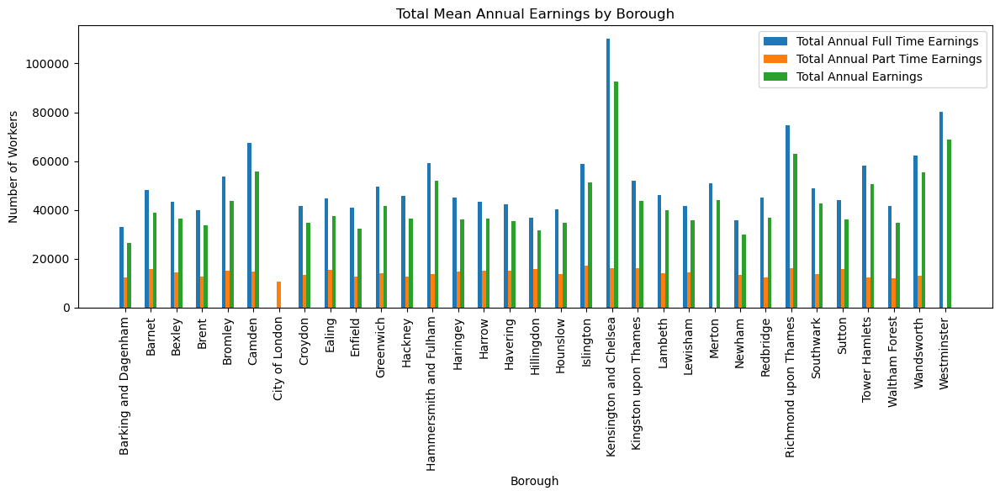

In [548]:
# create a bar chart for each column for each borough
local_authorities = earnings_mean_annualpay['local authority: county / unitary (as of April 2021)']
total_mean_annual_earnings = earnings_mean_annualpay['Total - number']
total_mean_annual_full_time_earnings = earnings_mean_annualpay['Full Time Workers - number']
total_mean_annual_part_time_earnings = earnings_mean_annualpay['Part Time Workers - number']

# Set the figure size
plt.figure(figsize=(12, 6))

# Set the number of bars and their positions
n_bars = len(local_authorities)
bar_width = 0.15
index = np.arange(n_bars)

plt.bar(index, total_mean_annual_full_time_earnings, width=bar_width, label='Total Annual Full Time Earnings')
plt.bar(index + bar_width, total_mean_annual_part_time_earnings, width=bar_width, label='Total Annual Part Time Earnings')
plt.bar(index + (2 * bar_width), total_mean_annual_earnings, width=bar_width, label='Total Annual Earnings')

# Customize the chart
plt.xlabel('Borough')
plt.ylabel('Number of Workers')
plt.title('Total Mean Annual Earnings by Borough')
plt.xticks(index + bar_width, local_authorities, rotation=90)
plt.legend()


# Show the plot
plt.tight_layout()
plt.show()

## English Indices of Deprivation 2019 by average rank

### IMD

In [561]:
# read excel file
indices_of_deprivation_IMD = pd.read_excel("../Data/Demographics/File_11_-_IoD2019_Local_Authority_District_Summaries__upper-tier__.xlsx", sheet_name='IMD',header=0)

# # extract rows that have boroughs
indices_of_deprivation_IMD = indices_of_deprivation_IMD[indices_of_deprivation_IMD['Upper Tier Local Authority District code (2019)'].isin(boroughs['borough_code'])]

# reset index
indices_of_deprivation_IMD.reset_index(drop=True,inplace=True)

indices_of_deprivation_IMD

,Upper Tier Local Authority District code (2019),Upper Tier Local Authority District name (2019),IMD - Average rank,IMD - Rank of average rank,IMD - Average score,IMD - Rank of average score,IMD - Proportion of LSOAs in most deprived 10% nationally,IMD - Rank of proportion of LSOAs in most deprived 10% nationally,IMD 2019 - Extent,IMD 2019 - Rank of extent,IMD 2019 - Local concentration,IMD 2019 - Rank of local concentration
0,E09000001,City of London,12420.52,121,14.720,126,0.0000,130,0.0322,135,24167.00,140
1,E09000002,Barking and Dagenham,25551.85,5,32.768,17,0.0364,92,0.4724,18,29391.87,86
2,E09000003,Barnet,13803.35,113,16.148,117,0.0047,126,0.0523,123,26151.40,125
3,E09000004,Bexley,13529.71,116,16.273,116,0.0000,130,0.0755,115,27051.79,119
4,E09000005,Brent,21083.02,39,25.558,61,0.0578,77,0.2074,69,29908.65,78
5,E09000006,Bromley,11297.45,132,14.163,130,0.0051,125,0.0734,116,27626.58,112
6,E09000007,Camden,16763.28,85,20.131,90,0.0000,130,0.1379,94,27872.90,110
7,E09000008,Croydon,18371.23,72,22.477,75,0.0227,104,0.1897,75,29186.80,93
8,E09000009,Ealing,18991.69,62,22.710,74,0.0204,107,0.1630,84,28827.66,100
9,E09000010,Enfield,20418.65,46,25.781,57,0.0546,80,0.2942,48,29748.46,79


In [564]:
indices_of_deprivation_IMD.columns

Index(['Upper Tier Local Authority District code (2019)',
       'Upper Tier Local Authority District name (2019)',
       'IMD - Average rank ', 'IMD - Rank of average rank ',
       'IMD - Average score ', 'IMD - Rank of average score ',
       'IMD - Proportion of LSOAs in most deprived 10% nationally ',
       'IMD - Rank of proportion of LSOAs in most deprived 10% nationally ',
       'IMD 2019 - Extent ', 'IMD 2019 - Rank of extent ',
       'IMD 2019 - Local concentration ',
       'IMD 2019 - Rank of local concentration '],
      dtype='object')

In [574]:
# print descriptive statistics
indices_of_deprivation_IMD.describe()

,IMD - Average rank,IMD - Rank of average rank,IMD - Average score,IMD - Rank of average score,IMD - Proportion of LSOAs in most deprived 10% nationally,IMD - Rank of proportion of LSOAs in most deprived 10% nationally,IMD 2019 - Extent,IMD 2019 - Rank of extent,IMD 2019 - Local concentration,IMD 2019 - Rank of local concentration
count,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000
mean,17514.279091,73.848485,21.294667,83.818182,0.021976,109.909091,0.162491,89.757576,27563.435455,107.030303
std,4745.933927,43.296306,6.073203,37.059458,0.029696,22.521328,0.120208,36.006102,2434.135251,21.487620
min,7159.190000,5.000000,9.425000,17.000000,0.000000,56.000000,0.007600,18.000000,20278.670000,67.000000
25%,13803.350000,35.000000,16.273000,57.000000,0.000000,98.000000,0.058200,67.000000,26225.860000,93.000000
50%,18371.230000,72.000000,21.526000,81.000000,0.008300,120.000000,0.163000,84.000000,28576.650000,105.000000
75%,21247.360000,113.000000,25.781000,116.000000,0.029600,130.000000,0.230500,120.000000,29186.800000,124.000000
max,25551.850000,148.000000,32.768000,148.000000,0.111100,130.000000,0.472400,145.000000,30429.890000,145.000000


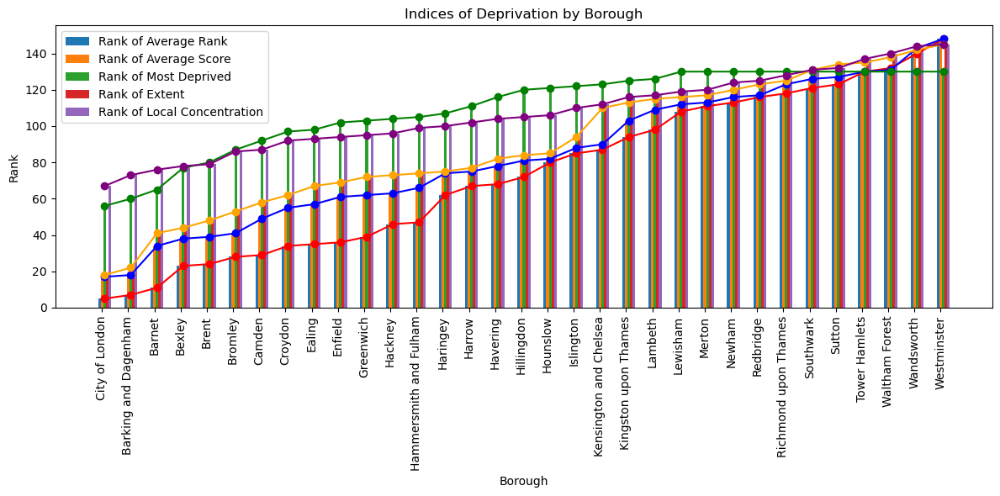

In [589]:
# create a bar chart for each rank category for each borough
local_authorities = indices_of_deprivation_IMD['Upper Tier Local Authority District name (2019)']
rank_of_average_rank = indices_of_deprivation_IMD['IMD - Rank of average rank '].sort_values()
rank_of_average_score = indices_of_deprivation_IMD['IMD - Rank of average score '].sort_values()
rank_of_most_deprived = indices_of_deprivation_IMD['IMD - Rank of proportion of LSOAs in most deprived 10% nationally '].sort_values()
rank_of_extent = indices_of_deprivation_IMD['IMD 2019 - Rank of extent '].sort_values()
rank_of_local_concentration = indices_of_deprivation_IMD['IMD 2019 - Rank of local concentration '].sort_values()

# Set the figure size
plt.figure(figsize=(12, 6))

# Set the number of bars and their positions
n_bars = len(local_authorities)
bar_width = 0.1
index = np.arange(n_bars)

plt.bar(index, rank_of_average_rank, width=bar_width, label='Rank of Average Rank')
plt.bar(index + bar_width, rank_of_average_score, width=bar_width, label='Rank of Average Score')
plt.bar(index + (2 * bar_width), rank_of_most_deprived, width=bar_width, label='Rank of Most Deprived')
plt.bar(index + (3 * bar_width), rank_of_extent, width=bar_width, label='Rank of Extent')
plt.bar(index + (4 * bar_width), rank_of_local_concentration, width=bar_width, label='Rank of Local Concentration')

# Plot the lines
plt.plot(index + (2 * bar_width), rank_of_average_rank, marker='o', linestyle='-', color='red')
plt.plot(index + (2 * bar_width), rank_of_average_score, marker='o', linestyle='-', color='blue')
plt.plot(index + (2 * bar_width), rank_of_most_deprived, marker='o', linestyle='-', color='green')
plt.plot(index + (2 * bar_width), rank_of_extent, marker='o', linestyle='-', color='orange')
plt.plot(index + (2 * bar_width), rank_of_local_concentration, marker='o', linestyle='-', color='purple')


# Customize the chart
plt.xlabel('Borough')
plt.ylabel('Rank')
plt.title('Indices of Multiple Deprivation by Borough')
plt.xticks(index + bar_width, local_authorities, rotation=90)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

### Income

In [562]:
# read excel file
indices_of_deprivation_income = pd.read_excel("../Data/Demographics/File_11_-_IoD2019_Local_Authority_District_Summaries__upper-tier__.xlsx", sheet_name='Income',header=0)

# # extract rows that have boroughs
indices_of_deprivation_income = indices_of_deprivation_income[indices_of_deprivation_income['Upper Tier Local Authority District code (2019)'].isin(boroughs['borough_code'])]

# reset index
indices_of_deprivation_income.reset_index(drop=True,inplace=True)

indices_of_deprivation_income

,Upper Tier Local Authority District code (2019),Upper Tier Local Authority District name (2019),Income - Average rank,Income - Rank of average rank,Income - Average score,Income - Rank of average score,Income - Proportion of LSOAs in most deprived 10% nationally,Income - Rank of proportion of LSOAs in most deprived 10% nationally,Income scale,Rank of Income Scale
0,E09000001,City of London,8079.96,147,0.065,144,0.0000,136,431,150
1,E09000002,Barking and Dagenham,25142.65,4,0.194,18,0.0455,99,39254,76
2,E09000003,Barnet,16104.14,91,0.111,100,0.0142,121,41746,70
3,E09000004,Bexley,14732.31,104,0.106,110,0.0068,128,25467,118
4,E09000005,Brent,21445.28,32,0.155,53,0.0867,68,50137,49
5,E09000006,Bromley,12232.82,127,0.091,125,0.0457,98,29540,108
6,E09000007,Camden,18655.58,63,0.141,69,0.0827,71,34330,89
7,E09000008,Croydon,18584.17,65,0.136,73,0.0636,82,51702,47
8,E09000009,Ealing,19531.30,49,0.140,71,0.0663,80,48235,58
9,E09000010,Enfield,21937.49,26,0.171,35,0.1311,49,56010,36


In [563]:
indices_of_deprivation_income.columns

Index(['Upper Tier Local Authority District code (2019)',
       'Upper Tier Local Authority District name (2019)',
       'Income - Average rank ', 'Income - Rank of average rank ',
       'Income - Average score ', 'Income - Rank of average score ',
       'Income - Proportion  of LSOAs in most deprived 10% nationally ',
       'Income - Rank of proportion of LSOAs in most deprived 10% nationally ',
       'Income scale', 'Rank of Income Scale'],
      dtype='object')

In [590]:
indices_of_deprivation_income.describe()

,Income - Average rank,Income - Rank of average rank,Income - Average score,Income - Rank of average score,Income - Proportion of LSOAs in most deprived 10% nationally,Income - Rank of proportion of LSOAs in most deprived 10% nationally,Income scale,Rank of Income Scale
count,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000
mean,18096.154848,67.757576,0.134091,76.575758,0.059373,92.272727,36130.242424,85.939394
std,4481.512617,43.225448,0.036168,37.711098,0.051883,30.784810,14244.725320,35.367658
min,8079.960000,4.000000,0.064000,17.000000,0.000000,33.000000,431.000000,32.000000
25%,15134.720000,32.000000,0.108000,45.000000,0.016100,71.000000,26735.000000,57.000000
50%,18655.580000,63.000000,0.136000,73.000000,0.045700,98.000000,35863.000000,83.000000
75%,21445.280000,102.000000,0.162000,107.000000,0.082700,118.000000,48333.000000,114.000000
max,25142.650000,147.000000,0.196000,146.000000,0.194400,136.000000,56769.000000,150.000000


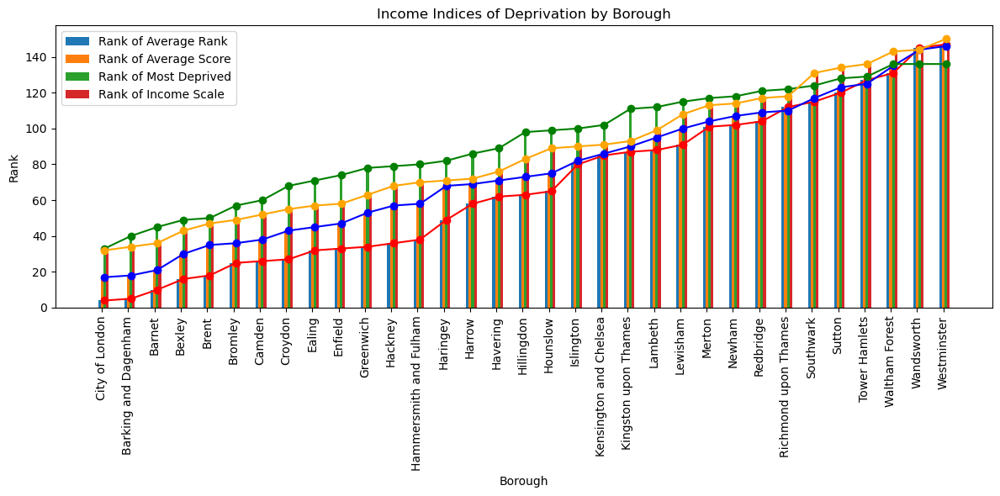

In [594]:
# create a bar chart for each rank category for each borough
local_authorities = indices_of_deprivation_income['Upper Tier Local Authority District name (2019)']
rank_of_average_rank_income = indices_of_deprivation_income['Income - Rank of average rank '].sort_values()
rank_of_average_score_income = indices_of_deprivation_income['Income - Rank of average score '].sort_values()
rank_of_most_deprived_income = indices_of_deprivation_income['Income - Rank of proportion of LSOAs in most deprived 10% nationally '].sort_values()
rank_of_scale_income = indices_of_deprivation_income['Rank of Income Scale'].sort_values()

# Set the figure size
plt.figure(figsize=(12, 6))

# Set the number of bars and their positions
n_bars = len(local_authorities)
bar_width = 0.1
index = np.arange(n_bars)

plt.bar(index, rank_of_average_rank_income, width=bar_width, label='Rank of Average Rank')
plt.bar(index + bar_width, rank_of_average_score_income, width=bar_width, label='Rank of Average Score')
plt.bar(index + (2 * bar_width), rank_of_most_deprived_income, width=bar_width, label='Rank of Most Deprived')
plt.bar(index + (3 * bar_width), rank_of_scale_income, width=bar_width, label='Rank of Income Scale')


# Plot the lines
plt.plot(index + (2 * bar_width), rank_of_average_rank_income, marker='o', linestyle='-', color='red')
plt.plot(index + (2 * bar_width), rank_of_average_score_income, marker='o', linestyle='-', color='blue')
plt.plot(index + (2 * bar_width), rank_of_most_deprived_income, marker='o', linestyle='-', color='green')
plt.plot(index + (2 * bar_width), rank_of_scale_income, marker='o', linestyle='-', color='orange')


# Customize the chart
plt.xlabel('Borough')
plt.ylabel('Rank')
plt.title('Income Indices of Deprivation by Borough')
plt.xticks(index + bar_width, local_authorities, rotation=90)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

### Employment

In [565]:
# read excel file
indices_of_deprivation_employment = pd.read_excel("../Data/Demographics/File_11_-_IoD2019_Local_Authority_District_Summaries__upper-tier__.xlsx", sheet_name='Employment',header=0)

# # extract rows that have boroughs
indices_of_deprivation_employment = indices_of_deprivation_employment[indices_of_deprivation_employment['Upper Tier Local Authority District code (2019)'].isin(boroughs['borough_code'])]

# reset index
indices_of_deprivation_employment.reset_index(drop=True,inplace=True)

indices_of_deprivation_employment

,Upper Tier Local Authority District code (2019),Upper Tier Local Authority District name (2019),Employment - Average rank,Employment - Rank of average rank,Employment - Average score,Employment - Rank of average score,Employment - Proportion of LSOAs in most deprived 10% nationally,Employment - Rank of proportion of LSOAs in most deprived 10% nationally,Employment scale,Rank of Employment Scale
0,E09000001,City of London,8325.25,145,0.052,145,0.0000,133,218.50,150
1,E09000002,Barking and Dagenham,21951.08,31,0.117,49,0.0000,133,14074.75,99
2,E09000003,Barnet,13169.08,119,0.073,122,0.0000,133,16661.00,82
3,E09000004,Bexley,13522.24,115,0.077,116,0.0068,125,10756.00,121
4,E09000005,Brent,17690.55,68,0.097,77,0.0462,86,19894.75,67
5,E09000006,Bromley,11414.44,128,0.068,127,0.0051,131,12757.50,108
6,E09000007,Camden,15925.88,89,0.091,91,0.0075,121,14945.50,92
7,E09000008,Croydon,16769.54,80,0.092,87,0.0091,116,20961.25,56
8,E09000009,Ealing,16590.67,83,0.091,89,0.0204,103,19506.75,68
9,E09000010,Enfield,18498.48,59,0.102,68,0.0164,108,20119.50,65


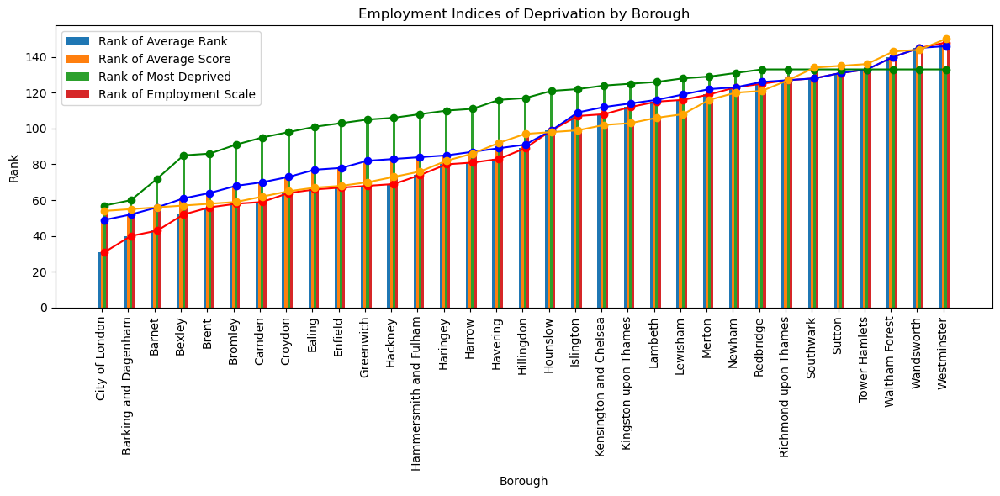

In [596]:
# create a bar chart for each rank category for each borough
local_authorities = indices_of_deprivation_income['Upper Tier Local Authority District name (2019)']
rank_of_average_rank_employment = indices_of_deprivation_employment['Employment - Rank of average rank '].sort_values()
rank_of_average_score_employment = indices_of_deprivation_employment['Employment - Rank of average score '].sort_values()
rank_of_most_deprived_employment = indices_of_deprivation_employment['Employment - Rank of proportion of LSOAs in most deprived 10% nationally '].sort_values()
rank_of_scale_employment = indices_of_deprivation_employment['Rank of Employment Scale'].sort_values()

# Set the figure size
plt.figure(figsize=(12, 6))

# Set the number of bars and their positions
n_bars = len(local_authorities)
bar_width = 0.1
index = np.arange(n_bars)

plt.bar(index, rank_of_average_rank_employment, width=bar_width, label='Rank of Average Rank')
plt.bar(index + bar_width, rank_of_average_score_employment, width=bar_width, label='Rank of Average Score')
plt.bar(index + (2 * bar_width), rank_of_most_deprived_employment, width=bar_width, label='Rank of Most Deprived')
plt.bar(index + (3 * bar_width), rank_of_scale_employment, width=bar_width, label='Rank of Employment Scale')


# Plot the lines
plt.plot(index + (2 * bar_width), rank_of_average_rank_employment, marker='o', linestyle='-', color='red')
plt.plot(index + (2 * bar_width), rank_of_average_score_employment, marker='o', linestyle='-', color='blue')
plt.plot(index + (2 * bar_width), rank_of_most_deprived_employment, marker='o', linestyle='-', color='green')
plt.plot(index + (2 * bar_width), rank_of_scale_employment, marker='o', linestyle='-', color='orange')


# Customize the chart
plt.xlabel('Borough')
plt.ylabel('Rank')
plt.title('Employment Indices of Deprivation by Borough')
plt.xticks(index + bar_width, local_authorities, rotation=90)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

### Education

In [566]:
# read excel file
indices_of_deprivation_education = pd.read_excel("../Data/Demographics/File_11_-_IoD2019_Local_Authority_District_Summaries__upper-tier__.xlsx", sheet_name='Education',header=0)

# # extract rows that have boroughs
indices_of_deprivation_education = indices_of_deprivation_education[indices_of_deprivation_education['Upper Tier Local Authority District code (2019)'].isin(boroughs['borough_code'])]

# reset index
indices_of_deprivation_education.reset_index(drop=True,inplace=True)

indices_of_deprivation_education

,Upper Tier Local Authority District code (2019),Upper Tier Local Authority District name (2019),"Education, Skills and Training - Average rank","Education, Skills and Training - Rank of average rank","Education, Skills and Training - Average score","Education, Skills and Training - Rank of average score","Education, Skills and Training - Proportion of LSOAs in most deprived 10% nationally","Education, Skills and Training - Rank of proportion of LSOAs in most deprived 10% nationally"
0,E09000001,City of London,5270.42,150,5.457,149,0.0000,120
1,E09000002,Barking and Dagenham,21696.36,21,25.513,52,0.0000,120
2,E09000003,Barnet,7894.57,145,7.830,144,0.0000,120
3,E09000004,Bexley,16899.32,72,18.331,93,0.0068,117
4,E09000005,Brent,14477.31,104,15.223,118,0.0000,120
5,E09000006,Bromley,9841.18,136,10.551,135,0.0000,120
6,E09000007,Camden,10337.67,135,10.523,136,0.0000,120
7,E09000008,Croydon,14304.06,106,15.577,117,0.0136,111
8,E09000009,Ealing,12144.39,126,12.546,127,0.0000,120
9,E09000010,Enfield,16856.02,74,20.255,80,0.0055,119


In [598]:
indices_of_deprivation_education.columns

Index(['Upper Tier Local Authority District code (2019)',
       'Upper Tier Local Authority District name (2019)',
       'Education, Skills and Training - Average rank ',
       'Education, Skills and Training - Rank of average rank ',
       'Education, Skills and Training - Average score ',
       'Education, Skills and Training - Rank of average score ',
       'Education, Skills and Training - Proportion  of LSOAs in most deprived 10% nationally',
       'Education, Skills and Training - Rank of proportion of LSOAs in most deprived 10% nationally'],
      dtype='object')

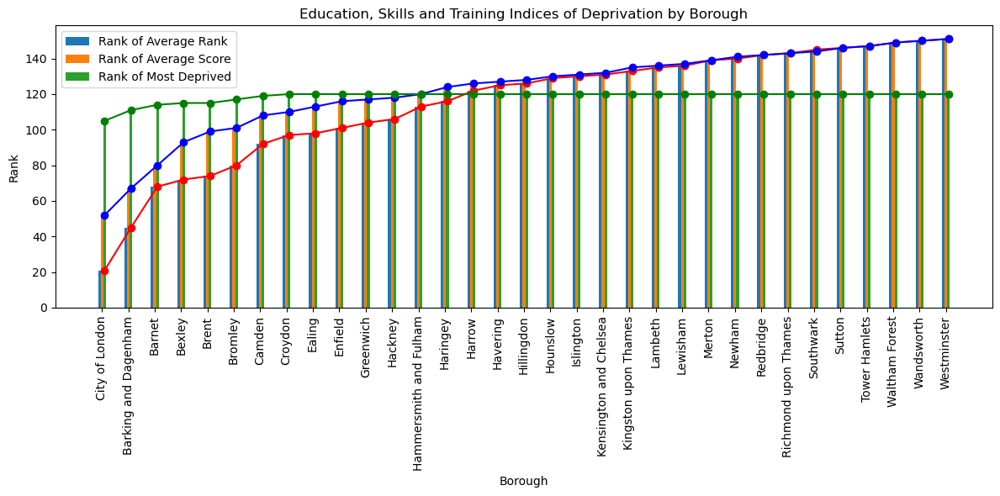

In [599]:
# create a bar chart for each rank category for each borough
local_authorities = indices_of_deprivation_income['Upper Tier Local Authority District name (2019)']
rank_of_average_rank_education = indices_of_deprivation_education['Education, Skills and Training - Rank of average rank '].sort_values()
rank_of_average_score_education = indices_of_deprivation_education['Education, Skills and Training - Rank of average score '].sort_values()
rank_of_most_deprived_education = indices_of_deprivation_education['Education, Skills and Training - Rank of proportion of LSOAs in most deprived 10% nationally'].sort_values()


# Set the figure size
plt.figure(figsize=(12, 6))

# Set the number of bars and their positions
n_bars = len(local_authorities)
bar_width = 0.1
index = np.arange(n_bars)

plt.bar(index, rank_of_average_rank_education, width=bar_width, label='Rank of Average Rank')
plt.bar(index + bar_width, rank_of_average_score_education, width=bar_width, label='Rank of Average Score')
plt.bar(index + (2 * bar_width), rank_of_most_deprived_education, width=bar_width, label='Rank of Most Deprived')


# Plot the lines
plt.plot(index + (2 * bar_width), rank_of_average_rank_education, marker='o', linestyle='-', color='blue')
plt.plot(index + (2 * bar_width), rank_of_average_score_education, marker='o', linestyle='-', color='orange')
plt.plot(index + (2 * bar_width), rank_of_most_deprived_education, marker='o', linestyle='-', color='green')


# Customize the chart
plt.xlabel('Borough')
plt.ylabel('Rank')
plt.title('Education, Skills and Training Indices of Deprivation by Borough')
plt.xticks(index + bar_width, local_authorities, rotation=90)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

### Health

In [567]:
# read excel file
indices_of_deprivation_health = pd.read_excel("../Data/Demographics/File_11_-_IoD2019_Local_Authority_District_Summaries__upper-tier__.xlsx", sheet_name='Health',header=0)

# # extract rows that have boroughs
indices_of_deprivation_health = indices_of_deprivation_health[indices_of_deprivation_health['Upper Tier Local Authority District code (2019)'].isin(boroughs['borough_code'])]

# reset index
indices_of_deprivation_health.reset_index(drop=True,inplace=True)

indices_of_deprivation_health

,Upper Tier Local Authority District code (2019),Upper Tier Local Authority District name (2019),Health Deprivation and Disability - Average rank,Health Deprivation and Disability - Rank of average rank,Health Deprivation and Disability - Average score,Health Deprivation and Disability - Rank of average score,Health Deprivation and Disability - Proportion of LSOAs in most deprived 10% nationally,Health Deprivation and Disability - Rank of proportion of LSOAs in most deprived 10% nationally
0,E09000001,City of London,8758.28,132,-0.686,131,0.0000,116
1,E09000002,Barking and Dagenham,19499.67,61,0.204,63,0.0091,101
2,E09000003,Barnet,5011.83,146,-1.074,146,0.0000,116
3,E09000004,Bexley,9446.18,126,-0.561,124,0.0000,116
4,E09000005,Brent,10642.83,120,-0.453,119,0.0000,116
5,E09000006,Bromley,6522.48,141,-0.908,141,0.0000,116
6,E09000007,Camden,10894.25,119,-0.556,123,0.0000,116
7,E09000008,Croydon,14352.64,95,-0.174,95,0.0045,115
8,E09000009,Ealing,12374.12,109,-0.326,109,0.0000,116
9,E09000010,Enfield,9915.35,123,-0.535,121,0.0000,116


In [600]:
indices_of_deprivation_health.columns

Index(['Upper Tier Local Authority District code (2019)',
       'Upper Tier Local Authority District name (2019)',
       'Health Deprivation and Disability - Average rank ',
       'Health Deprivation and Disability - Rank of average rank ',
       'Health Deprivation and Disability - Average score ',
       'Health Deprivation and Disability - Rank of average score ',
       'Health Deprivation and Disability - Proportion  of LSOAs in most deprived 10% nationally ',
       'Health Deprivation and Disability - Rank of proportion of LSOAs in most deprived 10% nationally '],
      dtype='object')

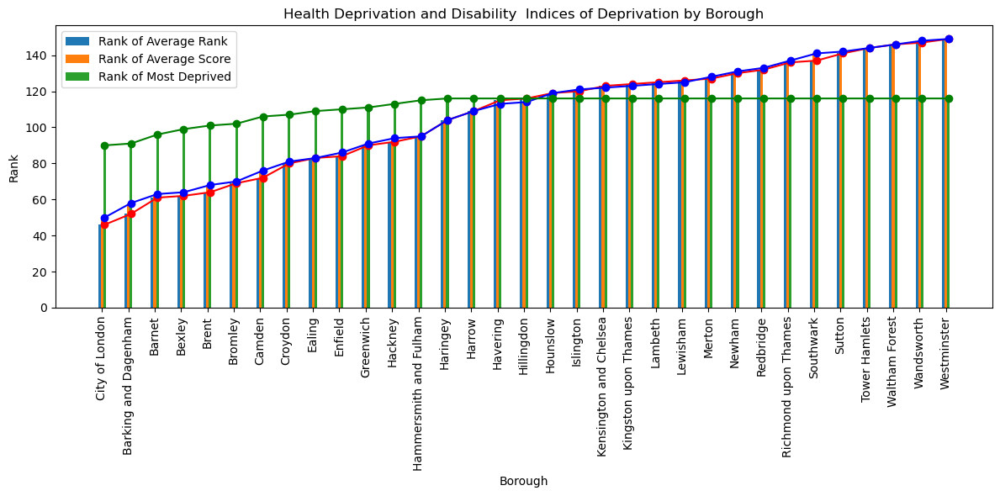

In [602]:
# create a bar chart for each rank category for each borough
local_authorities = indices_of_deprivation_health['Upper Tier Local Authority District name (2019)']
rank_of_average_rank_health = indices_of_deprivation_health['Health Deprivation and Disability - Rank of average rank '].sort_values()
rank_of_average_score_health = indices_of_deprivation_health['Health Deprivation and Disability - Rank of average score '].sort_values()
rank_of_most_deprived_health = indices_of_deprivation_health['Health Deprivation and Disability - Rank of proportion of LSOAs in most deprived 10% nationally '].sort_values()


# Set the figure size
plt.figure(figsize=(12, 6))

# Set the number of bars and their positions
n_bars = len(local_authorities)
bar_width = 0.1
index = np.arange(n_bars)

plt.bar(index, rank_of_average_rank_health, width=bar_width, label='Rank of Average Rank')
plt.bar(index + bar_width, rank_of_average_score_health, width=bar_width, label='Rank of Average Score')
plt.bar(index + (2 * bar_width), rank_of_most_deprived_health, width=bar_width, label='Rank of Most Deprived')


# Plot the lines
plt.plot(index + (2 * bar_width), rank_of_average_rank_health, marker='o', linestyle='-', color='blue')
plt.plot(index + (2 * bar_width), rank_of_average_score_health, marker='o', linestyle='-', color='orange')
plt.plot(index + (2 * bar_width), rank_of_most_deprived_health, marker='o', linestyle='-', color='green')


# Customize the chart
plt.xlabel('Borough')
plt.ylabel('Rank')
plt.title('Health Deprivation and Disability  Indices of Deprivation by Borough')
plt.xticks(index + bar_width, local_authorities, rotation=90)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

### Crime

In [568]:
# read excel file
indices_of_deprivation_crime = pd.read_excel("../Data/Demographics/File_11_-_IoD2019_Local_Authority_District_Summaries__upper-tier__.xlsx", sheet_name='Crime',header=0)

# # extract rows that have boroughs
indices_of_deprivation_crime = indices_of_deprivation_crime[indices_of_deprivation_crime['Upper Tier Local Authority District code (2019)'].isin(boroughs['borough_code'])]

# reset index
indices_of_deprivation_crime.reset_index(drop=True,inplace=True)

indices_of_deprivation_crime

,Upper Tier Local Authority District code (2019),Upper Tier Local Authority District name (2019),Crime - Average rank,Crime - Rank of average rank,Crime - Average score,Crime - Rank of average score,Crime - Proportion of LSOAs in most deprived 10% nationally,Crime - Rank of proportion of LSOAs in most deprived 10% nationally
0,E09000001,City of London,1234.77,151,-1.656,151,0.0000,138
1,E09000002,Barking and Dagenham,23668.31,18,0.542,24,0.1455,42
2,E09000003,Barnet,17479.54,82,0.082,81,0.0237,112
3,E09000004,Bexley,14596.54,108,-0.130,102,0.0205,115
4,E09000005,Brent,21996.41,37,0.428,40,0.1156,53
5,E09000006,Bromley,15906.40,87,-0.038,86,0.0558,84
6,E09000007,Camden,20400.70,57,0.325,57,0.1128,55
7,E09000008,Croydon,20068.76,60,0.280,60,0.0545,85
8,E09000009,Ealing,19489.68,64,0.239,64,0.0765,72
9,E09000010,Enfield,19084.38,67,0.199,70,0.0383,103


In [603]:
indices_of_deprivation_crime.columns

Index(['Upper Tier Local Authority District code (2019)',
       'Upper Tier Local Authority District name (2019)',
       'Crime - Average rank ', 'Crime - Rank of average rank ',
       'Crime - Average score ', 'Crime - Rank of average score ',
       'Crime - Proportion  of LSOAs in most deprived 10% nationally ',
       'Crime - Rank of proportion of LSOAs in most deprived 10% nationally '],
      dtype='object')

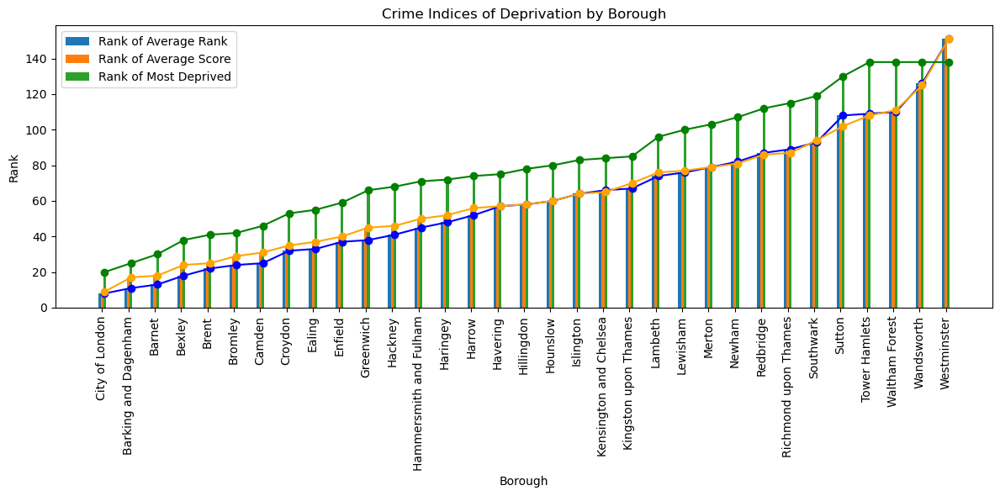

In [605]:
# create a bar chart for each rank category for each borough
local_authorities = indices_of_deprivation_crime['Upper Tier Local Authority District name (2019)']
rank_of_average_rank_crime = indices_of_deprivation_crime['Crime - Rank of average rank '].sort_values()
rank_of_average_score_crime = indices_of_deprivation_crime['Crime - Rank of average score '].sort_values()
rank_of_most_deprived_crime = indices_of_deprivation_crime['Crime - Rank of proportion of LSOAs in most deprived 10% nationally '].sort_values()


# Set the figure size
plt.figure(figsize=(12, 6))

# Set the number of bars and their positions
n_bars = len(local_authorities)
bar_width = 0.1
index = np.arange(n_bars)

plt.bar(index, rank_of_average_rank_crime, width=bar_width, label='Rank of Average Rank')
plt.bar(index + bar_width, rank_of_average_score_crime, width=bar_width, label='Rank of Average Score')
plt.bar(index + (2 * bar_width), rank_of_most_deprived_crime, width=bar_width, label='Rank of Most Deprived')


# Plot the lines
plt.plot(index + (2 * bar_width), rank_of_average_rank_crime, marker='o', linestyle='-', color='blue')
plt.plot(index + (2 * bar_width), rank_of_average_score_crime, marker='o', linestyle='-', color='orange')
plt.plot(index + (2 * bar_width), rank_of_most_deprived_crime, marker='o', linestyle='-', color='green')


# Customize the chart
plt.xlabel('Borough')
plt.ylabel('Rank')
plt.title('Crime Indices of Deprivation by Borough')
plt.xticks(index + bar_width, local_authorities, rotation=90)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

### Barriers

In [569]:
# read excel file
indices_of_deprivation_barriers = pd.read_excel("../Data/Demographics/File_11_-_IoD2019_Local_Authority_District_Summaries__upper-tier__.xlsx", sheet_name='Barriers',header=0)

# # extract rows that have boroughs
indices_of_deprivation_barriers = indices_of_deprivation_barriers[indices_of_deprivation_barriers['Upper Tier Local Authority District code (2019)'].isin(boroughs['borough_code'])]

# reset index
indices_of_deprivation_barriers.reset_index(drop=True,inplace=True)

indices_of_deprivation_barriers

,Upper Tier Local Authority District code (2019),Upper Tier Local Authority District name (2019),Barriers to Housing and Services - Average rank,Barriers to Housing and Services - Rank of average rank,Barriers to Housing and Services - Average score,Barriers to Housing and Services - Rank of average score,Barriers to Housing and Services - Proportion of LSOAs in most deprived 10% nationally,Barriers to Housing and Services - Rank of proportion of LSOAs in most deprived 10% nationally
0,E09000001,City of London,28055.83,10,35.656,10,0.6667,5
1,E09000002,Barking and Dagenham,31669.68,2,46.252,2,0.9364,3
2,E09000003,Barnet,25355.61,20,31.211,19,0.2038,20
3,E09000004,Bexley,20691.02,34,25.879,34,0.1164,42
4,E09000005,Brent,30661.44,4,42.783,3,0.7746,4
5,E09000006,Bromley,22995.08,28,27.839,28,0.1015,46
6,E09000007,Camden,17780.12,60,21.611,72,0.0000,117
7,E09000008,Croydon,27123.37,15,33.996,14,0.3773,14
8,E09000009,Ealing,28039.43,11,36.520,6,0.4592,9
9,E09000010,Enfield,29478.86,5,39.666,5,0.6066,6


In [606]:
indices_of_deprivation_barriers.columns

Index(['Upper Tier Local Authority District code (2019)',
       'Upper Tier Local Authority District name (2019)',
       'Barriers to Housing and Services - Average rank ',
       'Barriers to Housing and Services - Rank of average rank ',
       'Barriers to Housing and Services - Average score ',
       'Barriers to Housing and Services - Rank of average score ',
       'Barriers to Housing and Services - Proportion  of LSOAs in most deprived 10% nationally ',
       'Barriers to Housing and Services - Rank of proportion of LSOAs in most deprived 10% nationally '],
      dtype='object')

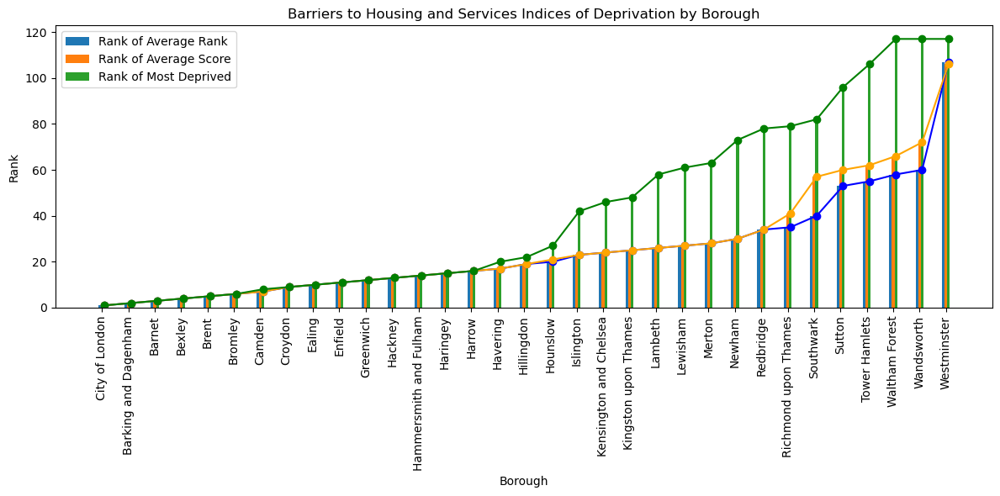

In [607]:
# create a bar chart for each rank category for each borough
local_authorities = indices_of_deprivation_barriers['Upper Tier Local Authority District name (2019)']
rank_of_average_rank_barriers = indices_of_deprivation_barriers['Barriers to Housing and Services - Rank of average rank '].sort_values()
rank_of_average_score_barriers = indices_of_deprivation_barriers['Barriers to Housing and Services - Rank of average score '].sort_values()
rank_of_most_deprived_barriers = indices_of_deprivation_barriers['Barriers to Housing and Services - Rank of proportion of LSOAs in most deprived 10% nationally '].sort_values()


# Set the figure size
plt.figure(figsize=(12, 6))

# Set the number of bars and their positions
n_bars = len(local_authorities)
bar_width = 0.1
index = np.arange(n_bars)

plt.bar(index, rank_of_average_rank_barriers, width=bar_width, label='Rank of Average Rank')
plt.bar(index + bar_width, rank_of_average_score_barriers, width=bar_width, label='Rank of Average Score')
plt.bar(index + (2 * bar_width), rank_of_most_deprived_barriers, width=bar_width, label='Rank of Most Deprived')


# Plot the lines
plt.plot(index + (2 * bar_width), rank_of_average_rank_barriers, marker='o', linestyle='-', color='blue')
plt.plot(index + (2 * bar_width), rank_of_average_score_barriers, marker='o', linestyle='-', color='orange')
plt.plot(index + (2 * bar_width), rank_of_most_deprived_barriers, marker='o', linestyle='-', color='green')


# Customize the chart
plt.xlabel('Borough')
plt.ylabel('Rank')
plt.title('Barriers to Housing and Services Indices of Deprivation by Borough')
plt.xticks(index + bar_width, local_authorities, rotation=90)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

### Living

In [570]:
# read excel file
indices_of_deprivation_living = pd.read_excel("../Data/Demographics/File_11_-_IoD2019_Local_Authority_District_Summaries__upper-tier__.xlsx", sheet_name='Living',header=0)

# # extract rows that have boroughs
indices_of_deprivation_living = indices_of_deprivation_living[indices_of_deprivation_living['Upper Tier Local Authority District code (2019)'].isin(boroughs['borough_code'])]

# reset index
indices_of_deprivation_living.reset_index(drop=True,inplace=True)

indices_of_deprivation_living

,Upper Tier Local Authority District code (2019),Upper Tier Local Authority District name (2019),Living Environment - Average rank,Living Environment - Rank of average rank,Living Environment - Average score,Living Environment - Rank of average score,Living Environment - Proportion of LSOAs in most deprived 10% nationally,Living Environment - Rank of proportion of LSOAs in most deprived 10% nationally
0,E09000001,City of London,26411.20,9,38.972,10,0.3333,13
1,E09000002,Barking and Dagenham,23068.52,33,29.103,37,0.0364,89
2,E09000003,Barnet,20275.30,50,24.662,61,0.0237,103
3,E09000004,Bexley,16997.02,76,19.754,86,0.0000,132
4,E09000005,Brent,22811.33,37,28.694,38,0.0289,98
5,E09000006,Bromley,15732.96,85,18.370,93,0.0000,132
6,E09000007,Camden,24878.54,19,33.469,24,0.1429,38
7,E09000008,Croydon,20381.04,48,26.027,52,0.0636,64
8,E09000009,Ealing,23725.05,28,30.340,33,0.0408,84
9,E09000010,Enfield,21993.30,40,27.479,46,0.0273,99


In [608]:
indices_of_deprivation_living.columns

Index(['Upper Tier Local Authority District code (2019)',
       'Upper Tier Local Authority District name (2019)',
       'Living Environment - Average rank ',
       'Living Environment - Rank of average rank ',
       'Living Environment - Average score ',
       'Living Environment - Rank of average score ',
       'Living Environment - Proportion  of LSOAs in most deprived 10% nationally ',
       'Living Environment - Rank of proportion of LSOAs in most deprived 10% nationally '],
      dtype='object')

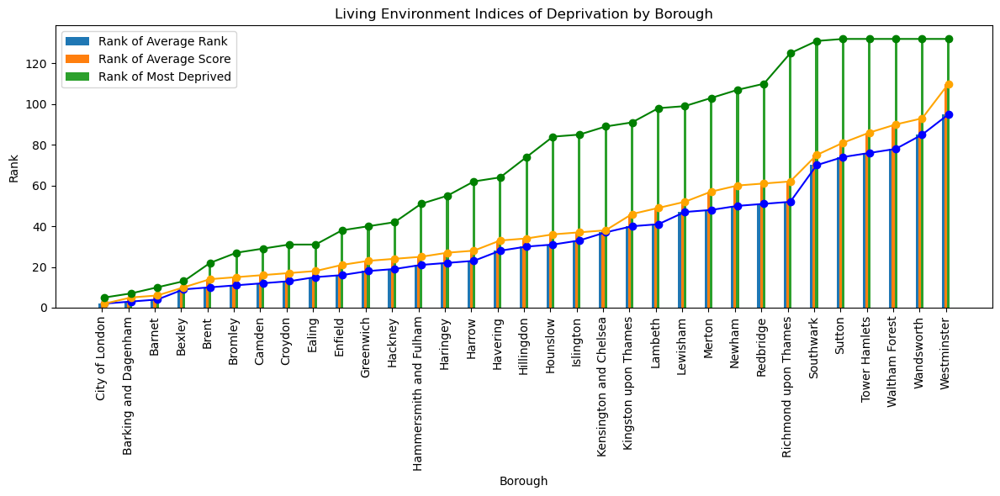

In [609]:
# create a bar chart for each rank category for each borough
local_authorities = indices_of_deprivation_living['Upper Tier Local Authority District name (2019)']
rank_of_average_rank_living = indices_of_deprivation_living['Living Environment - Rank of average rank '].sort_values()
rank_of_average_score_living = indices_of_deprivation_living['Living Environment - Rank of average score '].sort_values()
rank_of_most_deprived_living = indices_of_deprivation_living['Living Environment - Rank of proportion of LSOAs in most deprived 10% nationally '].sort_values()


# Set the figure size
plt.figure(figsize=(12, 6))

# Set the number of bars and their positions
n_bars = len(local_authorities)
bar_width = 0.1
index = np.arange(n_bars)

plt.bar(index, rank_of_average_rank_living, width=bar_width, label='Rank of Average Rank')
plt.bar(index + bar_width, rank_of_average_score_living, width=bar_width, label='Rank of Average Score')
plt.bar(index + (2 * bar_width), rank_of_most_deprived_living, width=bar_width, label='Rank of Most Deprived')


# Plot the lines
plt.plot(index + (2 * bar_width), rank_of_average_rank_living, marker='o', linestyle='-', color='blue')
plt.plot(index + (2 * bar_width), rank_of_average_score_living, marker='o', linestyle='-', color='orange')
plt.plot(index + (2 * bar_width), rank_of_most_deprived_living, marker='o', linestyle='-', color='green')


# Customize the chart
plt.xlabel('Borough')
plt.ylabel('Rank')
plt.title('Living Environment Indices of Deprivation by Borough')
plt.xticks(index + bar_width, local_authorities, rotation=90)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

### IDACI

In [571]:
# read excel file
indices_of_deprivation_IDACI = pd.read_excel("../Data/Demographics/File_11_-_IoD2019_Local_Authority_District_Summaries__upper-tier__.xlsx", sheet_name='IDACI',header=0)

# # extract rows that have boroughs
indices_of_deprivation_IDACI = indices_of_deprivation_IDACI[indices_of_deprivation_IDACI['Upper Tier Local Authority District code (2019)'].isin(boroughs['borough_code'])]

# reset index
indices_of_deprivation_IDACI.reset_index(drop=True,inplace=True)

indices_of_deprivation_IDACI

,Upper Tier Local Authority District code (2019),Upper Tier Local Authority District name (2019),IDACI - Average rank,IDACI - Rank of average rank,IDACI - Average score,IDACI - Rank of average score,IDACI - Proportion of LSOAs in most deprived 10% nationally,IDACI - Rank of proportion of LSOAs in most deprived 10% nationally
0,E09000001,City of London,7398.40,149,0.071,147,0.0000,137
1,E09000002,Barking and Dagenham,24727.80,11,0.238,26,0.0545,95
2,E09000003,Barnet,14486.14,115,0.126,117,0.0047,135
3,E09000004,Bexley,17481.41,83,0.160,86,0.0205,118
4,E09000005,Brent,20216.70,52,0.182,73,0.0405,106
5,E09000006,Bromley,13714.05,122,0.131,114,0.0660,89
6,E09000007,Camden,19570.60,62,0.193,63,0.0977,67
7,E09000008,Croydon,19856.54,58,0.185,70,0.0636,90
8,E09000009,Ealing,18645.10,75,0.166,82,0.0357,111
9,E09000010,Enfield,22900.69,24,0.225,36,0.0710,82


In [610]:
indices_of_deprivation_IDACI.columns

Index(['Upper Tier Local Authority District code (2019)',
       'Upper Tier Local Authority District name (2019)',
       'IDACI - Average rank ', 'IDACI - Rank of average rank ',
       'IDACI - Average score ', 'IDACI - Rank of average score ',
       'IDACI - Proportion  of LSOAs in most deprived 10% nationally ',
       'IDACI - Rank of proportion of LSOAs in most deprived 10% nationally '],
      dtype='object')

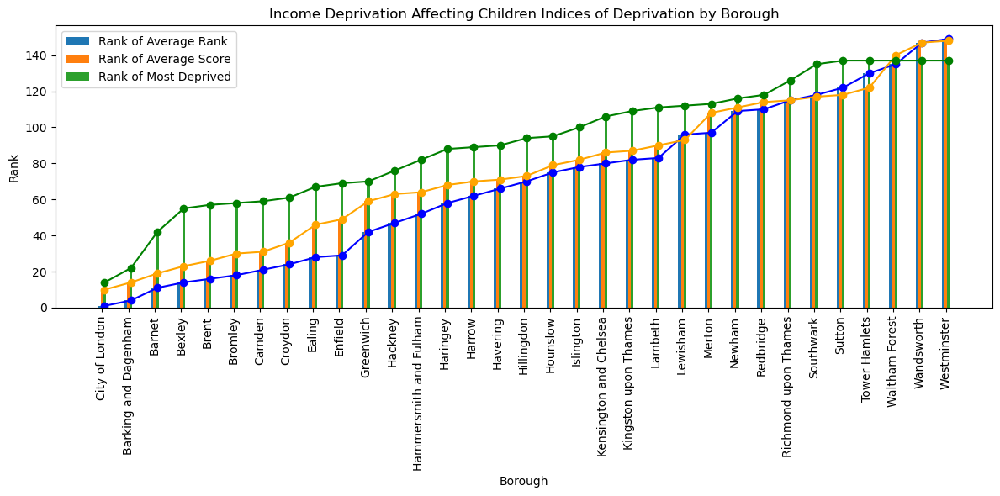

In [611]:
# create a bar chart for each rank category for each borough
local_authorities = indices_of_deprivation_IDACI['Upper Tier Local Authority District name (2019)']
rank_of_average_rank_IDACI = indices_of_deprivation_IDACI['IDACI - Rank of average rank '].sort_values()
rank_of_average_score_IDACI = indices_of_deprivation_IDACI['IDACI - Rank of average score '].sort_values()
rank_of_most_deprived_IDACI = indices_of_deprivation_IDACI['IDACI - Rank of proportion of LSOAs in most deprived 10% nationally '].sort_values()


# Set the figure size
plt.figure(figsize=(12, 6))

# Set the number of bars and their positions
n_bars = len(local_authorities)
bar_width = 0.1
index = np.arange(n_bars)

plt.bar(index, rank_of_average_rank_IDACI, width=bar_width, label='Rank of Average Rank')
plt.bar(index + bar_width, rank_of_average_score_IDACI, width=bar_width, label='Rank of Average Score')
plt.bar(index + (2 * bar_width), rank_of_most_deprived_IDACI, width=bar_width, label='Rank of Most Deprived')


# Plot the lines
plt.plot(index + (2 * bar_width), rank_of_average_rank_IDACI, marker='o', linestyle='-', color='blue')
plt.plot(index + (2 * bar_width), rank_of_average_score_IDACI, marker='o', linestyle='-', color='orange')
plt.plot(index + (2 * bar_width), rank_of_most_deprived_IDACI, marker='o', linestyle='-', color='green')


# Customize the chart
plt.xlabel('Borough')
plt.ylabel('Rank')
plt.title('Income Deprivation Affecting Children Indices of Deprivation by Borough')
plt.xticks(index + bar_width, local_authorities, rotation=90)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

### IDAOPI

In [572]:
# read excel file
indices_of_deprivation_IDAOPI = pd.read_excel("../Data/Demographics/File_11_-_IoD2019_Local_Authority_District_Summaries__upper-tier__.xlsx", sheet_name='IDAOPI',header=0)

# # extract rows that have boroughs
indices_of_deprivation_IDAOPI = indices_of_deprivation_IDAOPI[indices_of_deprivation_IDAOPI['Upper Tier Local Authority District code (2019)'].isin(boroughs['borough_code'])]

# reset index
indices_of_deprivation_IDAOPI.reset_index(drop=True,inplace=True)

indices_of_deprivation_IDAOPI

,Upper Tier Local Authority District code (2019),Upper Tier Local Authority District name (2019),IDAOPI - Average rank,IDAOPI - Rank of average rank,IDAOPI - Average score,IDAOPI - Rank of average score,IDAOPI - Proportion of LSOAs in most deprived 10% nationally,IDAOPI - Rank of proportion of LSOAs in most deprived 10% nationally
0,E09000001,City of London,7722.21,146,0.083,143,0.0000,139
1,E09000002,Barking and Dagenham,25602.05,9,0.261,12,0.1636,42
2,E09000003,Barnet,17645.37,59,0.163,70,0.0664,75
3,E09000004,Bexley,12113.23,113,0.109,116,0.0205,107
4,E09000005,Brent,25010.04,12,0.258,15,0.2023,33
5,E09000006,Bromley,10682.33,129,0.101,126,0.0254,101
6,E09000007,Camden,21767.16,27,0.232,23,0.2406,22
7,E09000008,Croydon,16098.54,80,0.156,77,0.0727,71
8,E09000009,Ealing,22272.54,23,0.223,29,0.1582,43
9,E09000010,Enfield,21091.21,31,0.210,37,0.1749,38


In [612]:
indices_of_deprivation_IDAOPI.columns  

Index(['Upper Tier Local Authority District code (2019)',
       'Upper Tier Local Authority District name (2019)',
       'IDAOPI - Average rank ', 'IDAOPI - Rank of average rank ',
       'IDAOPI - Average score ', 'IDAOPI - Rank of average score ',
       'IDAOPI - Proportion  of LSOAs in most deprived 10% nationally ',
       'IDAOPI - Rank of proportion of LSOAs in most deprived 10% nationally '],
      dtype='object')

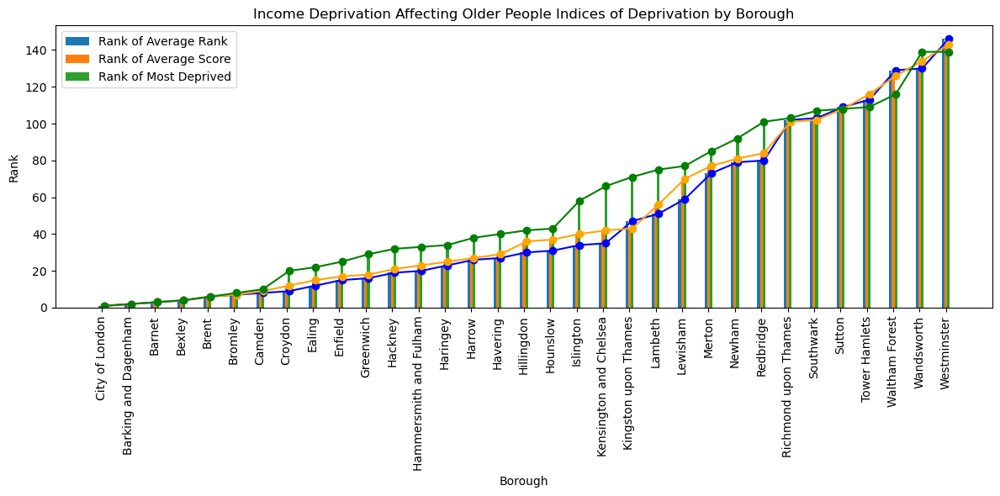

In [613]:
# create a bar chart for each rank category for each borough
local_authorities = indices_of_deprivation_IDAOPI['Upper Tier Local Authority District name (2019)']
rank_of_average_rank_IDAOPI = indices_of_deprivation_IDAOPI['IDAOPI - Rank of average rank '].sort_values()
rank_of_average_score_IDAOPI = indices_of_deprivation_IDAOPI['IDAOPI - Rank of average score '].sort_values()
rank_of_most_deprived_IDAOPI = indices_of_deprivation_IDAOPI['IDAOPI - Rank of proportion of LSOAs in most deprived 10% nationally '].sort_values()


# Set the figure size
plt.figure(figsize=(12, 6))

# Set the number of bars and their positions
n_bars = len(local_authorities)
bar_width = 0.1
index = np.arange(n_bars)

plt.bar(index, rank_of_average_rank_IDAOPI, width=bar_width, label='Rank of Average Rank')
plt.bar(index + bar_width, rank_of_average_score_IDAOPI, width=bar_width, label='Rank of Average Score')
plt.bar(index + (2 * bar_width), rank_of_most_deprived_IDAOPI, width=bar_width, label='Rank of Most Deprived')


# Plot the lines
plt.plot(index + (2 * bar_width), rank_of_average_rank_IDAOPI, marker='o', linestyle='-', color='blue')
plt.plot(index + (2 * bar_width), rank_of_average_score_IDAOPI, marker='o', linestyle='-', color='orange')
plt.plot(index + (2 * bar_width), rank_of_most_deprived_IDAOPI, marker='o', linestyle='-', color='green')


# Customize the chart
plt.xlabel('Borough')
plt.ylabel('Rank')
plt.title('Income Deprivation Affecting Older People Indices of Deprivation by Borough')
plt.xticks(index + bar_width, local_authorities, rotation=90)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

In [614]:
# concatenate all the indices of deprivation dataframes without first 2 columns
indices_of_deprivation = pd.concat([indices_of_deprivation_IMD,indices_of_deprivation_income.iloc[:,2:],indices_of_deprivation_employment.iloc[:,2:],indices_of_deprivation_education.iloc[:,2:],indices_of_deprivation_health.iloc[:,2:],indices_of_deprivation_crime.iloc[:,2:],indices_of_deprivation_barriers.iloc[:,2:],indices_of_deprivation_living.iloc[:,2:],indices_of_deprivation_IDACI.iloc[:,2:],indices_of_deprivation_IDAOPI.iloc[:,2:]],axis=1)

indices_of_deprivation.head()

,Upper Tier Local Authority District code (2019),Upper Tier Local Authority District name (2019),IMD - Average rank,IMD - Rank of average rank,IMD - Average score,IMD - Rank of average score,IMD - Proportion of LSOAs in most deprived 10% nationally,IMD - Rank of proportion of LSOAs in most deprived 10% nationally,IMD 2019 - Extent,IMD 2019 - Rank of extent,...,IDACI - Average score,IDACI - Rank of average score,IDACI - Proportion of LSOAs in most deprived 10% nationally,IDACI - Rank of proportion of LSOAs in most deprived 10% nationally,IDAOPI - Average rank,IDAOPI - Rank of average rank,IDAOPI - Average score,IDAOPI - Rank of average score,IDAOPI - Proportion of LSOAs in most deprived 10% nationally,IDAOPI - Rank of proportion of LSOAs in most deprived 10% nationally
0,E09000001,City of London,12420.52,121,14.720,126,0.0000,130,0.0322,135,...,0.071,147,0.0000,137,7722.21,146,0.083,143,0.0000,139
1,E09000002,Barking and Dagenham,25551.85,5,32.768,17,0.0364,92,0.4724,18,...,0.238,26,0.0545,95,25602.05,9,0.261,12,0.1636,42
2,E09000003,Barnet,13803.35,113,16.148,117,0.0047,126,0.0523,123,...,0.126,117,0.0047,135,17645.37,59,0.163,70,0.0664,75
3,E09000004,Bexley,13529.71,116,16.273,116,0.0000,130,0.0755,115,...,0.160,86,0.0205,118,12113.23,113,0.109,116,0.0205,107
4,E09000005,Brent,21083.02,39,25.558,61,0.0578,77,0.2074,69,...,0.182,73,0.0405,106,25010.04,12,0.258,15,0.2023,33


In [617]:
indices_of_deprivation.columns

Index(['Upper Tier Local Authority District code (2019)',
       'Upper Tier Local Authority District name (2019)',
       'IMD - Average rank ', 'IMD - Rank of average rank ',
       'IMD - Average score ', 'IMD - Rank of average score ',
       'IMD - Proportion of LSOAs in most deprived 10% nationally ',
       'IMD - Rank of proportion of LSOAs in most deprived 10% nationally ',
       'IMD 2019 - Extent ', 'IMD 2019 - Rank of extent ',
       'IMD 2019 - Local concentration ',
       'IMD 2019 - Rank of local concentration ', 'Income - Average rank ',
       'Income - Rank of average rank ', 'Income - Average score ',
       'Income - Rank of average score ',
       'Income - Proportion  of LSOAs in most deprived 10% nationally ',
       'Income - Rank of proportion of LSOAs in most deprived 10% nationally ',
       'Income scale', 'Rank of Income Scale', 'Employment - Average rank ',
       'Employment - Rank of average rank ', 'Employment - Average score ',
       'Employment - 

In [623]:
#  drop rank columns
indices_of_deprivation.drop(indices_of_deprivation.columns[indices_of_deprivation.columns.str.contains('Rank of',case = False)],axis = 1, inplace = True)

indices_of_deprivation.columns

Index(['Upper Tier Local Authority District code (2019)',
       'Upper Tier Local Authority District name (2019)',
       'IMD - Average rank ', 'IMD - Average score ',
       'IMD - Proportion of LSOAs in most deprived 10% nationally ',
       'IMD 2019 - Extent ', 'IMD 2019 - Local concentration ',
       'Income - Average rank ', 'Income - Average score ',
       'Income - Proportion  of LSOAs in most deprived 10% nationally ',
       'Income scale', 'Employment - Average rank ',
       'Employment - Average score ',
       'Employment - Proportion  of LSOAs in most deprived 10% nationally ',
       'Employment scale ', 'Education, Skills and Training - Average rank ',
       'Education, Skills and Training - Average score ',
       'Education, Skills and Training - Proportion  of LSOAs in most deprived 10% nationally',
       'Health Deprivation and Disability - Average rank ',
       'Health Deprivation and Disability - Average score ',
       'Health Deprivation and Disability -

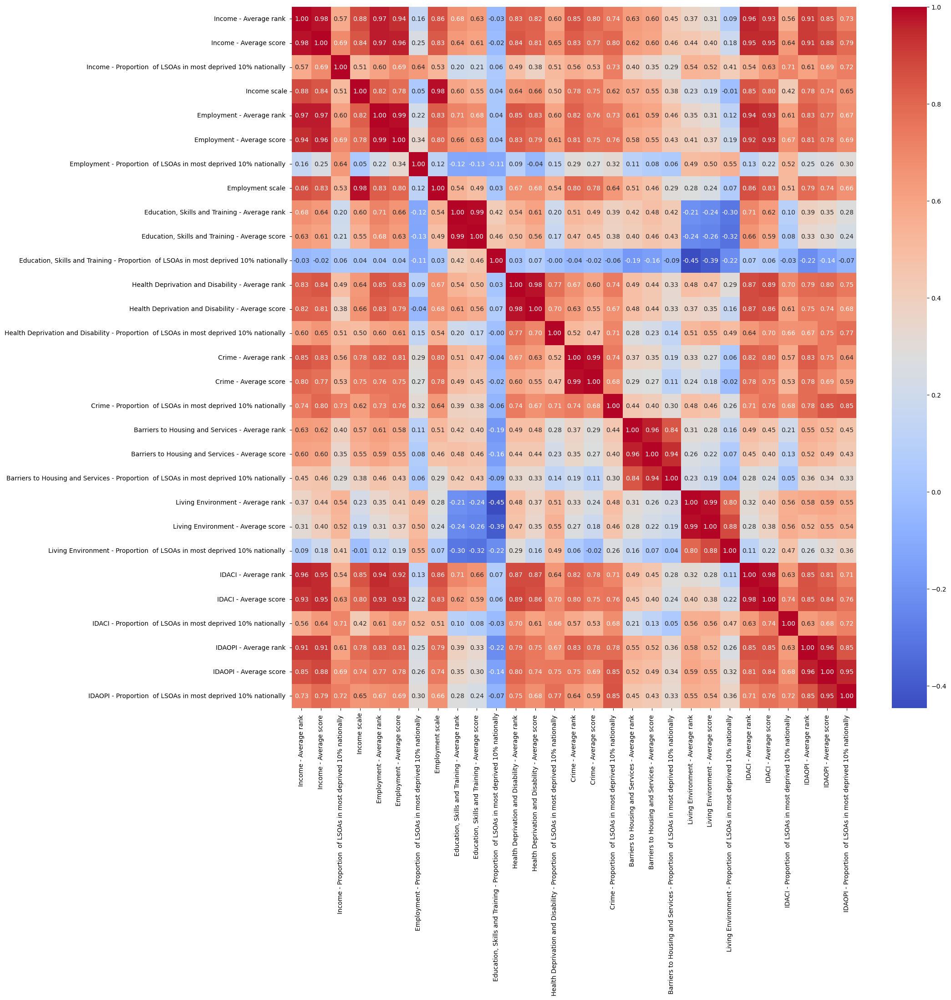

In [626]:
# plot confusion matrix excluding the first 2 columns
plt.figure(figsize=(20,20))
sns.heatmap(indices_of_deprivation.iloc[:,7:].corr(),annot=True,fmt='.2f',cmap='coolwarm')
plt.show()



In [628]:
indices_of_deprivation.iloc[:,7:].corr()

# copy results to clipboard
indices_of_deprivation.iloc[:,7:].corr().to_clipboard()

In [631]:
# scatter plot matrix for income and employment
sns.pairplot(indices_of_deprivation.iloc[:,7:])
plt.show()